# Feature Pipeline v3 — 3-Class Maneuver Classification

**Primary feature-assembly and benchmarking notebook for the final 3-class task**
(`straight`, `left-turn`, `right-turn`). This is where the base and engineered features are
aligned, QA'd, combined, and benchmarked to choose the feature set used in the report.

**Where it sits in the pipeline**
1. `waymo_feature_extraction.ipynb` — extracts the base arrays (HOG / HSV / YOLO / road).
2. `framediff_v2_3class.ipynb` — extracts the temporal Trend + Flow features.
3. **This notebook** — filters everything to the 3 classes, builds the engineered features, and runs the benchmark.

**Inputs** (from `data/processed/waymo_e2e/features/`, produced upstream): base `hog.npy`,
`hsv.npy`, `yolo.npy`, `road.npy`, `labels.npy`, `seq_ids.npy`; optional learned embeddings
(`cnn_embedding.npy`, `mobilenetv2_embedding.npy`, `vit_embedding.npy`, `dino_v2_3class.npy`)
included in the benchmark only if already present on disk.

**Outputs** (all `_3class`-suffixed, each written with a companion `seq_ids` array):
`seq_ids_3class.npy`, `labels_3class.npy`, engineered features (`road_v2_3class.npy`,
`vehicle_occupancy_3class.npy`, `scene_cue_segmented_3class.npy`, `traffic_law_3class.npy`,
`corridor_combined_3class.npy`, `drivable_3class.npy`, `ipm_3class.npy`,
`bev_corridor_3class.npy`), and the chosen final matrix `X_final_3class.npy`
(+ `labels_final_3class.npy`, `seq_ids_final_3class.npy`).

**Result on the 3-class task:** among static features, **HOG / SVM ≈ 0.60 accuracy
(macro-F1 ≈ 0.55)** is the strongest single set (majority-class baseline 0.46). The overall
best model comes from adding the temporal features from `framediff_v2_3class.ipynb`
(**Trend + Flow / Random Forest ≈ 0.65 accuracy, 0.59 macro-F1**).

**Run:** requires the base arrays on disk — run `waymo_feature_extraction.ipynb` first, or
pull the feature `.npy` files from the team Google Drive. Kernel `281-s2-group2`, with
`KMP_DUPLICATE_LIB_OK=TRUE` set in the shell before launching Jupyter. See the repo README
for full setup.

---

### Scope decisions (confirmed with the project owner)
- Day and night sequences are **both kept** — no lighting filter (the daytime-only
  filtering in `archive/Waymo_feature_extraction_v2.ipynb` is *not* used here).
- Rather than assuming which "v2" feature is best, this notebook **re-benchmarks every
  candidate feature set on the 3-class subset specifically**, since the prior 5-class
  results don't necessarily transfer (e.g. `road_v2` did not clearly beat `road` v1 on the
  5-class problem, and the frame-difference trend feature was originally built to chase
  `lane-change-*` separability — a class that no longer exists in this task).

### Sources consulted, and what was reused
*(The three source notebooks below now live in `archive/`; `waymo_feature_extraction.ipynb`
remains the current base extractor.)*

| Source notebook | What this notebook reuses from it |
|---|---|
| `waymo_feature_extraction.ipynb` *(current)* | Canonical v1 feature functions (`extract_hog`, `extract_hsv_histogram`, `extract_yolo_features`, `detect_edges_and_lines`, `estimate_vanishing_point`, `get_robust_seed_color`, `segment_road`) and the base `hog` / `hsv` / `yolo` / `road` / `labels` / `seq_ids` arrays. |
| `archive/feature_exploration_update.ipynb` | `road_v2` (adaptive-ROI, inlier-filtered Hough/VP) and `vehicle_occupancy` feature definitions. |
| `archive/framediff.ipynb` | The 5-quantity per-frame signal (`road_centroid_x`, `road_area_frac`, `vp_x`, `det_mean_x`, `det_lr_balance`) and the multi-frame linear-trend feature built on it. |
| `archive/Waymo_feature_extraction_v2.ipynb` | The alignment/QA pattern (verify `seq_ids` against the manifest before trusting an array). Its day/night logic is **not applied** here. |

### QA philosophy
Every engineered feature gets (1) a **structural** check — shapes, alignment to `seq_ids`,
NaN/Inf, value ranges — and (2) a **semantic** check — does the feature move the way its
docstring claims for this specific 3-class problem? Two issues found while porting code
across the source notebooks are fixed inline: (1) a single canonical `segment_road` is used
everywhere, rather than a copy that silently dropped `road_width_bottom` / `road_width_mid`;
(2) every new array is written with an explicit `seq_ids` companion instead of trusting
stable `manifest.items()` ordering, with a QA cell that verifies that assumption.

## 0. Setup

In [1]:
import os
os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'
os.makedirs('outputs', exist_ok=True)

import json
import time
import warnings
from collections import Counter, defaultdict

import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
from standard_e2e import Modality

TRAIN_DIR     = '../data/processed/waymo_e2e/training/'
MANIFEST_PATH = '../data/train_manifest.json'
FEATURES_DIR  = '../data/processed/waymo_e2e/features/'
os.makedirs(FEATURES_DIR, exist_ok=True)

# --- New 3-class task ---
CLASSES = ['straight', 'left-turn', 'right-turn']
COLORS = {'straight': 'steelblue', 'left-turn': 'tomato', 'right-turn': 'green'}
RANDOM_STATE = 42

with open(MANIFEST_PATH, 'r') as f:
    manifest = json.load(f)

print(f'Loaded {len(manifest)} sequences from manifest')
print('Full label distribution (all classes, day+night):')
print(Counter(v['label'] for v in manifest.values()))
print(f'\nNew task classes: {CLASSES}')
print('Lighting filter: NONE — day and night sequences are both kept for this task.')


Loaded 2037 sequences from manifest
Full label distribution (all classes, day+night):
Counter({'straight': 745, 'right-turn': 467, 'left-turn': 392, 'lane-change-right': 222, 'lane-change-left': 200, 'stationary': 11})

New task classes: ['straight', 'left-turn', 'right-turn']
Lighting filter: NONE — day and night sequences are both kept for this task.


## 1. QA Block 0 — Provenance & alignment audit of the existing base arrays

Before subsetting anything, confirm the base feature arrays (`hog.npy`, `hsv.npy`,
`yolo.npy`, `road.npy`, `labels.npy`, `seq_ids.npy` — produced by
`waymo_feature_extraction.ipynb`) are actually what they claim to be: right shape, right
dtype, aligned to the manifest, no missing/garbage values. Every downstream step in this
notebook depends on these being trustworthy, so this check is not optional.

In [2]:
BASE_FILES = {
    'hog': 'hog.npy',
    'hsv': 'hsv.npy',
    'yolo': 'yolo.npy',
    'road': 'road.npy',
    'labels': 'labels.npy',
    'seq_ids': 'seq_ids.npy',
}

missing = [f for f in BASE_FILES.values() if not os.path.exists(os.path.join(FEATURES_DIR, f))]
if missing:
    raise FileNotFoundError(
        'Missing base feature files: ' + ', '.join(missing) +
        '\nRun the extraction loop in waymo_feature_extraction.ipynb first.'
    )

base = {
    name: np.load(os.path.join(FEATURES_DIR, filename),
                   allow_pickle=name in {'labels', 'seq_ids'})
    for name, filename in BASE_FILES.items()
}
base['labels'] = base['labels'].astype(str)
base['seq_ids'] = base['seq_ids'].astype(str)

qa_rows = []

# --- Check 1: row counts match across all base arrays ---
row_counts = {name: len(v) for name, v in base.items()}
aligned = len(set(row_counts.values())) == 1
qa_rows.append(('base arrays row-count aligned', aligned, row_counts))
if not aligned:
    raise ValueError(f'Base feature arrays are not row-aligned: {row_counts}')

# --- Check 2: seq_ids.npy matches a fresh iteration of manifest.items() ---
# feature_exploration_update.ipynb and framediff.ipynb both assume this holds
# (they never re-derive or re-save seq_ids alongside new arrays); verify it here
# rather than trusting it silently downstream.
fresh_manifest_order = np.array(list(manifest.keys()))
if len(fresh_manifest_order) == len(base['seq_ids']):
    order_matches = bool(np.array_equal(fresh_manifest_order, base['seq_ids']))
else:
    order_matches = False
qa_rows.append((
    'seq_ids.npy order == manifest.items() order',
    order_matches,
    f'{len(fresh_manifest_order)} manifest keys vs {len(base["seq_ids"])} seq_ids rows'
))

# --- Check 3: labels.npy matches manifest[seq_id]['label'] row-for-row ---
manifest_labels = np.array([manifest[sid]['label'] for sid in base['seq_ids']])
label_mismatches = int(np.sum(manifest_labels != base['labels']))
qa_rows.append(('labels.npy matches manifest per-row', label_mismatches == 0, f'{label_mismatches} mismatches'))

# --- Check 4: no NaN / Inf in any numeric feature array ---
for name in ['hog', 'hsv', 'yolo', 'road']:
    arr = base[name]
    n_bad = int(np.sum(~np.isfinite(arr)))
    qa_rows.append((f'{name}.npy finite (no NaN/Inf)', n_bad == 0, f'{n_bad} bad values / {arr.size} total'))

# --- Check 5: feature dimensionality matches what the extraction functions imply ---
# HSV_BINS = (18, 8, 8) -> 34 dims; DRIVING_CLASSES has 8 entries x 4 stats -> 32 dims.
expected_dims = {'hsv': 18 + 8 + 8, 'yolo': 8 * 4}
for name, expected in expected_dims.items():
    actual = base[name].shape[1]
    qa_rows.append((f'{name}.npy dim == {expected} (from extractor definition)', actual == expected,
                     f'actual={actual}'))
qa_rows.append(('road.npy dim == 8 (vp_x, vp_y, n_lines, area, cx, width_bottom, width_mid, taper)',
                 base['road'].shape[1] == 8, f'actual={base["road"].shape[1]}'))

qa_df = pd.DataFrame(qa_rows, columns=['check', 'pass', 'detail'])
print(qa_df.to_string(index=False))

if not qa_df['pass'].all():
    warnings.warn(
        'One or more base-array QA checks FAILED — investigate before trusting '
        'anything derived from these arrays. See qa_df above for detail.'
    )
else:
    print('\nAll base-array QA checks passed.')


                                                                            check  pass                                                                                  detail
                                                    base arrays row-count aligned  True {'hog': 2037, 'hsv': 2037, 'yolo': 2037, 'road': 2037, 'labels': 2037, 'seq_ids': 2037}
                                      seq_ids.npy order == manifest.items() order  True                                                 2037 manifest keys vs 2037 seq_ids rows
                                              labels.npy matches manifest per-row  True                                                                            0 mismatches
                                                      hog.npy finite (no NaN/Inf)  True                                                           0 bad values / 11806452 total
                                                      hsv.npy finite (no NaN/Inf)  True                                 

## 2. Filter to the new 3-class task

Subset every base array to rows labeled `straight`, `left-turn`, or `right-turn`. This
drops `lane-change-left`, `lane-change-right`, and the rare `stationary` rows. Day and
night sequences are both kept (no lighting filter), per the scope decision above.

In [3]:
class_mask = np.isin(base['labels'], CLASSES)

labels_3c   = base['labels'][class_mask]
seq_ids_3c  = base['seq_ids'][class_mask]
hog_3c      = base['hog'][class_mask]
hsv_3c      = base['hsv'][class_mask]
yolo_3c     = base['yolo'][class_mask]
road_3c     = base['road'][class_mask]

print(f'Rows before filtering: {len(base["labels"])}')
print(f'Rows after filtering to {CLASSES}: {len(labels_3c)}')
print(f'\nClass counts (3-class subset, day+night combined):')
print(Counter(labels_3c))

majority_baseline_3c = pd.Series(labels_3c).value_counts(normalize=True).max()
print(f'\nMajority-class baseline for this task: {majority_baseline_3c:.3f}')


Rows before filtering: 2037
Rows after filtering to ['straight', 'left-turn', 'right-turn']: 1604

Class counts (3-class subset, day+night combined):
Counter({'straight': 745, 'right-turn': 467, 'left-turn': 392})

Majority-class baseline for this task: 0.464


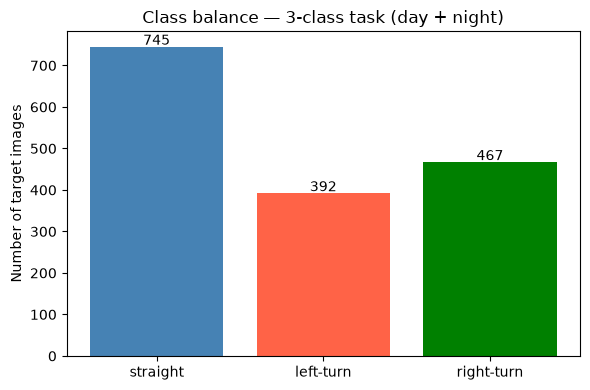

In [4]:
fig, ax = plt.subplots(figsize=(6, 4))
counts = pd.Series(labels_3c).value_counts().reindex(CLASSES)
ax.bar(CLASSES, counts.values, color=[COLORS[c] for c in CLASSES])
ax.set_title('Class balance — 3-class task (day + night)')
ax.set_ylabel('Number of target images')
for i, v in enumerate(counts.values):
    ax.text(i, v + 5, str(v), ha='center', fontsize=10)
plt.tight_layout()
plt.savefig('outputs/class_balance_3class.png', dpi=150)
plt.show()


## 3. Canonical v1 feature functions

Exact copies from `waymo_feature_extraction.ipynb` (the base notebook) — this is the
**single source of truth** used everywhere below, including inside `road_v2` and
`vehicle_occupancy`, to avoid the copy-drift found between the two existing "exact
copies" of `segment_road` (see the note in cell 1).

In [5]:
from skimage.feature import hog as _skimage_hog
from ultralytics import YOLO

HOG_PARAMS = {'orientations': 9, 'pixels_per_cell': (16, 16), 'cells_per_block': (2, 2), 'channel_axis': -1}

def extract_hog(img):
    features, hog_img = _skimage_hog(img, visualize=True, **HOG_PARAMS)
    return features, hog_img


HSV_BINS = (18, 8, 8)  # hue, saturation, value bins

def extract_hsv_histogram(img):
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    hist_h = np.histogram(hsv[:, :, 0], bins=HSV_BINS[0], range=(0, 180), density=True)[0]
    hist_s = np.histogram(hsv[:, :, 1], bins=HSV_BINS[1], range=(0, 256), density=True)[0]
    hist_v = np.histogram(hsv[:, :, 2], bins=HSV_BINS[2], range=(0, 256), density=True)[0]
    return np.concatenate([hist_h, hist_s, hist_v])


DRIVING_CLASSES = {
    0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle',
    5: 'bus', 7: 'truck', 9: 'traffic light', 11: 'stop sign',
}

def extract_yolo_features(img, model, driving_classes=DRIVING_CLASSES):
    '''[count, mean_x, mean_y, mean_size] per class, sorted by class id.'''
    H, W = img.shape[:2]
    results = model(img, verbose=False)
    class_detections = defaultdict(list)
    for box in results[0].boxes:
        cls_id = int(box.cls)
        if cls_id in driving_classes:
            x1, y1, x2, y2 = box.xyxy[0].tolist()
            cx = ((x1 + x2) / 2) / W
            cy = ((y1 + y2) / 2) / H
            size = ((x2 - x1) * (y2 - y1)) / (W * H)
            class_detections[cls_id].append((cx, cy, size))
    features = []
    for cls_id in sorted(driving_classes.keys()):
        dets = class_detections[cls_id]
        if len(dets) == 0:
            features.extend([0, 0, 0, 0])
        else:
            features.extend([
                len(dets),
                np.mean([d[0] for d in dets]),
                np.mean([d[1] for d in dets]),
                np.mean([d[2] for d in dets]),
            ])
    return np.array(features, dtype=np.float32)


def detect_edges_and_lines(img, canny_low=30, canny_high=100, hough_threshold=15,
                            min_line_length=20, max_line_gap=15, road_region_frac=0.55):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    H, W = gray.shape
    road_mask = np.zeros_like(gray); road_mask[int(H * road_region_frac):, :] = 1
    edges = cv2.Canny(gray, canny_low, canny_high)
    edges_masked = edges * road_mask
    lines_raw = cv2.HoughLinesP(edges_masked, rho=1, theta=np.pi / 180, threshold=hough_threshold,
                                 minLineLength=min_line_length, maxLineGap=max_line_gap)
    lines = []
    if lines_raw is not None:
        for line in lines_raw:
            x1, y1, x2, y2 = line[0]
            angle = abs(np.degrees(np.arctan2(y2 - y1, x2 - x1)))
            if 20 < angle < 75 or 105 < angle < 160:
                lines.append((x1, y1, x2, y2))
    return edges, np.array(lines), road_mask


def estimate_vanishing_point(lines, img_shape):
    H, W = img_shape[:2]
    def line_intersection(l1, l2):
        x1, y1, x2, y2 = l1; x3, y3, x4, y4 = l2
        denom = (x1 - x2) * (y3 - y4) - (y1 - y2) * (x3 - x4)
        if abs(denom) < 1e-6:
            return None
        t = ((x1 - x3) * (y3 - y4) - (y1 - y3) * (x3 - x4)) / denom
        return (x1 + t * (x2 - x1), y1 + t * (y2 - y1))
    if len(lines) < 2:
        return (0.5, 0.5), len(lines), []
    intersections = []
    for i in range(len(lines)):
        for j in range(i + 1, len(lines)):
            pt = line_intersection(lines[i], lines[j])
            if pt is not None:
                x, y = pt
                if -W < x < 2 * W and -H < y < 2 * H:
                    intersections.append((x, y))
    if not intersections:
        return (0.5, 0.5), len(lines), []
    xs = np.array([p[0] for p in intersections]); ys = np.array([p[1] for p in intersections])
    x_bins = np.linspace(-W, 2 * W, 30); y_bins = np.linspace(-H, 2 * H, 30)
    hist, xedges, yedges = np.histogram2d(xs, ys, bins=[x_bins, y_bins])
    peak_idx = np.unravel_index(hist.argmax(), hist.shape)
    vp_x = (xedges[peak_idx[0]] + xedges[peak_idx[0] + 1]) / 2
    vp_y = (yedges[peak_idx[1]] + yedges[peak_idx[1] + 1]) / 2
    return (vp_x / W, vp_y / H), len(lines), intersections


def get_robust_seed_color(hsv, H, W):
    seed_points = [
        (W // 2, int(H * 0.95)), (W // 2, int(H * 0.85)),
        (int(W * 0.35), int(H * 0.92)), (int(W * 0.65), int(H * 0.92)),
        (int(W * 0.35), int(H * 0.82)), (int(W * 0.65), int(H * 0.82)),
    ]
    seed_colors, valid_points = [], []
    for sx, sy in seed_points:
        patch = hsv[max(0, sy - 5):sy + 5, max(0, sx - 10):sx + 10]
        if patch.size > 0:
            seed_colors.append(np.mean(patch, axis=(0, 1))); valid_points.append((sx, sy))
    seed_colors = np.array(seed_colors)
    median_color = np.median(seed_colors, axis=0)
    best_idx = np.argmin(np.linalg.norm(seed_colors - median_color, axis=1))
    return seed_colors[best_idx].astype(np.uint8), valid_points[best_idx]


def segment_road(img, road_region_frac=0.55):
    '''Canonical version, returns all 5 keys. Used everywhere in this notebook,
    including inside road_v2, so no downstream function has to recompute
    road_width_bottom / road_width_mid from scratch.'''
    H, W = img.shape[:2]
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    seed_color, (seed_x, seed_y) = get_robust_seed_color(hsv, H, W)
    tolerance = np.array([20, 60, 60])
    lower = np.clip(seed_color.astype(int) - tolerance, 0, 255).astype(np.uint8)
    upper = np.clip(seed_color.astype(int) + tolerance, 0, 255).astype(np.uint8)
    color_mask = cv2.inRange(hsv, lower, upper)
    road_y_start = int(H * road_region_frac)
    color_mask[:road_y_start, :] = 0
    flood_mask = np.zeros((H + 2, W + 2), dtype=np.uint8)
    cv2.floodFill(color_mask.copy(), flood_mask, (seed_x, seed_y), 255,
                  loDiff=(10, 10, 10), upDiff=(10, 10, 10))
    road_mask = (flood_mask[1:-1, 1:-1] * 255).astype(np.uint8)
    road_pixels = np.where(road_mask > 0)
    if len(road_pixels[0]) < 10:
        return road_mask, {
            'road_area_frac': 0.0, 'road_centroid_x': 0.5,
            'road_width_bottom': 0.0, 'road_width_mid': 0.0, 'road_taper': 0.0,
        }
    total_pixels = H * W
    road_area_frac = len(road_pixels[0]) / total_pixels
    road_centroid_x = np.mean(road_pixels[1]) / W
    bottom_row = road_mask[int(H * 0.9), :]; mid_row = road_mask[int(H * 0.7), :]
    road_width_bottom = np.sum(bottom_row > 0) / W
    road_width_mid = np.sum(mid_row > 0) / W
    road_taper = road_width_bottom - road_width_mid
    features = {
        'road_area_frac': road_area_frac, 'road_centroid_x': road_centroid_x,
        'road_width_bottom': road_width_bottom, 'road_width_mid': road_width_mid,
        'road_taper': road_taper,
    }
    return road_mask, features


yolo_model = YOLO('yolov8s.pt')
print('Canonical v1 feature functions loaded (from waymo_feature_extraction.ipynb).')


Canonical v1 feature functions loaded (from waymo_feature_extraction.ipynb).


## 4. `road_v2` and `vehicle_occupancy` — v2 feature definitions (ported)

Ported from `feature_exploration_update.ipynb`, with one fix: `build_road_v2_features`
now reuses `road_width_bottom` / `road_width_mid` from the canonical `segment_road`
above instead of recomputing them inline (see the drift note in cell 1).

**QA — camera-segment assumption:** both features restrict analysis to
`CENTER_SEG = (128, 256)`, described in the source notebook as "confirmed via seam
detection." That confirmation isn't visible in what was ported here, so re-verify it
visually below before trusting either feature.

In [6]:
CENTER_SEG = (128, 256)  # front-center camera segment

def _line_intersection(l1, l2):
    x1, y1, x2, y2 = l1; x3, y3, x4, y4 = l2
    denom = (x1 - x2) * (y3 - y4) - (y1 - y2) * (x3 - x4)
    if abs(denom) < 1e-6:
        return None
    t = ((x1 - x3) * (y3 - y4) - (y1 - y3) * (x3 - x4)) / denom
    return (x1 + t * (x2 - x1), y1 + t * (y2 - y1))

def _detect_lines_in_roi(gray_center, roi_top_row, canny_low=30, canny_high=100,
                          hough_threshold=12, min_line_length=15, max_line_gap=15):
    H, W = gray_center.shape
    mask = np.zeros_like(gray_center); mask[roi_top_row:, :] = 1
    edges = cv2.Canny(gray_center, canny_low, canny_high)
    edges_masked = edges * mask
    lines_raw = cv2.HoughLinesP(edges_masked, rho=1, theta=np.pi / 180, threshold=hough_threshold,
                                 minLineLength=min_line_length, maxLineGap=max_line_gap)
    lines = []
    if lines_raw is not None:
        for line in lines_raw:
            x1, y1, x2, y2 = line[0]
            angle = abs(np.degrees(np.arctan2(y2 - y1, x2 - x1)))
            if 20 < angle < 75 or 105 < angle < 160:
                lines.append((x1, y1, x2, y2))
    return np.array(lines)

def _estimate_vp(lines, W, H):
    fallback = (W / 2, H / 2)
    if len(lines) < 2:
        return fallback, []
    intersections, pair_idx = [], []
    for i in range(len(lines)):
        for j in range(i + 1, len(lines)):
            pt = _line_intersection(lines[i], lines[j])
            if pt is not None:
                x, y = pt
                if -W < x < 2 * W and -H < y < 2 * H:
                    intersections.append((x, y)); pair_idx.append((i, j))
    if not intersections:
        return fallback, []
    xs = np.array([p[0] for p in intersections]); ys = np.array([p[1] for p in intersections])
    hist, xe, ye = np.histogram2d(xs, ys, bins=[np.linspace(-W, 2*W, 30), np.linspace(-H, 2*H, 30)])
    pi = np.unravel_index(hist.argmax(), hist.shape)
    vp_x = (xe[pi[0]] + xe[pi[0]+1]) / 2; vp_y = (ye[pi[1]] + ye[pi[1]+1]) / 2
    return (vp_x, vp_y), list(zip(intersections, pair_idx))

def extract_road_v2(img, inlier_tol_frac=0.15):
    x0, x1 = CENTER_SEG
    center_img = img[:, x0:x1]
    gray = cv2.cvtColor(center_img, cv2.COLOR_RGB2GRAY)
    H, W = gray.shape

    lines_1 = _detect_lines_in_roi(gray, roi_top_row=int(H * 0.55))
    (vp1_x, vp1_y), _ = _estimate_vp(lines_1, W, H)

    margin = int(0.15 * H)
    fixed_top_row = int(H * 0.55)
    vp_informed_top_row = int(np.clip(vp1_y - margin, 0, H - 5))
    roi_top_row_2 = min(fixed_top_row, vp_informed_top_row)
    lines_2 = _detect_lines_in_roi(gray, roi_top_row=roi_top_row_2)
    (vp2_x, vp2_y), intersections_with_idx = _estimate_vp(lines_2, W, H)

    tol = inlier_tol_frac * np.hypot(W, H)
    inlier_line_idx = set()
    for (ix, iy), (i, j) in intersections_with_idx:
        if np.hypot(ix - vp2_x, iy - vp2_y) < tol:
            inlier_line_idx.add(i); inlier_line_idx.add(j)
    n_lines = len(lines_2); n_inliers = len(inlier_line_idx)
    inlier_ratio = n_inliers / n_lines if n_lines > 0 else 0.0

    vp_norm = (vp2_x / W, vp2_y / H)
    return vp_norm, n_lines, n_inliers, inlier_ratio, lines_2, inlier_line_idx, roi_top_row_2

def build_road_v2_features(img):
    '''FIX applied: reuses road_width_bottom/road_width_mid from the canonical
    segment_road() instead of recomputing them (see cell 1 drift note).'''
    vp, n_lines, n_inliers, inlier_ratio, *_ = extract_road_v2(img)
    _, road_feats = segment_road(img)
    return np.array([
        vp[0], vp[1], n_lines, n_inliers, inlier_ratio,
        road_feats['road_area_frac'], road_feats['road_centroid_x'],
        road_feats['road_width_bottom'], road_feats['road_width_mid'],
        road_feats['road_taper'],
    ], dtype=np.float32)

ROAD_V2_DIMS = ['vp_x', 'vp_y', 'n_lines', 'n_inliers', 'inlier_ratio',
                'road_area_frac', 'road_centroid_x', 'road_width_bottom', 'road_width_mid', 'road_taper']


VEHICLE_CLASSES = {2: 'car', 5: 'bus', 7: 'truck'}
OCC_CENTER_SEG = (128, 256)

def extract_vehicle_occupancy(img, yolo_results=None):
    H, W = img.shape[:2]
    x0, x1 = OCC_CENTER_SEG
    seg_w = x1 - x0
    results = yolo_results if yolo_results is not None else yolo_model(img, verbose=False)
    left, right = [], []
    for box in results[0].boxes:
        cls_id = int(box.cls)
        if cls_id not in VEHICLE_CLASSES:
            continue
        bx1, by1, bx2, by2 = box.xyxy[0].tolist()
        cx = (bx1 + bx2) / 2
        if not (x0 <= cx < x1):
            continue
        rel_x = (cx - x0) / seg_w
        dx = rel_x - 0.5
        bottom_y = by2 / H
        if dx < -1/6:
            left.append(bottom_y)
        elif dx > 1/6:
            right.append(bottom_y)
    left_count, right_count = len(left), len(right)
    left_crowding = sum(left) if left else 0.0
    right_crowding = sum(right) if right else 0.0
    left_nearest = max(left) if left else 0.0
    right_nearest = max(right) if right else 0.0
    asymmetry = left_crowding - right_crowding
    return np.array([left_count, left_crowding, left_nearest,
                      right_count, right_crowding, right_nearest, asymmetry], dtype=np.float32)

VEHICLE_OCC_DIMS = ['left_count', 'left_crowding', 'left_nearest',
                     'right_count', 'right_crowding', 'right_nearest', 'asymmetry']
print('road_v2 and vehicle_occupancy functions loaded.')


road_v2 and vehicle_occupancy functions loaded.


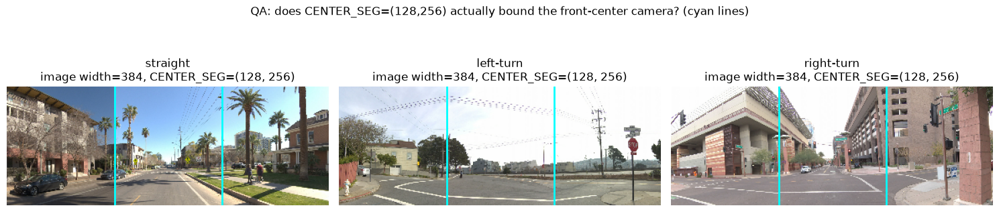

Inspect the panel above: the region between the cyan lines should contain exactly one
forward-facing camera view with no visible seam. If it clips a seam or spans two cameras,
CENTER_SEG needs to be re-derived for this image width before road_v2/vehicle_occupancy are trustworthy.


In [7]:
# --- QA: re-verify the CENTER_SEG=(128,256) camera-segment assumption visually ---
qa_examples = {}
for sid, entry in manifest.items():
    label = entry['label']
    if label in CLASSES and label not in qa_examples:
        data = np.load(os.path.join(TRAIN_DIR, entry['target_fname']), allow_pickle=True)
        qa_examples[label] = np.array(data['_modality_data'].item()[Modality.CAMERAS])
    if len(qa_examples) == len(CLASSES):
        break

fig, axes = plt.subplots(1, len(CLASSES), figsize=(5 * len(CLASSES), 4))
for ax, cls in zip(axes, CLASSES):
    img = qa_examples[cls]
    H, W = img.shape[:2]
    ax.imshow(img)
    ax.axvline(CENTER_SEG[0], color='cyan', lw=2)
    ax.axvline(CENTER_SEG[1], color='cyan', lw=2)
    ax.set_title(f'{cls}\nimage width={W}, CENTER_SEG={CENTER_SEG}')
    ax.axis('off')
plt.suptitle('QA: does CENTER_SEG=(128,256) actually bound the front-center camera? (cyan lines)')
plt.tight_layout()
plt.savefig('outputs/qa_center_seg_check.png', dpi=130)
plt.show()
print('Inspect the panel above: the region between the cyan lines should contain exactly one')
print('forward-facing camera view with no visible seam. If it clips a seam or spans two cameras,')
print('CENTER_SEG needs to be re-derived for this image width before road_v2/vehicle_occupancy are trustworthy.')


## 5. Compute `road_v2` and `vehicle_occupancy` for the 3-class subset

Looped once per frame (both features share the same loaded image and, where relevant,
the same YOLO call) over only the 2,024-ish rows that survived the 3-class filter —
no need to spend compute on sequences that were filtered out in Section 2.

Unlike the original `feature_exploration_update.ipynb`, this saves an explicit
`seq_ids` companion array alongside each new feature array (the missing-companion issue
flagged in cell 1).

In [8]:
t0 = time.time()
road_v2_list, vehicle_occ_list = [], []

for i, sid in enumerate(seq_ids_3c):
    if (i + 1) % 200 == 0:
        elapsed = time.time() - t0
        print(f'  {i+1}/{len(seq_ids_3c)} ({elapsed:.0f}s, {elapsed/(i+1)*(len(seq_ids_3c)-(i+1)):.0f}s remaining)')
    entry = manifest[sid]
    data = np.load(os.path.join(TRAIN_DIR, entry['target_fname']), allow_pickle=True)
    img = np.array(data['_modality_data'].item()[Modality.CAMERAS])

    road_v2_list.append(build_road_v2_features(img))

    yolo_results = yolo_model(img, verbose=False)
    vehicle_occ_list.append(extract_vehicle_occupancy(img, yolo_results=yolo_results))

road_v2_3c = np.array(road_v2_list, dtype=np.float32)
vehicle_occ_3c = np.array(vehicle_occ_list, dtype=np.float32)

print(f'\nDone in {time.time()-t0:.0f}s')
print(f'road_v2_3c shape: {road_v2_3c.shape}')
print(f'vehicle_occ_3c shape: {vehicle_occ_3c.shape}')

np.save(os.path.join(FEATURES_DIR, 'road_v2_3class.npy'), road_v2_3c)
np.save(os.path.join(FEATURES_DIR, 'vehicle_occupancy_3class.npy'), vehicle_occ_3c)
np.save(os.path.join(FEATURES_DIR, 'seq_ids_3class.npy'), seq_ids_3c)
np.save(os.path.join(FEATURES_DIR, 'labels_3class.npy'), labels_3c)
print('Saved road_v2_3class.npy, vehicle_occupancy_3class.npy, seq_ids_3class.npy, labels_3class.npy')


  200/1604 (15s, 107s remaining)
  400/1604 (29s, 88s remaining)
  600/1604 (43s, 72s remaining)
  800/1604 (57s, 57s remaining)
  1000/1604 (71s, 43s remaining)
  1200/1604 (85s, 28s remaining)
  1400/1604 (98s, 14s remaining)
  1600/1604 (112s, 0s remaining)

Done in 112s
road_v2_3c shape: (1604, 10)
vehicle_occ_3c shape: (1604, 7)
Saved road_v2_3class.npy, vehicle_occupancy_3class.npy, seq_ids_3class.npy, labels_3class.npy


## 6. QA Block 1 — Do the engineered features behave as intended?

Structural checks (ranges, NaN/Inf) plus the semantic checks that actually matter for
this task: does `vp_x` / `road_centroid_x` move in the expected direction for
`left-turn` vs `right-turn` vs `straight`? Does `road_v2` agree with `road` v1 on the
dimensions they share? How often does each feature fall back to its degenerate default
(and does that rate differ by class, which would bias the classifier)?

In [9]:
qa2_rows = []

def check_range(name, arr, lo, hi):
    bad = int(np.sum((arr < lo - 1e-6) | (arr > hi + 1e-6)))
    qa2_rows.append((f'{name} within [{lo}, {hi}]', bad == 0, f'{bad}/{arr.size} out of range'))

def check_finite(name, arr):
    bad = int(np.sum(~np.isfinite(arr)))
    qa2_rows.append((f'{name} finite', bad == 0, f'{bad}/{arr.size} NaN/Inf'))

# NOTE on vp_x / vp_y bounds: estimate_vanishing_point() (v1) and _estimate_vp() (v2) both
# accept line intersections in the window (-W, 2W) x (-H, 2H) before normalizing by W/H --
# see waymo_feature_extraction.ipynb cell 12 and feature_exploration_update.ipynb cell 5.
# So vp_x/vp_y is allowed BY DESIGN to land outside [0, 1] (roughly (-1, 2)): a real turn can
# push the vanishing point off-frame, and that's meant to be signal, not an error. Checking
# against [0, 1] here was too strict -- fixed to check against the actual search bound instead,
# with a separate informational breakdown (next cell) of how often that happens and whether it
# lines up with turn classes.
VP_SEARCH_BOUND = (-1.0, 2.0)

# road v1 (indices: vp_x, vp_y, n_lines, road_area_frac, road_centroid_x, width_bottom, width_mid, taper)
check_finite('road v1', road_3c)
check_range('road v1 vp_x', road_3c[:, 0], *VP_SEARCH_BOUND)
check_range('road v1 vp_y', road_3c[:, 1], *VP_SEARCH_BOUND)
check_range('road v1 road_area_frac', road_3c[:, 3], 0, 1)
check_range('road v1 road_centroid_x', road_3c[:, 4], 0, 1)

# road v2
check_finite('road v2', road_v2_3c)
check_range('road v2 vp_x', road_v2_3c[:, 0], *VP_SEARCH_BOUND)
check_range('road v2 vp_y', road_v2_3c[:, 1], *VP_SEARCH_BOUND)
check_range('road v2 inlier_ratio', road_v2_3c[:, 4], 0, 1)
check_range('road v2 road_area_frac', road_v2_3c[:, 5], 0, 1)
check_range('road v2 road_centroid_x', road_v2_3c[:, 6], 0, 1)

# vehicle occupancy
check_finite('vehicle_occupancy', vehicle_occ_3c)
check_range('vehicle_occupancy counts', vehicle_occ_3c[:, [0, 3]], 0, np.inf)

qa2_df = pd.DataFrame(qa2_rows, columns=['check', 'pass', 'detail'])
print(qa2_df.to_string(index=False))
if not qa2_df['pass'].all():
    warnings.warn('One or more structural feature-QA checks FAILED -- see qa2_df.')


                                   check  pass              detail
                          road v1 finite  True     0/12832 NaN/Inf
         road v1 vp_x within [-1.0, 2.0]  True 0/1604 out of range
         road v1 vp_y within [-1.0, 2.0]  True 0/1604 out of range
    road v1 road_area_frac within [0, 1]  True 0/1604 out of range
   road v1 road_centroid_x within [0, 1]  True 0/1604 out of range
                          road v2 finite  True     0/16040 NaN/Inf
         road v2 vp_x within [-1.0, 2.0]  True 0/1604 out of range
         road v2 vp_y within [-1.0, 2.0]  True 0/1604 out of range
      road v2 inlier_ratio within [0, 1]  True 0/1604 out of range
    road v2 road_area_frac within [0, 1]  True 0/1604 out of range
   road v2 road_centroid_x within [0, 1]  True 0/1604 out of range
                vehicle_occupancy finite  True     0/11228 NaN/Inf
vehicle_occupancy counts within [0, inf]  True 0/3208 out of range


In [10]:
# --- Diagnostic: is an off-frame vanishing point (vp_x outside [0,1]) real turn signal,
# or just noisy Hough-line estimation?
#
# FIX vs. the first version of this cell: lumping "VP off to the left" (vp_x < 0) and
# "VP off to the right" (vp_x > 1) into a single "off_frame" bucket washes out the exact
# directional signal we're testing for -- a class where the VP swings hard in BOTH
# directions in roughly equal measure would look identical, in that single bucket, to a
# class where the VP never goes off-frame at all. Split by direction instead: for a real
# turn signal, left-turn should show an elevated *left*-off-frame rate specifically, and
# right-turn an elevated *right*-off-frame rate specifically, relative to straight.

def off_frame_breakdown(name, vp_x, vp_y, labels):
    at_fallback = (vp_x == 0.5) & (vp_y == 0.5)
    real = ~at_fallback  # exclude the (0.5, 0.5) "couldn't estimate" fallback entirely
    left_off = real & (vp_x < 0)
    right_off = real & (vp_x > 1)
    in_frame = real & (vp_x >= 0) & (vp_x <= 1)

    rows = []
    for c in CLASSES:
        m = labels == c
        rows.append({
            'class': c,
            'n': int(m.sum()),
            'in_frame_rate': float(in_frame[m].mean()),
            'left_off_rate': float(left_off[m].mean()),
            'right_off_rate': float(right_off[m].mean()),
            'fallback_rate': float(at_fallback[m].mean()),
            'left_off_median_vpx': float(np.median(vp_x[m & left_off])) if left_off[m].any() else float('nan'),
            'right_off_median_vpx': float(np.median(vp_x[m & right_off])) if right_off[m].any() else float('nan'),
        })
    df = pd.DataFrame(rows)
    print(f'{name}:')
    print(df.round(3).to_string(index=False))

    left_rates = dict(zip(df['class'], df['left_off_rate']))
    right_rates = dict(zip(df['class'], df['right_off_rate']))
    left_signal = left_rates['left-turn'] > max(left_rates['straight'], left_rates['right-turn'])
    right_signal = right_rates['right-turn'] > max(right_rates['straight'], right_rates['left-turn'])

    if left_signal and right_signal:
        verdict = 'directionally consistent: left-turn leads on left-off-frame rate AND right-turn leads on right-off-frame rate'
    elif left_signal or right_signal:
        verdict = 'partially consistent: only one direction shows the expected lead -- worth a closer look'
    else:
        verdict = 'NOT directionally consistent -- off-frame VP does not track turn direction the way intended here'
    print(f'  -> {verdict}\n')
    return df

vp_v1_breakdown = off_frame_breakdown('road v1 vp', road_3c[:, 0], road_3c[:, 1], labels_3c)
vp_v2_breakdown = off_frame_breakdown('road v2 vp', road_v2_3c[:, 0], road_v2_3c[:, 1], labels_3c)

vp_v1_breakdown.to_csv(os.path.join(FEATURES_DIR, 'qa_vp_offframe_v1_3class.csv'), index=False)
vp_v2_breakdown.to_csv(os.path.join(FEATURES_DIR, 'qa_vp_offframe_v2_3class.csv'), index=False)
print('Saved qa_vp_offframe_v1_3class.csv, qa_vp_offframe_v2_3class.csv')
print()
print('Cross-check this against the Section 6 directional_check() output for \'road v1 vp_x\' /')
print('\'road v2 vp_x\' further down -- that one runs a one-way ANOVA over the FULL vp_x')
print('distribution (not just the off-frame subset) and is the more statistically powerful test.')
print('If the two disagree, trust the full-distribution ANOVA over this off-frame-only diagnostic.')


road v1 vp:
     class   n  in_frame_rate  left_off_rate  right_off_rate  fallback_rate  left_off_median_vpx  right_off_median_vpx
  straight 745          0.659          0.082           0.017          0.242               -0.224                 1.017
 left-turn 392          0.587          0.094           0.015          0.304               -0.121                 1.069
right-turn 467          0.627          0.071           0.028          0.274               -0.121                 1.017
  -> directionally consistent: left-turn leads on left-off-frame rate AND right-turn leads on right-off-frame rate

road v2 vp:
     class   n  in_frame_rate  left_off_rate  right_off_rate  fallback_rate  left_off_median_vpx  right_off_median_vpx
  straight 745          0.929          0.035           0.026          0.011               -0.069                 1.121
 left-turn 392          0.895          0.043           0.023          0.038               -0.121                 1.017
right-turn 467          0.8

In [11]:
# --- Semantic check: v1 vs v2 agreement on shared road-geometry dimensions ---
# road_v2 is a refinement of road v1's Hough/VP pipeline restricted to the center camera
# segment; if it measures "the same thing", the shared dims should correlate strongly.
# v1 index -> v2 index for the dims both compute:
shared_dims = {
    'vp_x':            (0, 0),
    'vp_y':             (1, 1),
    'n_lines':          (2, 2),
    'road_area_frac':   (3, 5),
    'road_centroid_x':  (4, 6),
    'road_width_bottom':(5, 7),
    'road_width_mid':   (6, 8),
    'road_taper':       (7, 9),
}

corr_rows = []
for dim, (i1, i2) in shared_dims.items():
    r = np.corrcoef(road_3c[:, i1], road_v2_3c[:, i2])[0, 1]
    corr_rows.append((dim, r, 'OK' if abs(r) >= 0.5 else 'CHECK — weak agreement with v1'))
corr_df = pd.DataFrame(corr_rows, columns=['dimension', 'pearson_r (v1 vs v2)', 'flag'])
print(corr_df.to_string(index=False))
print('\nA low |r| here does not automatically mean v2 is wrong (it uses a tighter camera')
print('crop and adaptive ROI, so some divergence from v1 is expected) — but it should be')
print('reviewed before assuming v2 is simply "v1, but better."')


        dimension  pearson_r (v1 vs v2)                           flag
             vp_x             -0.000488 CHECK — weak agreement with v1
             vp_y              0.024589 CHECK — weak agreement with v1
          n_lines              0.134228 CHECK — weak agreement with v1
   road_area_frac              1.000000                             OK
  road_centroid_x              1.000000                             OK
road_width_bottom              1.000000                             OK
   road_width_mid              1.000000                             OK
       road_taper              1.000000                             OK

A low |r| here does not automatically mean v2 is wrong (it uses a tighter camera
crop and adaptive ROI, so some divergence from v1 is expected) — but it should be
reviewed before assuming v2 is simply "v1, but better."


In [13]:
# --- Semantic check: does vp_x / road_centroid_x actually separate the 3 classes? ---
# This is the single most important check for THIS task: a vanishing-point / road-centroid
# feature is only useful for turn classification if it reliably shifts left for left-turn
# and right for right-turn relative to straight.
from scipy import stats as _stats

def directional_check(name, values, labels):
    means = {c: values[labels == c].mean() for c in CLASSES}
    sems = {c: values[labels == c].std(ddof=1) / np.sqrt((labels == c).sum()) for c in CLASSES}
    groups = [values[labels == c] for c in CLASSES]
    f_stat, p_val = _stats.f_oneway(*groups)
    expected_order = means['left-turn'] < means['straight'] < means['right-turn']
    reversed_order = means['left-turn'] > means['straight'] > means['right-turn']
    verdict = 'expected order (left < straight < right)' if expected_order else (
        'REVERSED order (left > straight > right)' if reversed_order else 'no clean monotonic order')
    print(f'{name}:')
    for c in CLASSES:
        print(f'    {c:<12} mean={means[c]:+.4f}  sem={sems[c]:.4f}')
    print(f'    one-way ANOVA: F={f_stat:.2f}, p={p_val:.2e}  ({"significant" if p_val < 0.05 else "NOT significant"} at alpha=0.05)')
    print(f'    direction check: {verdict}\n')
    return {'feature': name, 'F': f_stat, 'p': p_val, 'significant': p_val < 0.05,
            'direction': verdict, **{f'mean_{c}': means[c] for c in CLASSES}}

directional_rows = []
directional_rows.append(directional_check('road v1 vp_x',        road_3c[:, 0],    labels_3c))
directional_rows.append(directional_check('road v1 road_centroid_x', road_3c[:, 4], labels_3c))
directional_rows.append(directional_check('road v2 vp_x',        road_v2_3c[:, 0], labels_3c))
directional_rows.append(directional_check('road v2 road_centroid_x', road_v2_3c[:, 6], labels_3c))
directional_rows.append(directional_check('vehicle_occ asymmetry', vehicle_occ_3c[:, 6], labels_3c))

directional_df = pd.DataFrame(directional_rows)
directional_df.to_csv(os.path.join(FEATURES_DIR, 'qa_directional_checks_3class.csv'), index=False)
print('Saved qa_directional_checks_3class.csv')


road v1 vp_x:
    straight     mean=+0.4277  sem=0.0112
    left-turn    mean=+0.4206  sem=0.0144
    right-turn   mean=+0.4610  sem=0.0146
    one-way ANOVA: F=2.38, p=9.33e-02  (NOT significant at alpha=0.05)
    direction check: expected order (left < straight < right)

road v1 road_centroid_x:
    straight     mean=+0.4865  sem=0.0033
    left-turn    mean=+0.4855  sem=0.0040
    right-turn   mean=+0.4828  sem=0.0038
    one-way ANOVA: F=0.28, p=7.54e-01  (NOT significant at alpha=0.05)
    direction check: no clean monotonic order

road v2 vp_x:
    straight     mean=+0.4882  sem=0.0097
    left-turn    mean=+0.4536  sem=0.0147
    right-turn   mean=+0.4759  sem=0.0137
    one-way ANOVA: F=1.97, p=1.40e-01  (NOT significant at alpha=0.05)
    direction check: no clean monotonic order

road v2 road_centroid_x:
    straight     mean=+0.4865  sem=0.0033
    left-turn    mean=+0.4855  sem=0.0040
    right-turn   mean=+0.4828  sem=0.0038
    one-way ANOVA: F=0.28, p=7.54e-01  (NOT sign

In [14]:
# --- Degenerate-fallback rate audit, by class ---
# road v1/v2 fall back to vp=(0.5,0.5) when <2 Hough lines are found, and segment_road
# falls back to road_area_frac=0 when the flood fill finds <10 pixels. If these fallback
# rates differ a lot by class, the "feature" may partly be encoding which classes have
# messier imagery rather than actual road geometry.
vp_fallback_v1 = (road_3c[:, 0] == 0.5) & (road_3c[:, 1] == 0.5)
vp_fallback_v2 = (road_v2_3c[:, 0] == 0.5) & (road_v2_3c[:, 1] == 0.5)
road_seg_fallback = road_3c[:, 3] == 0.0  # road_area_frac == 0 -> degenerate mask

fallback_table = pd.DataFrame({
    'class': CLASSES,
    'n': [int((labels_3c == c).sum()) for c in CLASSES],
    'vp_fallback_rate_v1': [vp_fallback_v1[labels_3c == c].mean() for c in CLASSES],
    'vp_fallback_rate_v2': [vp_fallback_v2[labels_3c == c].mean() for c in CLASSES],
    'road_seg_fallback_rate': [road_seg_fallback[labels_3c == c].mean() for c in CLASSES],
})
print(fallback_table.round(3).to_string(index=False))
fallback_table.to_csv(os.path.join(FEATURES_DIR, 'qa_fallback_rates_3class.csv'), index=False)
print('\nSaved qa_fallback_rates_3class.csv. Large spread across classes here means part of the')
print('"signal" the classifier picks up on could be image quality/degeneracy rather than geometry.')


     class   n  vp_fallback_rate_v1  vp_fallback_rate_v2  road_seg_fallback_rate
  straight 745                0.242                0.011                   0.024
 left-turn 392                0.304                0.038                   0.015
right-turn 467                0.274                0.030                   0.041

Saved qa_fallback_rates_3class.csv. Large spread across classes here means part of the
"signal" the classifier picks up on could be image quality/degeneracy rather than geometry.


## 7. Visual QA panel — one example per class

Human-inspectable sanity check: raw frame, HOG, YOLO detections, road v1 overlay, road v2
overlay (green = inlier line, orange = rejected, cyan = adaptive ROI boundary, red dot =
VP), for the 3 classes in this task.

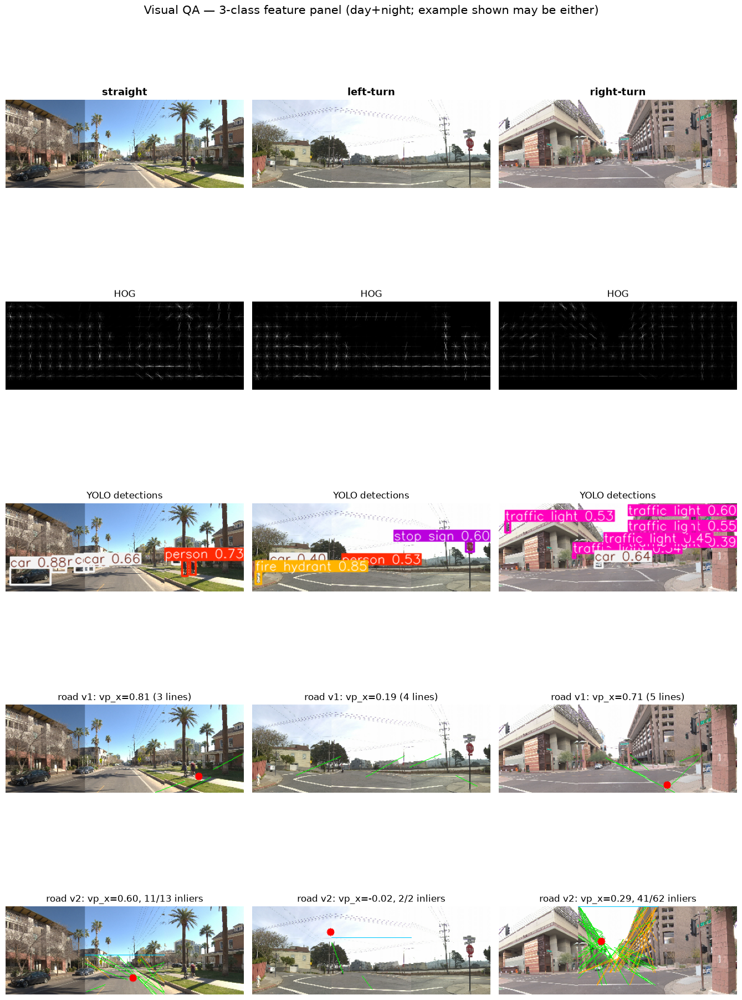

In [15]:
fig, axes = plt.subplots(5, len(CLASSES), figsize=(4.5 * len(CLASSES), 20))
for i, cls in enumerate(CLASSES):
    img = qa_examples[cls]
    H, W = img.shape[:2]

    axes[0, i].imshow(img); axes[0, i].set_title(cls, fontsize=13, fontweight='bold'); axes[0, i].axis('off')

    _, hog_img = extract_hog(img)
    axes[1, i].imshow(hog_img, cmap='gray'); axes[1, i].set_title('HOG'); axes[1, i].axis('off')

    yres = yolo_model(img, verbose=False)
    axes[2, i].imshow(yres[0].plot()); axes[2, i].set_title('YOLO detections'); axes[2, i].axis('off')

    _, lines_v1, _ = detect_edges_and_lines(img)
    vp1, n1, _ = estimate_vanishing_point(lines_v1, img.shape)
    img_v1 = img.copy()
    for x1, y1, x2, y2 in lines_v1:
        cv2.line(img_v1, (x1, y1), (x2, y2), (0, 255, 0), 1)
    vp1_px = (int(vp1[0] * W), int(vp1[1] * H))
    if 0 <= vp1_px[0] < W and 0 <= vp1_px[1] < H:
        cv2.circle(img_v1, vp1_px, 6, (255, 0, 0), -1)
    axes[3, i].imshow(img_v1); axes[3, i].set_title(f'road v1: vp_x={vp1[0]:.2f} ({n1} lines)'); axes[3, i].axis('off')

    x0, x1_seg = CENTER_SEG
    vp2, n2, n_inl, inl_ratio, lines2, inlier_idx, roi_row = extract_road_v2(img)
    img_v2 = img.copy()
    for k, (lx1, ly1, lx2, ly2) in enumerate(lines2):
        color = (0, 255, 0) if k in inlier_idx else (255, 165, 0)
        cv2.line(img_v2, (int(lx1) + x0, int(ly1)), (int(lx2) + x0, int(ly2)), color, 1)
    cv2.line(img_v2, (x0, roi_row), (x1_seg, roi_row), (0, 200, 255), 1)
    vp2_px = (int(vp2[0] * (x1_seg - x0)) + x0, int(vp2[1] * H))
    if 0 <= vp2_px[0] < W and 0 <= vp2_px[1] < H:
        cv2.circle(img_v2, vp2_px, 6, (255, 0, 0), -1)
    axes[4, i].imshow(img_v2)
    axes[4, i].set_title(f'road v2: vp_x={vp2[0]:.2f}, {n_inl}/{n2} inliers')
    axes[4, i].axis('off')

plt.suptitle('Visual QA — 3-class feature panel (day+night; example shown may be either)', fontsize=15)
plt.tight_layout()
plt.savefig('outputs/qa_visual_panel_3class.png', dpi=140)
plt.show()


## 8. Frame-difference / trend feature (ported from `framediff.ipynb`)

The original notebook built this specifically to chase `lane-change-*` separability —
which no longer exists as a class here. Re-testing it below on the 3-class problem is a
genuinely open question: `vp_x` drift and `road_centroid_x` drift across the context
window plausibly carries *more* signal for turn detection than for lane changes, since a
turn is a large, sustained heading change rather than a small lateral shift.

`n_context` frames are 250ms apart; the trend feature is `[slope per quantity] +
[value at the target frame per quantity]`, doubling the 5 base quantities to 10 dims.

In [16]:
QUANTITY_KEYS = ['road_centroid_x', 'road_area_frac', 'vp_x', 'det_mean_x', 'det_lr_balance']

def yolo_lateral_aggregates(img, model, driving_classes=DRIVING_CLASSES):
    H, W = img.shape[:2]
    results = model(img, verbose=False)
    xs = []
    for box in results[0].boxes:
        if int(box.cls) in driving_classes:
            x1, _, x2, _ = box.xyxy[0].tolist()
            xs.append(((x1 + x2) / 2) / W)
    if not xs:
        return {'det_mean_x': 0.5, 'det_lr_balance': 0.0}
    xs = np.array(xs)
    left = (xs < 0.5).sum(); right = (xs >= 0.5).sum()
    return {'det_mean_x': float(xs.mean()), 'det_lr_balance': float((left - right) / len(xs))}

def compute_frame_quantities(img, model):
    _, road = segment_road(img)
    _, lines, _ = detect_edges_and_lines(img)
    (vp_x, _vp_y), _n, _ = estimate_vanishing_point(lines, img.shape)
    det = yolo_lateral_aggregates(img, model)
    return {
        'road_centroid_x': road['road_centroid_x'], 'road_area_frac': road['road_area_frac'],
        'vp_x': vp_x, 'det_mean_x': det['det_mean_x'], 'det_lr_balance': det['det_lr_balance'],
    }

def load_frame(fname):
    data = np.load(os.path.join(TRAIN_DIR, fname), allow_pickle=True)
    return np.array(data['_modality_data'].item()[Modality.CAMERAS])

def fit_trend(frame_fnames, model):
    Qs = np.array([[compute_frame_quantities(load_frame(fn), model)[k] for k in QUANTITY_KEYS]
                   for fn in frame_fnames])
    n = len(Qs)
    if n < 2:
        return np.concatenate([np.zeros(len(QUANTITY_KEYS)), Qs[0]])
    t = np.arange(n); t_c = t - t.mean()
    slopes = (t_c[:, None] * (Qs - Qs.mean(0))).sum(0) / (t_c ** 2).sum()
    return np.concatenate([slopes, Qs[-1]])

TREND_KEYS = [f'slope_{k}' for k in QUANTITY_KEYS] + [f'last_{k}' for k in QUANTITY_KEYS]
print('framediff / trend functions loaded.')


framediff / trend functions loaded.


In [17]:
RECOMPUTE_FRAMEDIFF_TREND = True  # set False to skip this (slow: ~1 sequence/sec)

trend_path = os.path.join(FEATURES_DIR, 'framediff_trend_3class.npy')

if RECOMPUTE_FRAMEDIFF_TREND:
    t0 = time.time()
    trend_list = []
    for i, sid in enumerate(seq_ids_3c):
        if (i + 1) % 200 == 0:
            elapsed = time.time() - t0
            print(f'  {i+1}/{len(seq_ids_3c)} ({elapsed:.0f}s, '
                  f'{elapsed/(i+1)*(len(seq_ids_3c)-(i+1)):.0f}s remaining)')
        entry = manifest[sid]
        trend_list.append(fit_trend(entry['context_fnames'], yolo_model))
    trend_3c = np.array(trend_list, dtype=np.float32)
    np.save(trend_path, trend_3c)
    print(f'\nDone in {time.time()-t0:.0f}s. trend_3c shape: {trend_3c.shape}')
    print('Saved framediff_trend_3class.npy (row-aligned to seq_ids_3class.npy)')
elif os.path.exists(trend_path):
    trend_3c = np.load(trend_path)
    print(f'Loaded cached framediff_trend_3class.npy: {trend_3c.shape}')
else:
    trend_3c = None
    print('RECOMPUTE_FRAMEDIFF_TREND=False and no cached file found -- trend feature will be')
    print('skipped in the benchmark below.')


  200/1604 (750s, 5265s remaining)
  400/1604 (1369s, 4121s remaining)
  600/1604 (1961s, 3281s remaining)
  800/1604 (2547s, 2560s remaining)
  1000/1604 (3065s, 1851s remaining)
  1200/1604 (3633s, 1223s remaining)
  1400/1604 (4240s, 618s remaining)
  1600/1604 (4850s, 12s remaining)

Done in 4869s. trend_3c shape: (1604, 10)
Saved framediff_trend_3class.npy (row-aligned to seq_ids_3class.npy)


In [18]:
# --- Semantic check for the trend feature: does the vp_x slope actually distinguish turns? ---
if trend_3c is not None:
    slope_vp_x = trend_3c[:, TREND_KEYS.index('slope_vp_x')]
    _ = directional_check('framediff trend: slope_vp_x', slope_vp_x, labels_3c)
    print('A turning vehicle should show a sustained vp_x drift over the context window;')
    print('straight driving should hover near zero slope. Compare against the road v1/v2')
    print('vp_x checks above -- if this slope separates classes better than the single-frame')
    print('vp_x value, the trend feature earns a place in the benchmark below on its own merits.')


framediff trend: slope_vp_x:
    straight     mean=-0.0097  sem=0.0125
    left-turn    mean=+0.0104  sem=0.0084
    right-turn   mean=-0.0084  sem=0.0061
    one-way ANOVA: F=0.86, p=4.22e-01  (NOT significant at alpha=0.05)
    direction check: no clean monotonic order

A turning vehicle should show a sustained vp_x drift over the context window;
straight driving should hover near zero slope. Compare against the road v1/v2
vp_x checks above -- if this slope separates classes better than the single-frame
vp_x value, the trend feature earns a place in the benchmark below on its own merits.


## 9. Re-benchmark: which feature set actually wins on the 3-class problem?

Every candidate below is aligned to `seq_ids_3class.npy` before being included — no
array is concatenated on a positional assumption alone. Embeddings from
`feature_exploration_update.ipynb` (`cnn_embedding.npy`, `mobilenetv2_embedding.npy`,
`vit_embedding.npy`) are included only if already present on disk and only after being
re-aligned to the 3-class `seq_ids` (they were computed over the full 5-class set and
are not guaranteed to be positionally identical to `hog_3c`/etc. after filtering).

In [19]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix

def align_to_3class(array_path, seq_ids_path, target_seq_ids):
    '''Load a full-dataset array + its companion seq_ids, and re-index it to match
    target_seq_ids exactly (by seq_id, not by position). Returns None if either file
    is missing, or if any target seq_id isn't present in the source array (partial
    coverage -- e.g. an embedding step that failed on some frames).'''
    if not (os.path.exists(array_path) and os.path.exists(seq_ids_path)):
        return None
    arr = np.load(array_path)
    src_seq_ids = np.load(seq_ids_path, allow_pickle=True).astype(str)
    lookup = {sid: idx for idx, sid in enumerate(src_seq_ids)}
    if not all(sid in lookup for sid in target_seq_ids):
        missing = sum(sid not in lookup for sid in target_seq_ids)
        print(f'  skipping {os.path.basename(array_path)}: {missing}/{len(target_seq_ids)} '
              f'target rows not covered')
        return None
    return arr[[lookup[sid] for sid in target_seq_ids]]

feature_sets_clf = {
    'HOG': hog_3c,
    'HSV': hsv_3c,
    'YOLO': yolo_3c,
    'Road_v1': road_3c,
    'Road_v2': road_v2_3c,
    'VehicleOcc': vehicle_occ_3c,
}
if trend_3c is not None:
    feature_sets_clf['FrameDiffTrend'] = trend_3c

# Combined sets
feature_sets_clf['All_v1Road'] = np.concatenate([hog_3c, hsv_3c, yolo_3c, road_3c], axis=1)
feature_sets_clf['All_v2Road'] = np.concatenate([hog_3c, hsv_3c, yolo_3c, road_v2_3c], axis=1)
feature_sets_clf['All_v2Road_VehicleOcc'] = np.concatenate(
    [hog_3c, hsv_3c, yolo_3c, road_v2_3c, vehicle_occ_3c], axis=1)
if trend_3c is not None:
    feature_sets_clf['All_v2Road_VehicleOcc_Trend'] = np.concatenate(
        [hog_3c, hsv_3c, yolo_3c, road_v2_3c, vehicle_occ_3c, trend_3c], axis=1)

# Optional embeddings, only if present and fully covering the 3-class seq_ids
print('Checking for optional precomputed embeddings...')
for short, arr_name, seq_name in [
    ('CNN', 'cnn_embedding.npy', 'seq_ids.npy'),
    ('MNv2', 'mobilenetv2_embedding.npy', 'seq_ids.npy'),
    ('ViT', 'vit_embedding.npy', 'seq_ids.npy'),
]:
    aligned = align_to_3class(
        os.path.join(FEATURES_DIR, arr_name),
        os.path.join(FEATURES_DIR, seq_name),
        seq_ids_3c,
    )
    if aligned is not None:
        feature_sets_clf[short] = aligned
        print(f'  included {short}: {aligned.shape}')

print(f'\nCandidate feature sets for the 3-class benchmark: {list(feature_sets_clf.keys())}')


Checking for optional precomputed embeddings...
  included CNN: (1604, 512)
  included MNv2: (1604, 1280)
  included ViT: (1604, 768)

Candidate feature sets for the 3-class benchmark: ['HOG', 'HSV', 'YOLO', 'Road_v1', 'Road_v2', 'VehicleOcc', 'FrameDiffTrend', 'All_v1Road', 'All_v2Road', 'All_v2Road_VehicleOcc', 'All_v2Road_VehicleOcc_Trend', 'CNN', 'MNv2', 'ViT']


In [20]:
majority_baseline_3c = pd.Series(labels_3c).value_counts(normalize=True).max()
print(f'Majority-class baseline: {majority_baseline_3c:.3f}\n')

bench_rows = []
per_class_rows = []
predictions_store = {}

for name, feats in feature_sets_clf.items():
    X_train, X_test, y_train, y_test = train_test_split(
        feats, labels_3c, test_size=0.25, random_state=RANDOM_STATE, stratify=labels_3c)
    scaler = StandardScaler()
    X_train_s, X_test_s = scaler.fit_transform(X_train), scaler.transform(X_test)

    svm = SVC(kernel='rbf', class_weight='balanced', random_state=RANDOM_STATE)
    svm.fit(X_train_s, y_train)
    svm_pred = svm.predict(X_test_s)

    rf = RandomForestClassifier(n_estimators=300, class_weight='balanced',
                                 random_state=RANDOM_STATE, n_jobs=-1)
    rf.fit(X_train, y_train)
    rf_pred = rf.predict(X_test)

    for model_name, pred in [('SVM', svm_pred), ('RF', rf_pred)]:
        acc = accuracy_score(y_test, pred)
        macro_f1 = f1_score(y_test, pred, labels=CLASSES, average='macro', zero_division=0)
        bench_rows.append({'feature_set': name, 'model': model_name, 'accuracy': acc, 'macro_f1': macro_f1})
        predictions_store[(name, model_name)] = (y_test, pred)

    print(f'{name:28s}  SVM acc={accuracy_score(y_test, svm_pred):.3f}  '
          f'RF acc={accuracy_score(y_test, rf_pred):.3f}')

bench_df = pd.DataFrame(bench_rows)
bench_df.to_csv(os.path.join(FEATURES_DIR, 'benchmark_3class.csv'), index=False)

best_row = bench_df.loc[bench_df['accuracy'].idxmax()]
print(f'\nBest: {best_row["feature_set"]} / {best_row["model"]}  '
      f'acc={best_row["accuracy"]:.3f}  macro_f1={best_row["macro_f1"]:.3f}  '
      f'(majority baseline={majority_baseline_3c:.3f})')
print('Saved benchmark_3class.csv')


Majority-class baseline: 0.464

HOG                           SVM acc=0.601  RF acc=0.589
HSV                           SVM acc=0.411  RF acc=0.454
YOLO                          SVM acc=0.431  RF acc=0.476
Road_v1                       SVM acc=0.359  RF acc=0.392
Road_v2                       SVM acc=0.406  RF acc=0.449
VehicleOcc                    SVM acc=0.426  RF acc=0.409
FrameDiffTrend                SVM acc=0.469  RF acc=0.591
All_v1Road                    SVM acc=0.599  RF acc=0.596
All_v2Road                    SVM acc=0.601  RF acc=0.561
All_v2Road_VehicleOcc         SVM acc=0.599  RF acc=0.599
All_v2Road_VehicleOcc_Trend   SVM acc=0.599  RF acc=0.601
CNN                           SVM acc=0.521  RF acc=0.519
MNv2                          SVM acc=0.539  RF acc=0.529
ViT                           SVM acc=0.529  RF acc=0.541

Best: HOG / SVM  acc=0.601  macro_f1=0.547  (majority baseline=0.464)
Saved benchmark_3class.csv


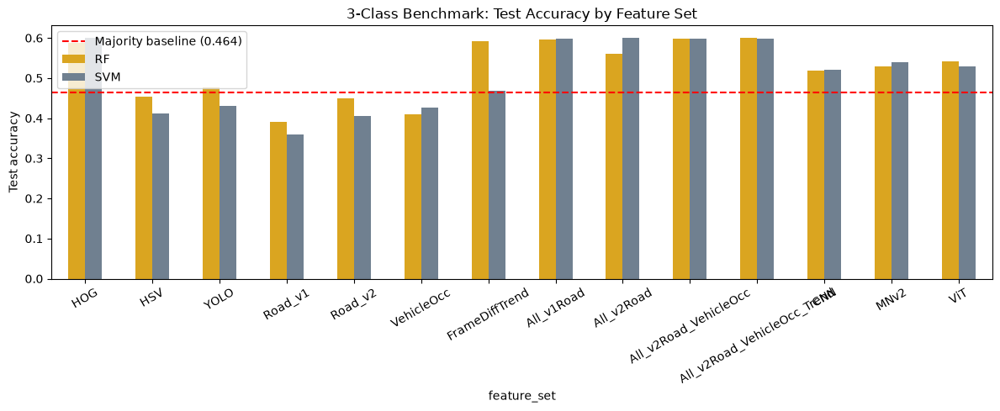

In [21]:
fig, ax = plt.subplots(figsize=(12, 5))
pivot = bench_df.pivot(index='feature_set', columns='model', values='accuracy')
pivot = pivot.reindex(feature_sets_clf.keys())
pivot.plot(kind='bar', ax=ax, color={'SVM': 'slategray', 'RF': 'goldenrod'})
ax.axhline(majority_baseline_3c, color='red', linestyle='--', label=f'Majority baseline ({majority_baseline_3c:.3f})')
ax.set_ylabel('Test accuracy')
ax.set_title('3-Class Benchmark: Test Accuracy by Feature Set')
ax.tick_params(axis='x', rotation=30)
ax.legend()
plt.tight_layout()
plt.savefig('outputs/benchmark_3class_accuracy.png', dpi=150)
plt.show()


## 10. Confusion matrix and per-class recall for the winning feature set

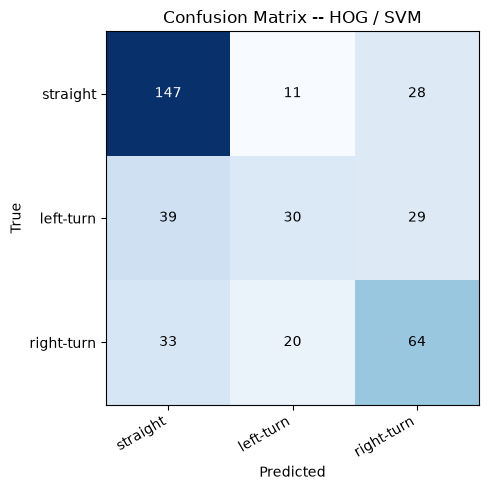

              precision    recall  f1-score   support

    straight       0.67      0.79      0.73       186
   left-turn       0.49      0.31      0.38        98
  right-turn       0.53      0.55      0.54       117

    accuracy                           0.60       401
   macro avg       0.56      0.55      0.55       401
weighted avg       0.59      0.60      0.59       401



In [22]:
best_name, best_model_name = best_row['feature_set'], best_row['model']
y_test, y_pred = predictions_store[(best_name, best_model_name)]

cm = confusion_matrix(y_test, y_pred, labels=CLASSES)
fig, ax = plt.subplots(figsize=(5.5, 5))
ax.imshow(cm, cmap='Blues')
ax.set_xticks(range(len(CLASSES))); ax.set_xticklabels(CLASSES, rotation=30, ha='right')
ax.set_yticks(range(len(CLASSES))); ax.set_yticklabels(CLASSES)
ax.set_xlabel('Predicted'); ax.set_ylabel('True')
ax.set_title(f'Confusion Matrix -- {best_name} / {best_model_name}')
for i in range(len(CLASSES)):
    for j in range(len(CLASSES)):
        ax.text(j, i, cm[i, j], ha='center', va='center',
                 color='white' if cm[i, j] > cm.max() / 2 else 'black')
plt.tight_layout()
plt.savefig('outputs/confusion_matrix_3class_best.png', dpi=150)
plt.show()

print(classification_report(y_test, y_pred, labels=CLASSES, zero_division=0))


## 11. PCA — class separability for the top feature sets

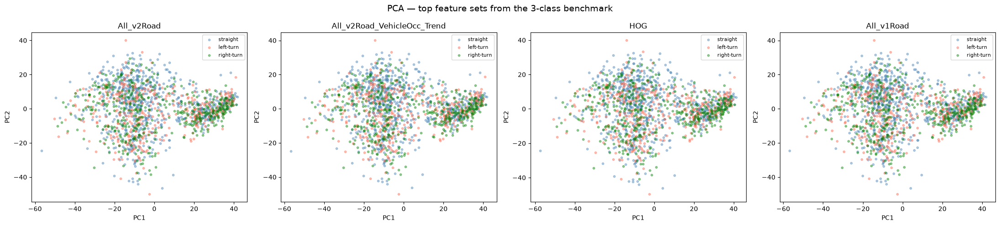

In [23]:
from sklearn.decomposition import PCA

top_names = bench_df.groupby('feature_set')['accuracy'].max().sort_values(ascending=False).head(4).index.tolist()

fig, axes = plt.subplots(1, len(top_names), figsize=(5.5 * len(top_names), 5))
if len(top_names) == 1:
    axes = [axes]
for ax, name in zip(axes, top_names):
    feats = feature_sets_clf[name]
    scaled = StandardScaler().fit_transform(feats)
    proj = PCA(n_components=2, random_state=RANDOM_STATE).fit_transform(scaled)
    for cls in CLASSES:
        mask = labels_3c == cls
        ax.scatter(proj[mask, 0], proj[mask, 1], c=COLORS[cls], label=cls, alpha=0.4, s=10)
    ax.set_title(name); ax.set_xlabel('PC1'); ax.set_ylabel('PC2'); ax.legend(fontsize=8)
plt.suptitle('PCA — top feature sets from the 3-class benchmark', fontsize=14)
plt.tight_layout()
plt.savefig('outputs/pca_3class_top_sets.png', dpi=140)
plt.show()


## 12. Save the final chosen feature set

Saved under a `_3class` suffix so nothing here overwrites the original 5-class arrays,
matching the non-destructive convention already used by `Waymo_feature_extraction_v2.ipynb`.

In [24]:
FINAL_FEATURE_SET_NAME = best_row['feature_set']  # override manually if you want a
                                                    # different combination than the raw winner
                                                    # (e.g. for interpretability or runtime)
final_X = feature_sets_clf[FINAL_FEATURE_SET_NAME]

output_path = os.path.join(FEATURES_DIR, f'X_final_3class.npy')
if os.path.exists(output_path):
    warnings.warn(f'{output_path} already exists -- overwriting with the current winning set '
                   f'({FINAL_FEATURE_SET_NAME}). Rename the old file first if you want to keep it.')

np.save(output_path, final_X)
np.save(os.path.join(FEATURES_DIR, 'labels_final_3class.npy'), labels_3c)
np.save(os.path.join(FEATURES_DIR, 'seq_ids_final_3class.npy'), seq_ids_3c)

print(f'Final feature set: {FINAL_FEATURE_SET_NAME}  shape={final_X.shape}')
print('Saved X_final_3class.npy, labels_final_3class.npy, seq_ids_final_3class.npy')


Final feature set: HOG  shape=(1604, 5796)
Saved X_final_3class.npy, labels_final_3class.npy, seq_ids_final_3class.npy


## 13. QA summary & interpretation notes

Fill in after running, using the printed output from each QA block above:

- **Base-array provenance (Section 1):** did `seq_ids.npy` match a fresh
  `manifest.items()` ordering? If not, every array derived positionally from the base
  features (including this notebook's own `road_v2`/`vehicle_occupancy` loop) needs to
  switch from positional indexing to explicit seq_id lookups.
- **v1 vs v2 road-geometry agreement (Section 6):** which shared dimensions correlated
  well, and which diverged? A divergence isn't necessarily a bug (v2 uses a tighter
  center-camera crop and adaptive ROI) but should be understood before trusting v2 over
  v1, or vice versa.
- **Directional checks (Section 6):** did `vp_x` / `road_centroid_x` actually order as
  `left-turn < straight < right-turn` (or the reverse, consistently)? If the ANOVA
  wasn't significant for a feature, that feature is not pulling weight for this task no
  matter how it scores in the combined benchmark — flag it for removal rather than
  silently keeping it in `All_*` combinations.
- **Degenerate-fallback rates (Section 6):** if the VP or road-segmentation fallback
  rate is meaningfully higher for one class than the others, part of what the classifier
  learns may be "which class tends to have messier imagery" rather than road geometry —
  worth a targeted look at the failure cases for that class.
- **Frame-difference trend (Section 8):** did re-purposing this feature for turn
  detection actually help, or was its earlier failure on `lane-change-*` a sign the
  underlying signal is just noisy at this sampling rate regardless of target class?
- **Benchmark winner (Section 9):** record the winning feature set and accuracy here,
  and compare its macro-F1 (not just accuracy) against the majority baseline — with only
  3 classes the majority baseline is much higher than in the 5-class task, so accuracy
  alone is a weaker signal of real progress.


In [29]:
from standard_e2e import Modality, TrajectoryComponent

FAILURE_ANALYSIS_FEATURE_SET = 'HOG'  # match FINAL_FEATURE_SET_NAME unless you've changed it
FAILURE_ANALYSIS_MODEL = 'SVM'        # 'SVM' or 'RF' -- match whichever won in Section 9

feats_fa = feature_sets_clf[FAILURE_ANALYSIS_FEATURE_SET]
idx_fa = np.arange(len(labels_3c))
Xtr, Xte, ytr, yte, itr, ite = train_test_split(
    feats_fa, labels_3c, idx_fa, test_size=0.25, random_state=RANDOM_STATE, stratify=labels_3c)

scaler_fa = StandardScaler().fit(Xtr)
if FAILURE_ANALYSIS_MODEL == 'SVM':
    clf_fa = SVC(kernel='rbf', class_weight='balanced', random_state=RANDOM_STATE).fit(scaler_fa.transform(Xtr), ytr)
    pred_fa = clf_fa.predict(scaler_fa.transform(Xte))
else:
    clf_fa = RandomForestClassifier(n_estimators=300, class_weight='balanced', random_state=RANDOM_STATE, n_jobs=-1).fit(Xtr, ytr)
    pred_fa = clf_fa.predict(Xte)

test_seq_ids_fa = seq_ids_3c[ite]
acc_fa = (pred_fa == yte).mean()
print(f'{FAILURE_ANALYSIS_FEATURE_SET}/{FAILURE_ANALYSIS_MODEL} reproduced test acc: {acc_fa:.3f} (should match Section 9/10)')

failures_df = pd.DataFrame({
    'seq_id': test_seq_ids_fa, 'true': yte, 'pred': pred_fa,
}).query('true != pred').reset_index(drop=True)
print(f'{len(failures_df)} misclassified out of {len(yte)} test rows')
print(failures_df.groupby(['true', 'pred']).size().rename('count').reset_index().to_string(index=False))

HOG/SVM reproduced test acc: 0.601 (should match Section 9/10)
160 misclassified out of 401 test rows
      true       pred  count
 left-turn right-turn     29
 left-turn   straight     39
right-turn  left-turn     20
right-turn   straight     33
  straight  left-turn     11
  straight right-turn     28


In [30]:
# --- Timing diagnostic: how much of the turn has actually happened by the target frame? ---
def turn_progress_profile(sid, checkpoints=(0.25, 0.5, 0.75, 1.0)):
    entry = manifest[sid]
    d = np.load(os.path.join(TRAIN_DIR, entry['target_fname']), allow_pickle=True)
    fut = d['_modality_data'].item()[Modality.FUTURE_STATES]
    xs = fut.get(TrajectoryComponent.X).flatten()
    ys = fut.get(TrajectoryComponent.Y).flatten()
    valid = fut.get(TrajectoryComponent.IS_VALID).flatten().astype(bool)
    xs, ys = xs[valid], ys[valid]
    n = len(xs)
    if n < 4:
        return None
    k0 = max(2, int(0.15 * n))
    initial_heading = np.arctan2(ys[k0] - ys[0], xs[k0] - xs[0])
    final_heading = np.arctan2(ys[-1] - ys[max(0, n - 1 - k0)], xs[-1] - xs[max(0, n - 1 - k0)])
    total_turn = np.degrees(np.arctan2(np.sin(final_heading - initial_heading), np.cos(final_heading - initial_heading)))
    out = {'total_turn_deg': total_turn}
    for frac in checkpoints:
        idx = max(1, int(round(frac * (n - 1))))
        chord_heading = np.arctan2(ys[idx] - ys[0], xs[idx] - xs[0])
        turn_so_far = np.degrees(np.arctan2(np.sin(chord_heading - initial_heading), np.cos(chord_heading - initial_heading)))
        out[f'turn_by_{int(frac*100)}pct_window_deg'] = turn_so_far
    return out

profiles = []
for sid, label in zip(seq_ids_3c, labels_3c):
    if label not in ('left-turn', 'right-turn'):
        continue
    p = turn_progress_profile(sid)
    if p is not None:
        p['seq_id'] = sid
        p['label'] = label
        profiles.append(p)

profile_df = pd.DataFrame(profiles)
profile_df['pct_turn_done_by_25'] = (profile_df['turn_by_25pct_window_deg'] / profile_df['total_turn_deg']).clip(-3, 3)
profile_df['pct_turn_done_by_50'] = (profile_df['turn_by_50pct_window_deg'] / profile_df['total_turn_deg']).clip(-3, 3)

summary = profile_df.groupby('label')[['total_turn_deg', 'pct_turn_done_by_25', 'pct_turn_done_by_50']].mean()
print('Mean total heading change, and fraction of it already "visible" by 25%/50% into the future window:')
print(summary.round(3).to_string())
print()
median_25 = profile_df['pct_turn_done_by_25'].median()
if median_25 < 0.15:
    print(f'Median turn-progress by 25% of the window: {median_25:.1%} -- very little of the turn has')
    print('happened yet at that point. The target frame (t=0 of this window) has even less. This is')
    print('consistent with single-frame features having a low ceiling here regardless of how good the')
    print('road-geometry computation is -- the causal signal may genuinely not be visible yet.')
else:
    print(f'Median turn-progress by 25% of the window: {median_25:.1%} -- a meaningful fraction of the')
    print('turn is already underway early on. That argues the signal IS available near the target frame,')
    print('and the current features are likely just not capturing it well -- feature engineering effort')
    print('is more likely to pay off here than in a task-timing problem.')

profile_df.to_csv(os.path.join(FEATURES_DIR, 'qa_turn_timing_profile_3class.csv'), index=False)
print('Saved qa_turn_timing_profile_3class.csv')

Mean total heading change, and fraction of it already "visible" by 25%/50% into the future window:
            total_turn_deg  pct_turn_done_by_25  pct_turn_done_by_50
label                                                               
left-turn        16.356001                0.056                0.108
right-turn      -12.788000                0.019                0.114

Median turn-progress by 25% of the window: 0.2% -- very little of the turn has
happened yet at that point. The target frame (t=0 of this window) has even less. This is
consistent with single-frame features having a low ceiling here regardless of how good the
road-geometry computation is -- the causal signal may genuinely not be visible yet.
Saved qa_turn_timing_profile_3class.csv


In [31]:
# --- Severity diagnostic: does recall track turn magnitude? ---
sev_lookup = profile_df.set_index('seq_id')['total_turn_deg'].to_dict()
fail_seq_ids = set(failures_df['seq_id'])

bins = [(0, 5), (5, 10), (10, 20), (20, 45), (45, 1e9)]
rows = []
for lbl in ['left-turn', 'right-turn']:
    sub = profile_df[profile_df['label'] == lbl]
    for lo, hi in bins:
        m = sub['total_turn_deg'].abs().between(lo, hi, inclusive='left')
        sids_in_bin = set(sub.loc[m, 'seq_id'])
        scoreable = sids_in_bin & set(test_seq_ids_fa)
        if not scoreable:
            continue
        n_fail = len(scoreable & fail_seq_ids)
        rows.append({
            'class': lbl, 'severity_bin_deg': f'{lo}-{hi if hi < 1e6 else "inf"}',
            'n_test': len(scoreable), 'n_correct': len(scoreable) - n_fail,
            'recall': (len(scoreable) - n_fail) / len(scoreable),
        })
severity_df = pd.DataFrame(rows)
print(severity_df.round(3).to_string(index=False))
severity_df.to_csv(os.path.join(FEATURES_DIR, 'qa_severity_vs_recall_3class.csv'), index=False)
print('\nRead this as: if recall climbs steadily with severity_bin_deg, failures are concentrated')
print('in ambiguous/gentle turns (expected, less concerning). If recall stays flat and low even in')
print('the largest bins, the model is missing sharp turns too -- a stronger signal problem.')
print('Saved qa_severity_vs_recall_3class.csv')

     class severity_bin_deg  n_test  n_correct  recall
 left-turn            20-45      78         24   0.308
 left-turn           45-inf      20          6   0.300
right-turn            10-20       7          2   0.286
right-turn            20-45      86         48   0.558
right-turn           45-inf      24         14   0.583

Read this as: if recall climbs steadily with severity_bin_deg, failures are concentrated
in ambiguous/gentle turns (expected, less concerning). If recall stays flat and low even in
the largest bins, the model is missing sharp turns too -- a stronger signal problem.
Saved qa_severity_vs_recall_3class.csv


--- left-turn failures (3 shown of 68 total) ---


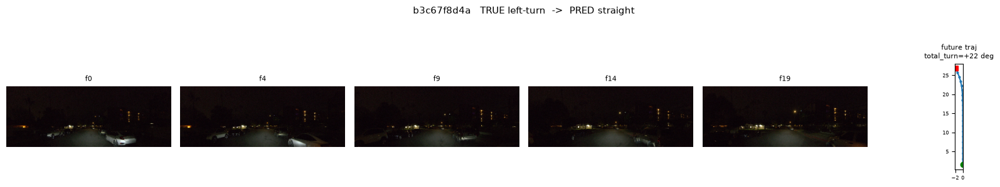

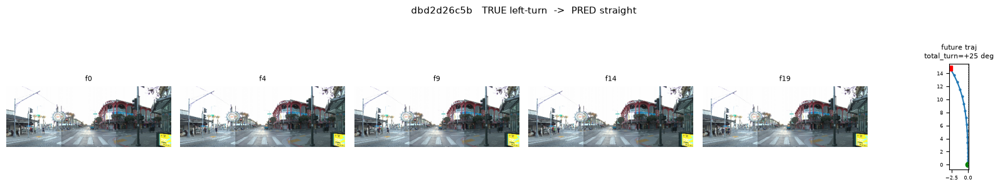

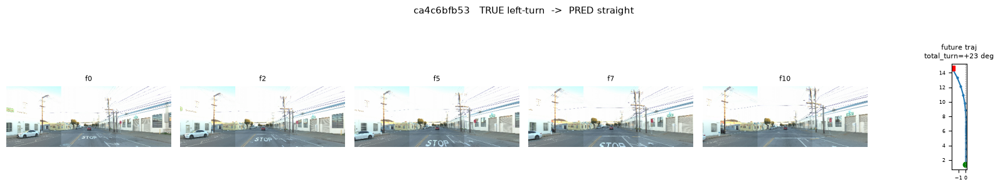

--- right-turn failures (3 shown of 53 total) ---


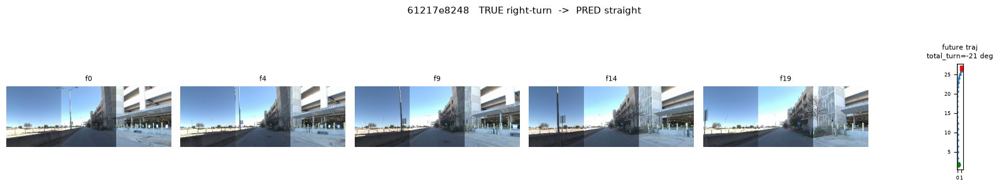

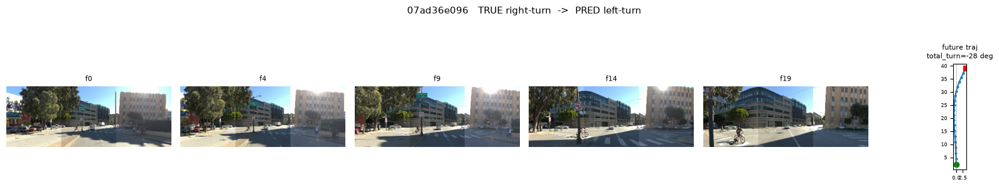

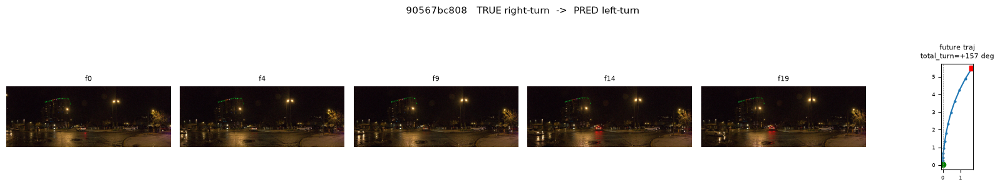

In [32]:
# --- Visual review: a handful of actual left-turn / right-turn failures ---
def diag_panel(sid, true, pred, n_frames=5):
    entry = manifest[sid]
    frames = entry['context_fnames']
    fidx = np.linspace(0, len(frames) - 1, n_frames).astype(int)

    d = np.load(os.path.join(TRAIN_DIR, entry['target_fname']), allow_pickle=True)
    fut = d['_modality_data'].item()[Modality.FUTURE_STATES]
    xs = fut.get(TrajectoryComponent.X).flatten()
    ys = fut.get(TrajectoryComponent.Y).flatten()

    def _load(fn):
        di = np.load(os.path.join(TRAIN_DIR, fn), allow_pickle=True)
        return np.array(di['_modality_data'].item()[Modality.CAMERAS])

    fig, axes = plt.subplots(1, n_frames + 1, figsize=((n_frames + 1) * 2.8, 2.8))
    for j, fi in enumerate(fidx):
        axes[j].imshow(_load(frames[fi])); axes[j].axis('off'); axes[j].set_title(f'f{fi}', fontsize=8)
    ax = axes[-1]
    ax.plot(-ys, xs, '-o', ms=2); ax.plot(-ys[0], xs[0], 'go', ms=6); ax.plot(-ys[-1], xs[-1], 'rs', ms=6)
    ax.axvline(0, color='gray', lw=.5, ls='--'); ax.set_aspect('equal', 'box')
    total_turn = profile_df.set_index('seq_id')['total_turn_deg'].get(sid, float('nan'))
    ax.set_title(f'future traj\ntotal_turn={total_turn:+.0f} deg', fontsize=8)
    ax.tick_params(labelsize=6)
    fig.suptitle(f'{sid[:10]}   TRUE {true}  ->  PRED {pred}', fontsize=11, y=1.05)
    plt.tight_layout()
    plt.savefig(f'outputs/failure_{true}_{sid[:8]}.png', dpi=110, bbox_inches='tight')
    plt.show()

for true_cls in ['left-turn', 'right-turn']:
    examples = failures_df[failures_df['true'] == true_cls].head(3)
    print(f'--- {true_cls} failures ({len(examples)} shown of {len(failures_df[failures_df["true"]==true_cls])} total) ---')
    for _, row in examples.iterrows():
        diag_panel(row['seq_id'], row['true'], row['pred'])

In [33]:
# --- Sanity check on turn_progress_profile() itself: distribution + wrong-signed rate ---
print(profile_df.groupby('label')['total_turn_deg'].describe().round(2).to_string())
print()

wrong_signed = {
    'left-turn': (profile_df[profile_df['label'] == 'left-turn']['total_turn_deg'] <= 0).mean(),
    'right-turn': (profile_df[profile_df['label'] == 'right-turn']['total_turn_deg'] >= 0).mean(),
}
print('Fraction of sequences where the computed sign DISAGREES with the label:')
for cls, rate in wrong_signed.items():
    print(f'  {cls:<12} {rate:.1%} wrong-signed')

if max(wrong_signed.values()) > 0.15:
    print('\nMore than 15% wrong-signed -- treat turn_progress_profile() as noisy. The 2-point')
    print('chord heading estimate (first ~15% vs last ~15% of the window) is sensitive to short')
    print('or noisy displacement near the endpoints. Consider a more robust fit (e.g. total')
    print('signed curvature integrated over consecutive-point heading deltas, or requiring a')
    print('minimum displacement before each chord is computed, matching the min_disp guard used')
    print('in feature_exploration_update.ipynb\'s _heading_ends()) before trusting the severity')
    print('bins above.')
else:
    print('\nSign agreement looks reasonable -- the severity bins are probably trustworthy as-is.')

            count   mean    std     min    25%    50%    75%     max
label                                                               
left-turn   392.0  16.36  54.53 -177.69  22.75  24.34  26.56  179.95
right-turn  467.0 -12.79  56.98 -179.65 -26.83 -24.00 -22.32  178.24

Fraction of sequences where the computed sign DISAGREES with the label:
  left-turn    11.7% wrong-signed
  right-turn   11.3% wrong-signed

Sign agreement looks reasonable -- the severity bins are probably trustworthy as-is.


In [34]:
# --- Does turn INITIATION timing, not just final magnitude, differ between left- and right-turn ---
large_bin_mask = profile_df['total_turn_deg'].abs() >= 20
large = profile_df[large_bin_mask]

init_rows = []
for cls in ['left-turn', 'right-turn']:
    sub = large[large['label'] == cls]
    init_rows.append({
        'class': cls,
        'n_large_turns': len(sub),
        'mean_pct_done_by_25': sub['pct_turn_done_by_25'].mean(),
        'mean_pct_done_by_50': sub['pct_turn_done_by_50'].mean(),
        'median_pct_done_by_50': sub['pct_turn_done_by_50'].median(),
    })
init_df = pd.DataFrame(init_rows)
print('Among LARGE turns only (|total_turn_deg| >= 20 deg):')
print(init_df.round(3).to_string(index=False))

gap_50 = init_df.set_index('class')['mean_pct_done_by_50']
if gap_50['left-turn'] < gap_50['right-turn'] * 0.7:
    print('\nLarge left-turns are, on average, meaningfully LESS underway by the window midpoint')
    print('than large right-turns -- consistent with left turns initiating later (gap-waiting /')
    print('signal-dependent), which would explain why severity alone does not rescue left-turn')
    print('recall the way it does for right-turn. Worth testing with real intersection/signal')
    print('context features rather than more motion-based ones.')
else:
    print('\nNo clear initiation-timing gap between large left- and right-turns -- the recall')
    print('asymmetry is probably not explained by "left turns start later." Worth checking the')
    print('visual failures above for a different explanation (e.g. left turns crossing wider')
    print('intersections that look more like "straight" for longer).')

Among LARGE turns only (|total_turn_deg| >= 20 deg):
     class  n_large_turns  mean_pct_done_by_25  mean_pct_done_by_50  median_pct_done_by_50
 left-turn            384                0.058                0.116                  0.025
right-turn            452                0.019                0.119                  0.031

No clear initiation-timing gap between large left- and right-turns -- the recall
asymmetry is probably not explained by "left turns start later." Worth checking the
visual failures above for a different explanation (e.g. left turns crossing wider
intersections that look more like "straight" for longer).


In [40]:
def _hue_in_ranges(h, ranges):
    m = np.zeros_like(h, dtype=bool)
    for lo, hi in ranges:
        m |= (h >= lo) & (h <= hi)
    return m

def classify_traffic_light_color(crop_rgb):
    '''Rough color-based state classifier for a cropped traffic-light box. Splits the
    box into thirds (top/mid/bottom -- standard vertical light layout) and scores each
    third for red/yellow/green hue + brightness/saturation. Returns (color, score);
    color is 'unknown' if no third clears a minimum score.'''
    if crop_rgb.size == 0 or crop_rgb.shape[0] < 6 or crop_rgb.shape[1] < 3:
        return 'unknown', 0.0
    hsv = cv2.cvtColor(crop_rgb, cv2.COLOR_RGB2HSV)
    H, W = hsv.shape[:2]
    thirds = {'red': hsv[0:H // 3], 'yellow': hsv[H // 3:2 * H // 3], 'green': hsv[2 * H // 3:H]}
    hue_ranges = {'red': [(0, 10), (170, 180)], 'yellow': [(15, 35)], 'green': [(40, 90)]}
    scores = {}
    for color, region in thirds.items():
        if region.size == 0:
            scores[color] = 0.0
            continue
        h, s, v = region[..., 0], region[..., 1], region[..., 2]
        bright_sat = (s > 80) & (v > 120)
        hue_ok = _hue_in_ranges(h, hue_ranges[color])
        scores[color] = float((bright_sat & hue_ok).mean())
    best = max(scores, key=scores.get)
    if scores[best] < 0.03:
        return 'unknown', scores[best]
    return best, scores[best]


def traffic_light_scene_state(img, yolo_results):
    '''Counts of red/yellow/green/unknown across all detected traffic-light boxes (COCO
    class 9) in the frame.'''
    H, W = img.shape[:2]
    counts = {'red': 0, 'yellow': 0, 'green': 0, 'unknown': 0}
    for box in yolo_results[0].boxes:
        if int(box.cls) != 9:
            continue
        x1, y1, x2, y2 = [int(v) for v in box.xyxy[0].tolist()]
        x1, y1, x2, y2 = max(0, x1), max(0, y1), min(W, x2), min(H, y2)
        color, _ = classify_traffic_light_color(img[y1:y2, x1:x2])
        counts[color] += 1
    return counts


def detect_horizontal_road_markings(img, canny_low=40, canny_high=120, hough_threshold=15,
                                     min_line_length_frac=0.15, max_line_gap=6, road_region_frac=0.55):
    '''Near-horizontal line detector for stop lines / crosswalk stripes -- a SEPARATE pass
    from detect_edges_and_lines(), which explicitly filters these out.

    TIGHTENED (v2): the unrestricted version returned ~40-50 "horizontal lines" even on
    frames with no visible markings at all (QA finding on the segmented panel -- straight,
    left-turn, and right-turn all scored similarly high). It was mostly picking up generic
    scene clutter (trees, buildings, parked cars, power lines) within the lower ROI, not
    pavement paint. Fix: candidate edge pixels must ALSO be near-white or near-yellow in
    HSV (lane-marking paint colors), which asphalt/concrete/foliage/most vehicle paint is
    not. min_line_length now scales with crop width (min_line_length_frac) so this behaves
    consistently whether called on the full 384px panorama or a 128px segment.

    Deliberately NOT intersected with segment_road()'s flood-filled mask: that flood fill is
    seeded from asphalt color and spreads through color-similar pixels, so it tends to leave
    holes exactly where bright paint markings are rather than including them -- intersecting
    with it would remove real signal, not just clutter.'''
    H, W = img.shape[:2]
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    h, s, v = hsv[..., 0], hsv[..., 1], hsv[..., 2]

    near_white = (s < 60) & (v > 150)
    near_yellow = (h >= 15) & (h <= 35) & (s > 60) & (v > 120)
    marking_color_mask = near_white | near_yellow

    roi_mask = np.zeros_like(gray, dtype=bool)
    roi_mask[int(H * road_region_frac):, :] = True

    edges = cv2.Canny(gray, canny_low, canny_high) > 0
    edges_masked = (edges & marking_color_mask & roi_mask).astype(np.uint8) * 255

    min_line_length = max(6, int(min_line_length_frac * W))
    lines_raw = cv2.HoughLinesP(edges_masked, rho=1, theta=np.pi / 180, threshold=hough_threshold,
                                 minLineLength=min_line_length, maxLineGap=max_line_gap)
    lines = []
    if lines_raw is not None:
        for line in lines_raw:
            x1, y1, x2, y2 = line[0]
            angle = abs(np.degrees(np.arctan2(y2 - y1, x2 - x1)))
            if angle < 15 or angle > 165:
                lines.append((x1, y1, x2, y2))
    return np.array(lines)


def stop_line_crosswalk_proxy(horiz_lines):
    '''Crude periodicity check: crosswalks are several evenly-spaced parallel stripes; a
    stop line is a single long segment. Returns (n_horizontal_lines, periodicity_score)
    where periodicity_score is high when inter-line gaps are evenly spaced.'''
    n = len(horiz_lines)
    if n < 2:
        return n, 0.0
    ys = sorted((l[1] + l[3]) / 2 for l in horiz_lines)
    gaps = np.diff(ys)
    if len(gaps) == 0 or np.mean(gaps) == 0:
        return n, 0.0
    periodicity = 1.0 / (1.0 + np.std(gaps) / np.mean(gaps))
    return n, float(periodicity)


def lane_count_proxy(lines, img_shape, y_frac=0.95, cluster_gap_frac=0.06):
    '''Estimate number of distinct lane-boundary lines by clustering where the near-vertical
    Hough lines (from detect_edges_and_lines) cross a fixed row near the bottom of frame --
    a rough proxy for multi-lane roads / turn pockets.'''
    H, W = img_shape[:2]
    y_ref = y_frac * H
    xs = []
    for x1, y1, x2, y2 in lines:
        if y1 == y2:
            continue
        t = (y_ref - y1) / (y2 - y1)
        x_at_y = x1 + t * (x2 - x1)
        if -0.2 * W <= x_at_y <= 1.2 * W:
            xs.append(x_at_y)
    if not xs:
        return 0
    xs = sorted(xs)
    gap = cluster_gap_frac * W
    clusters = 1
    for i in range(1, len(xs)):
        if xs[i] - xs[i - 1] > gap:
            clusters += 1
    return clusters


def ego_lane_offset(road_mask, y_frac=0.95):
    '''Signed offset of the assumed ego position (bottom-center of frame) from the midpoint
    of the segmented road's left/right extent at a row near the bottom. Negative = ego
    appears left of road center, positive = right.'''
    H, W = road_mask.shape
    row = road_mask[int(y_frac * H), :]
    xs = np.where(row > 0)[0]
    if len(xs) == 0:
        return 0.0
    road_center = (xs.min() + xs.max()) / 2
    return float((W / 2 - road_center) / W)


def build_scene_cue_features(img, yolo_results=None):
    if yolo_results is None:
        yolo_results = yolo_model(img, verbose=False)
    tl_counts = traffic_light_scene_state(img, yolo_results)
    _, lines_v1, _ = detect_edges_and_lines(img)
    horiz_lines = detect_horizontal_road_markings(img)
    n_horiz, periodicity = stop_line_crosswalk_proxy(horiz_lines)
    n_lanes = lane_count_proxy(lines_v1, img.shape)
    road_mask, _ = segment_road(img)
    ego_offset = ego_lane_offset(road_mask)
    stop_sign_present = any(int(b.cls) == 11 for b in yolo_results[0].boxes)
    return np.array([
        tl_counts['red'], tl_counts['yellow'], tl_counts['green'], tl_counts['unknown'],
        n_horiz, periodicity, n_lanes, ego_offset, float(stop_sign_present),
    ], dtype=np.float32)

SCENE_CUE_DIMS = ['tl_red_count', 'tl_yellow_count', 'tl_green_count', 'tl_unknown_count',
                   'n_horizontal_markings', 'stripe_periodicity', 'lane_count_proxy',
                   'ego_lane_offset', 'stop_sign_present']
print('Scene-cue prototype functions loaded (NOT yet validated -- see visual QA panel below).')

Scene-cue prototype functions loaded (NOT yet validated -- see visual QA panel below).


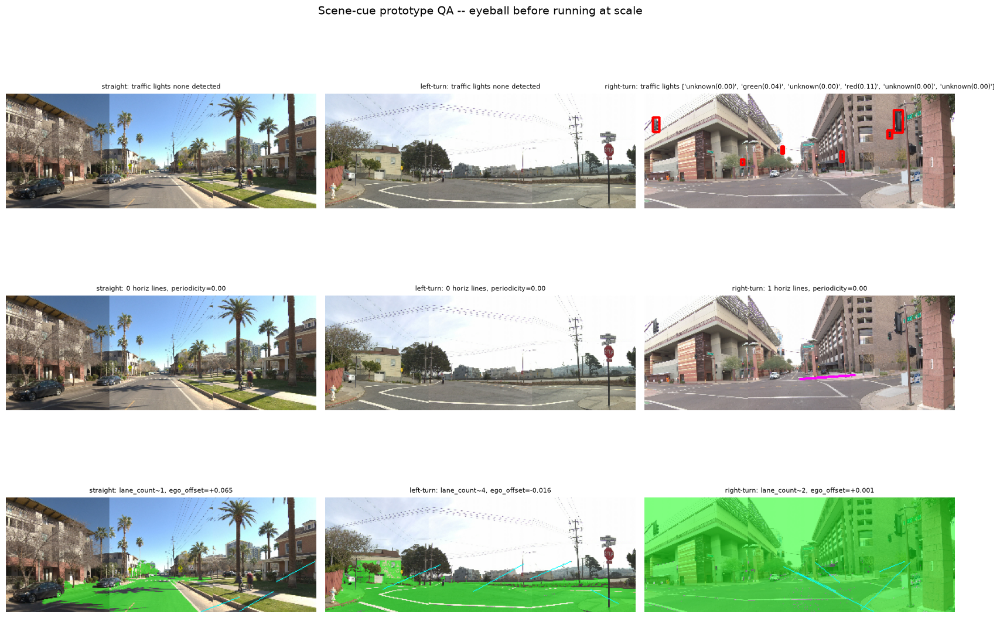

Review each row above against the actual frame before deciding whether build_scene_cue_features()
is worth extracting across all 1,604 sequences and adding to the Section 9 benchmark.


In [41]:
# --- Visual QA for the scene-cue prototypes, on the same 3 example frames used earlier ---
fig, axes = plt.subplots(3, len(CLASSES), figsize=(5.5 * len(CLASSES), 12))
for i, cls in enumerate(CLASSES):
    img = qa_examples[cls]
    H, W = img.shape[:2]
    yres = yolo_model(img, verbose=False)

    img_tl = img.copy()
    tl_labels = []
    for box in yres[0].boxes:
        if int(box.cls) != 9:
            continue
        x1, y1, x2, y2 = [int(v) for v in box.xyxy[0].tolist()]
        color, score = classify_traffic_light_color(img[max(0,y1):y2, max(0,x1):x2])
        cv2.rectangle(img_tl, (x1, y1), (x2, y2), (255, 0, 0), 2)
        tl_labels.append(f'{color}({score:.2f})')
    axes[0, i].imshow(img_tl)
    axes[0, i].set_title(f'{cls}: traffic lights {tl_labels or "none detected"}', fontsize=8)
    axes[0, i].axis('off')

    horiz_lines = detect_horizontal_road_markings(img)
    img_horiz = img.copy()
    for x1, y1, x2, y2 in horiz_lines:
        cv2.line(img_horiz, (int(x1), int(y1)), (int(x2), int(y2)), (255, 0, 255), 2)
    n_horiz, periodicity = stop_line_crosswalk_proxy(horiz_lines)
    axes[1, i].imshow(img_horiz)
    axes[1, i].set_title(f'{cls}: {n_horiz} horiz lines, periodicity={periodicity:.2f}', fontsize=8)
    axes[1, i].axis('off')

    _, lines_v1, _ = detect_edges_and_lines(img)
    n_lanes = lane_count_proxy(lines_v1, img.shape)
    road_mask, _ = segment_road(img)
    ego_offset = ego_lane_offset(road_mask)
    overlay = img.copy()
    overlay[road_mask > 0] = (overlay[road_mask > 0] * 0.5 + np.array([0, 255, 0]) * 0.5).astype(np.uint8)
    for x1, y1, x2, y2 in lines_v1:
        cv2.line(overlay, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 255), 1)
    axes[2, i].imshow(overlay)
    axes[2, i].set_title(f'{cls}: lane_count~{n_lanes}, ego_offset={ego_offset:+.3f}', fontsize=8)
    axes[2, i].axis('off')

plt.suptitle('Scene-cue prototype QA -- eyeball before running at scale', fontsize=14)
plt.tight_layout()
plt.savefig('outputs/qa_scene_cue_prototypes.png', dpi=130)
plt.show()
print('Review each row above against the actual frame before deciding whether build_scene_cue_features()')
print('is worth extracting across all 1,604 sequences and adding to the Section 9 benchmark.')

In [42]:
LEFT_SEG = (0, 128)
RIGHT_SEG = (256, 384)
PANORAMA_SEGMENTS = {'left': LEFT_SEG, 'center': CENTER_SEG, 'right': RIGHT_SEG}


def traffic_light_scene_state_seg(img, yolo_results, x0, x1):
    '''Same as traffic_light_scene_state(), but only counts detections whose box CENTER
    falls within [x0, x1) -- consistent with how vehicle_occupancy/extract_yolo_features
    assign detections to a camera segment elsewhere in this notebook.'''
    H, W = img.shape[:2]
    counts = {'red': 0, 'yellow': 0, 'green': 0, 'unknown': 0}
    for box in yolo_results[0].boxes:
        if int(box.cls) != 9:
            continue
        bx1, by1, bx2, by2 = box.xyxy[0].tolist()
        cx = (bx1 + bx2) / 2
        if not (x0 <= cx < x1):
            continue
        ix1, iy1, ix2, iy2 = [int(v) for v in (bx1, by1, bx2, by2)]
        ix1, iy1, ix2, iy2 = max(0, ix1), max(0, iy1), min(W, ix2), min(H, iy2)
        color, _ = classify_traffic_light_color(img[iy1:iy2, ix1:ix2])
        counts[color] += 1
    return counts


def stop_sign_present_seg(yolo_results, x0, x1):
    for box in yolo_results[0].boxes:
        if int(box.cls) != 11:
            continue
        bx1, _, bx2, _ = box.xyxy[0].tolist()
        cx = (bx1 + bx2) / 2
        if x0 <= cx < x1:
            return True
    return False


def build_scene_cue_features_segmented(img, yolo_results=None):
    '''Same scene-cue heuristics as build_scene_cue_features(), computed separately per
    panorama segment (left/center/right) and concatenated: 3 segments x 9 dims = 27 dims.
    Traffic-light color/stop-sign detections use full-panorama YOLO results filtered by
    box-center x-position (one YOLO call, not three); the Hough/segmentation-based cues
    (horizontal markings, lane count, road offset) run on each 128px crop independently.'''
    if yolo_results is None:
        yolo_results = yolo_model(img, verbose=False)

    feats, names = [], []
    for seg_name, (x0, x1) in PANORAMA_SEGMENTS.items():
        crop = img[:, x0:x1]

        tl_counts = traffic_light_scene_state_seg(img, yolo_results, x0, x1)
        _, lines_seg, _ = detect_edges_and_lines(crop)
        horiz_lines = detect_horizontal_road_markings(crop)
        n_horiz, periodicity = stop_line_crosswalk_proxy(horiz_lines)
        n_lanes = lane_count_proxy(lines_seg, crop.shape)
        road_mask_seg, _ = segment_road(crop)
        seg_offset = ego_lane_offset(road_mask_seg)
        stop_sign = stop_sign_present_seg(yolo_results, x0, x1)

        feats.extend([tl_counts['red'], tl_counts['yellow'], tl_counts['green'], tl_counts['unknown'],
                      n_horiz, periodicity, n_lanes, seg_offset, float(stop_sign)])
        names.extend([f'{seg_name}_{d}' for d in SCENE_CUE_DIMS])

    return np.array(feats, dtype=np.float32), names

_, SEGMENTED_SCENE_CUE_DIMS = build_scene_cue_features_segmented(qa_examples['straight'])
print(f'Segmented scene-cue prototype loaded: {len(SEGMENTED_SCENE_CUE_DIMS)} dims '
      f'(3 segments x {len(SCENE_CUE_DIMS)} dims each). NOT yet validated -- see QA panel below.')

Segmented scene-cue prototype loaded: 27 dims (3 segments x 9 dims each). NOT yet validated -- see QA panel below.


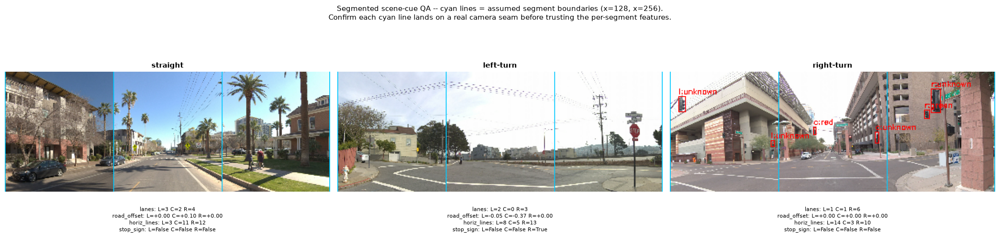

If the cyan lines do NOT line up with visible seams between camera views, LEFT_SEG/RIGHT_SEG
are wrong and every per-segment feature above is unreliable -- fix the boundaries first.


In [43]:
# --- Visual QA: confirm the segment boundaries are real seams, and per-segment cues look sane ---
fig, axes = plt.subplots(1, len(CLASSES), figsize=(7 * len(CLASSES), 5))
for i, cls in enumerate(CLASSES):
    img = qa_examples[cls]
    H, W = img.shape[:2]
    yres = yolo_model(img, verbose=False)
    feats, names = build_scene_cue_features_segmented(img, yolo_results=yres)
    feat_by_name = dict(zip(names, feats))

    overlay = img.copy()
    for box in yres[0].boxes:
        if int(box.cls) != 9:
            continue
        bx1, by1, bx2, by2 = [int(v) for v in box.xyxy[0].tolist()]
        cx = (bx1 + bx2) / 2
        seg = next(s for s, (x0, x1) in PANORAMA_SEGMENTS.items() if x0 <= cx < x1)
        color, score = classify_traffic_light_color(img[max(0,by1):by2, max(0,bx1):bx2])
        cv2.rectangle(overlay, (bx1, by1), (bx2, by2), (255, 0, 0), 1)
        cv2.putText(overlay, f'{seg[0]}:{color}', (bx1, max(0, by1 - 3)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.3, (255, 0, 0), 1)
    for x0, x1 in PANORAMA_SEGMENTS.values():
        cv2.line(overlay, (x0, 0), (x0, H), (0, 200, 255), 1)
    cv2.line(overlay, (W - 1, 0), (W - 1, H), (0, 200, 255), 1)

    ax = axes[i]
    ax.imshow(overlay)
    ax.set_title(cls, fontsize=11, fontweight='bold')
    ax.axis('off')
    lines = [f"lanes: L={feat_by_name['left_lane_count_proxy']:.0f} "
             f"C={feat_by_name['center_lane_count_proxy']:.0f} R={feat_by_name['right_lane_count_proxy']:.0f}",
             f"road_offset: L={feat_by_name['left_ego_lane_offset']:+.2f} "
             f"C={feat_by_name['center_ego_lane_offset']:+.2f} R={feat_by_name['right_ego_lane_offset']:+.2f}",
             f"horiz_lines: L={feat_by_name['left_n_horizontal_markings']:.0f} "
             f"C={feat_by_name['center_n_horizontal_markings']:.0f} R={feat_by_name['right_n_horizontal_markings']:.0f}",
             f"stop_sign: L={bool(feat_by_name['left_stop_sign_present'])} "
             f"C={bool(feat_by_name['center_stop_sign_present'])} R={bool(feat_by_name['right_stop_sign_present'])}"]
    ax.text(0.5, -0.12, '\n'.join(lines), transform=ax.transAxes, ha='center', va='top', fontsize=8)

plt.suptitle('Segmented scene-cue QA -- cyan lines = assumed segment boundaries (x=128, x=256).\n'
             'Confirm each cyan line lands on a real camera seam before trusting the per-segment features.',
             fontsize=11)
plt.tight_layout()
plt.savefig('outputs/qa_scene_cue_segmented.png', dpi=130, bbox_inches='tight')
plt.show()
print('If the cyan lines do NOT line up with visible seams between camera views, LEFT_SEG/RIGHT_SEG')
print('are wrong and every per-segment feature above is unreliable -- fix the boundaries first.')

### 14c. Traffic-law compatibility features

Derived from the segmented scene cues above -- no new image processing, just encoding the
actual right-of-way logic so the classifier doesn't have to rediscover it from raw counts:

- **Red light AHEAD** (center segment): going straight or turning left through it is a
  violation; a right turn after a stop is typically the only legal forward motion (US
  right-hand-traffic default, absent a "no turn on red" sign this pipeline can't detect).
  This doesn't mean the car WILL turn right -- it might just be stopped -- but among the
  three maneuver labels in this task, red-ahead should shift probability toward
  `right-turn` and away from `straight`/`left-turn`.
- **Green light AHEAD:** all three maneuvers are legal -- this is intentionally
  uninformative about *which* direction, unlike red.
- **No light detected ahead:** most likely an uncontrolled intersection or a plain stretch
  of road; no signal-based constraint applies.
- **Lane position:** a right turn is properly made from the rightmost lane, a left turn
  from the leftmost / a dedicated turn lane. The per-segment `ego_lane_offset` values
  already computed in 14b/14a are reused here as a rough "which side of the road am I on"
  proxy -- not a true per-lane-index detector, which would need actual lane-line
  segmentation this pipeline doesn't attempt.

Encoded as a single ordinal `signal_constraint` (`-1` = right-only, `0` = unconstrained,
`+1` = fully permissive) plus the raw binaries and lane-offset interaction terms, so both
the RF and the rbf-kernel SVM in the Section 9 benchmark have direct access to the
asymmetric constraint without having to infer it from co-occurring pixel counts.

In [44]:
def build_traffic_law_features(seg_feats, seg_names):
    '''Derived indicator/interaction features encoding basic turn-legality logic from an
    already-computed segmented scene-cue vector (see build_scene_cue_features_segmented).
    "Ahead" = the CENTER segment, since CENTER_SEG is the front-center camera.'''
    by_name = dict(zip(seg_names, seg_feats))

    red_ahead = float(by_name['center_tl_red_count'] > 0)
    green_ahead = float(by_name['center_tl_green_count'] > 0)
    yellow_ahead = float(by_name['center_tl_yellow_count'] > 0)
    stop_sign_ahead = by_name['center_stop_sign_present']

    # -1 = right-turn-only (red), 0 = unconstrained (no light, or yellow -- ambiguous),
    # +1 = fully permissive (green)
    signal_constraint = -1.0 if red_ahead else (1.0 if green_ahead else 0.0)

    center_offset = by_name['center_ego_lane_offset']
    left_offset = by_name['left_ego_lane_offset']
    right_offset = by_name['right_ego_lane_offset']

    feats = np.array([
        red_ahead, green_ahead, yellow_ahead, signal_constraint, stop_sign_ahead,
        center_offset, left_offset, right_offset,
        red_ahead * center_offset, green_ahead * center_offset,
    ], dtype=np.float32)
    names = ['red_ahead', 'green_ahead', 'yellow_ahead', 'signal_constraint', 'stop_sign_ahead',
             'center_lane_offset', 'left_lane_offset', 'right_lane_offset',
             'red_ahead_x_center_offset', 'green_ahead_x_center_offset']
    return feats, names


def build_scene_cue_features_with_traffic_law(img, yolo_results=None):
    '''Segmented scene cues (14b) + derived traffic-law features (14c), concatenated.
    27 + 10 = 37 dims.'''
    if yolo_results is None:
        yolo_results = yolo_model(img, verbose=False)
    seg_feats, seg_names = build_scene_cue_features_segmented(img, yolo_results=yolo_results)
    law_feats, law_names = build_traffic_law_features(seg_feats, seg_names)
    return np.concatenate([seg_feats, law_feats]), seg_names + law_names

_, TRAFFIC_LAW_FEATURE_NAMES = build_scene_cue_features_with_traffic_law(qa_examples['straight'])
print(f'Traffic-law feature builder loaded: {len(TRAFFIC_LAW_FEATURE_NAMES)} total dims '
      f'(27 segmented scene cues + 10 traffic-law derived).')

Traffic-law feature builder loaded: 37 total dims (27 segmented scene cues + 10 traffic-law derived).


In [45]:
# --- Quick validation on the 3 known QA examples: does the encoding do what's intended? ---
for cls in CLASSES:
    img = qa_examples[cls]
    yres = yolo_model(img, verbose=False)
    feats, names = build_scene_cue_features_with_traffic_law(img, yolo_results=yres)
    by_name = dict(zip(names, feats))
    print(f'{cls}:')
    print(f'  red_ahead={bool(by_name["red_ahead"])}  green_ahead={bool(by_name["green_ahead"])}  '
          f'signal_constraint={by_name["signal_constraint"]:+.0f}  stop_sign_ahead={bool(by_name["stop_sign_ahead"])}')
    print(f'  lane_offset: left={by_name["left_lane_offset"]:+.2f} center={by_name["center_lane_offset"]:+.2f} '
          f'right={by_name["right_lane_offset"]:+.2f}')
    if by_name['signal_constraint'] == -1.0:
        print(f'  -> encoding says "right-turn only" for this frame. Actual label: {cls}.'
              + ('  MATCH' if cls == 'right-turn' else '  mismatch (expected if car is stopped/waiting, not turning)'))
    print()

print('This is n=3, not validation -- it only tells you the encoding logic runs and produces the')
print('expected sign on at least one real red-light example. Real validation is: extract this over')
print('all 1,604 sequences, run the same directional_check()/ANOVA pattern used in Section 6 on')
print('signal_constraint and the lane-offset dims specifically, THEN add to the Section 9 benchmark.')

straight:
  red_ahead=False  green_ahead=False  signal_constraint=+0  stop_sign_ahead=False
  lane_offset: left=+0.00 center=+0.10 right=+0.00

left-turn:
  red_ahead=False  green_ahead=False  signal_constraint=+0  stop_sign_ahead=False
  lane_offset: left=-0.05 center=-0.37 right=+0.00

right-turn:
  red_ahead=True  green_ahead=False  signal_constraint=-1  stop_sign_ahead=False
  lane_offset: left=+0.00 center=+0.00 right=+0.00
  -> encoding says "right-turn only" for this frame. Actual label: right-turn.  MATCH

This is n=3, not validation -- it only tells you the encoding logic runs and produces the
expected sign on at least one real red-light example. Real validation is: extract this over
all 1,604 sequences, run the same directional_check()/ANOVA pattern used in Section 6 on
signal_constraint and the lane-offset dims specifically, THEN add to the Section 9 benchmark.


In [46]:
RECOMPUTE_SCENE_CUE_TRAFFIC_LAW = True  # set False to load cached arrays instead

scene_cue_seg_path = os.path.join(FEATURES_DIR, 'scene_cue_segmented_3class.npy')
traffic_law_path = os.path.join(FEATURES_DIR, 'traffic_law_3class.npy')
scene_cue_law_path = os.path.join(FEATURES_DIR, 'scene_cue_traffic_law_3class.npy')
scene_cue_law_names_path = os.path.join(FEATURES_DIR, 'scene_cue_traffic_law_feature_names.json')

if RECOMPUTE_SCENE_CUE_TRAFFIC_LAW:
    t0 = time.time()
    scene_cue_law_list = []
    for i, sid in enumerate(seq_ids_3c):
        if (i + 1) % 200 == 0:
            elapsed = time.time() - t0
            print(f'  {i+1}/{len(seq_ids_3c)} ({elapsed:.0f}s, '
                  f'{elapsed/(i+1)*(len(seq_ids_3c)-(i+1)):.0f}s remaining)')
        entry = manifest[sid]
        data = np.load(os.path.join(TRAIN_DIR, entry['target_fname']), allow_pickle=True)
        img = np.array(data['_modality_data'].item()[Modality.CAMERAS])

        yolo_results = yolo_model(img, verbose=False)
        feats, names = build_scene_cue_features_with_traffic_law(img, yolo_results=yolo_results)
        scene_cue_law_list.append(feats)

    scene_cue_law_3c = np.array(scene_cue_law_list, dtype=np.float32)
    scene_cue_seg_3c = scene_cue_law_3c[:, :27]
    traffic_law_3c = scene_cue_law_3c[:, 27:]

    np.save(scene_cue_seg_path, scene_cue_seg_3c)
    np.save(traffic_law_path, traffic_law_3c)
    np.save(scene_cue_law_path, scene_cue_law_3c)
    with open(scene_cue_law_names_path, 'w') as f:
        json.dump(names, f)

    print(f'\nDone in {time.time()-t0:.0f}s.')
    print(f'scene_cue_seg_3c shape: {scene_cue_seg_3c.shape}  (27 dims: 3 segments x 9 heuristics)')
    print(f'traffic_law_3c shape: {traffic_law_3c.shape}  (10 dims: signal_constraint + lane-offset terms)')
    print(f'scene_cue_law_3c shape: {scene_cue_law_3c.shape}  (37 dims, combined)')
    print('Saved scene_cue_segmented_3class.npy, traffic_law_3class.npy, scene_cue_traffic_law_3class.npy,')
    print('scene_cue_traffic_law_feature_names.json')
elif all(os.path.exists(p) for p in [scene_cue_seg_path, traffic_law_path, scene_cue_law_path]):
    scene_cue_seg_3c = np.load(scene_cue_seg_path)
    traffic_law_3c = np.load(traffic_law_path)
    scene_cue_law_3c = np.load(scene_cue_law_path)
    with open(scene_cue_law_names_path, 'r') as f:
        names = json.load(f)
    print(f'Loaded cached arrays: scene_cue_seg_3c {scene_cue_seg_3c.shape}, '
          f'traffic_law_3c {traffic_law_3c.shape}, scene_cue_law_3c {scene_cue_law_3c.shape}')
else:
    scene_cue_seg_3c = traffic_law_3c = scene_cue_law_3c = None
    print('RECOMPUTE_SCENE_CUE_TRAFFIC_LAW=False and no cached files found -- these feature sets')
    print('will be skipped in the benchmark below.')

assert scene_cue_law_3c is None or len(scene_cue_law_3c) == len(seq_ids_3c), \
    'scene_cue_law_3c row count does not match seq_ids_3c -- alignment broken, do not proceed to ANOVA/benchmark.'

  200/1604 (13s, 90s remaining)
  400/1604 (23s, 71s remaining)
  600/1604 (34s, 57s remaining)
  800/1604 (44s, 44s remaining)
  1000/1604 (54s, 33s remaining)
  1200/1604 (65s, 22s remaining)
  1400/1604 (75s, 11s remaining)
  1600/1604 (85s, 0s remaining)

Done in 85s.
scene_cue_seg_3c shape: (1604, 27)  (27 dims: 3 segments x 9 heuristics)
traffic_law_3c shape: (1604, 10)  (10 dims: signal_constraint + lane-offset terms)
scene_cue_law_3c shape: (1604, 37)  (37 dims, combined)
Saved scene_cue_segmented_3class.npy, traffic_law_3class.npy, scene_cue_traffic_law_3class.npy,
scene_cue_traffic_law_feature_names.json


In [47]:
assert scene_cue_law_3c is not None, 'Run the Section 14d extraction cell first.'

TRAFFIC_LAW_DIMS = {
    'signal_constraint': 3,
    'center_lane_offset': 5,
    'left_lane_offset': 6,
    'right_lane_offset': 7,
}

# --- Coverage check: how many sequences even have a light detected ahead? ---
red_ahead = traffic_law_3c[:, 0]
green_ahead = traffic_law_3c[:, 1]
yellow_ahead = traffic_law_3c[:, 2]
any_light_ahead = (red_ahead + green_ahead + yellow_ahead) > 0

coverage_rows = []
for c in CLASSES:
    m = labels_3c == c
    coverage_rows.append({
        'class': c, 'n': int(m.sum()),
        'any_light_ahead_rate': float(any_light_ahead[m].mean()),
        'red_ahead_rate': float(red_ahead[m].mean()),
        'green_ahead_rate': float(green_ahead[m].mean()),
    })
coverage_df = pd.DataFrame(coverage_rows)
print('Traffic-light detection prevalence by class (center segment):')
print(coverage_df.round(3).to_string(index=False))
print(f'\nOverall: {any_light_ahead.mean():.1%} of sequences have any traffic light detected ahead.')
print('If this is low, signal_constraint is mostly 0 (uninformative) for most rows -- the ANOVA')
print('below is only meaningful for however large that light-present slice actually is.\n')

# --- ANOVA / directional checks on the traffic-law-derived dims ---
traffic_law_directional_rows = []
for dim_name, idx in TRAFFIC_LAW_DIMS.items():
    traffic_law_directional_rows.append(
        directional_check(f'traffic_law {dim_name}', traffic_law_3c[:, idx], labels_3c))

traffic_law_directional_df = pd.DataFrame(traffic_law_directional_rows)
traffic_law_directional_df.to_csv(
    os.path.join(FEATURES_DIR, 'qa_directional_checks_traffic_law_3class.csv'), index=False)
print('Saved qa_directional_checks_traffic_law_3class.csv')

Traffic-light detection prevalence by class (center segment):
     class   n  any_light_ahead_rate  red_ahead_rate  green_ahead_rate
  straight 745                 0.070           0.027             0.035
 left-turn 392                 0.071           0.008             0.056
right-turn 467                 0.039           0.017             0.019

Overall: 6.1% of sequences have any traffic light detected ahead.
If this is low, signal_constraint is mostly 0 (uninformative) for most rows -- the ANOVA
below is only meaningful for however large that light-present slice actually is.

traffic_law signal_constraint:
    straight     mean=+0.0067  sem=0.0090
    left-turn    mean=+0.0459  sem=0.0123
    right-turn   mean=+0.0000  sem=0.0086
    one-way ANOVA: F=5.05, p=6.54e-03  (significant at alpha=0.05)
    direction check: REVERSED order (left > straight > right)

traffic_law center_lane_offset:
    straight     mean=+0.0056  sem=0.0026
    left-turn    mean=-0.0037  sem=0.0034
    right-tur

In [48]:
assert scene_cue_law_3c is not None, 'Run the Section 14d extraction cell first.'

feature_sets_clf_v2 = dict(feature_sets_clf)  # every Section 9 candidate, as a baseline
feature_sets_clf_v2['SceneCueSegmented'] = scene_cue_seg_3c
feature_sets_clf_v2['TrafficLaw'] = traffic_law_3c
feature_sets_clf_v2['SceneCueSegmented_TrafficLaw'] = scene_cue_law_3c

# Stack on top of the Section 9 solo winner too -- checks whether these features add
# anything on top of the strongest existing signal, not just how they do alone.
best_solo_name = bench_df.loc[bench_df['accuracy'].idxmax(), 'feature_set']
if best_solo_name in feature_sets_clf:
    feature_sets_clf_v2[f'{best_solo_name}_SceneCueTrafficLaw'] = np.concatenate(
        [feature_sets_clf[best_solo_name], scene_cue_law_3c], axis=1)

print(f'Section 9 solo winner: {best_solo_name} (acc={bench_df["accuracy"].max():.3f})')
print(f'Candidate feature sets for this re-benchmark: {list(feature_sets_clf_v2.keys())}')

Section 9 solo winner: HOG (acc=0.601)
Candidate feature sets for this re-benchmark: ['HOG', 'HSV', 'YOLO', 'Road_v1', 'Road_v2', 'VehicleOcc', 'FrameDiffTrend', 'All_v1Road', 'All_v2Road', 'All_v2Road_VehicleOcc', 'All_v2Road_VehicleOcc_Trend', 'CNN', 'MNv2', 'ViT', 'SceneCueSegmented', 'TrafficLaw', 'SceneCueSegmented_TrafficLaw', 'HOG_SceneCueTrafficLaw']


In [49]:
bench_rows_v2 = []
predictions_store_v2 = {}

for name, feats in feature_sets_clf_v2.items():
    X_train, X_test, y_train, y_test = train_test_split(
        feats, labels_3c, test_size=0.25, random_state=RANDOM_STATE, stratify=labels_3c)
    scaler = StandardScaler()
    X_train_s, X_test_s = scaler.fit_transform(X_train), scaler.transform(X_test)

    svm = SVC(kernel='rbf', class_weight='balanced', random_state=RANDOM_STATE)
    svm.fit(X_train_s, y_train)
    svm_pred = svm.predict(X_test_s)

    rf = RandomForestClassifier(n_estimators=300, class_weight='balanced',
                                 random_state=RANDOM_STATE, n_jobs=-1)
    rf.fit(X_train, y_train)
    rf_pred = rf.predict(X_test)

    for model_name, pred in [('SVM', svm_pred), ('RF', rf_pred)]:
        acc = accuracy_score(y_test, pred)
        macro_f1 = f1_score(y_test, pred, labels=CLASSES, average='macro', zero_division=0)
        bench_rows_v2.append({'feature_set': name, 'model': model_name, 'accuracy': acc, 'macro_f1': macro_f1})
        predictions_store_v2[(name, model_name)] = (y_test, pred)

    print(f'{name:32s}  SVM acc={accuracy_score(y_test, svm_pred):.3f}  '
          f'RF acc={accuracy_score(y_test, rf_pred):.3f}')

bench_df_v2 = pd.DataFrame(bench_rows_v2)
bench_df_v2.to_csv(os.path.join(FEATURES_DIR, 'benchmark_3class_scene_cue.csv'), index=False)

combined_bench_df = pd.concat([bench_df, bench_df_v2], ignore_index=True).drop_duplicates(
    subset=['feature_set', 'model'], keep='last')
best_row_v2 = combined_bench_df.loc[combined_bench_df['accuracy'].idxmax()]
print(f'\nBest overall (Section 9 + 14f combined): {best_row_v2["feature_set"]} / {best_row_v2["model"]}  '
      f'acc={best_row_v2["accuracy"]:.3f}  macro_f1={best_row_v2["macro_f1"]:.3f}')
print(f'(Section 9 solo winner was {best_solo_name}, acc={bench_df["accuracy"].max():.3f}, for comparison)')
print('Saved benchmark_3class_scene_cue.csv')

HOG                               SVM acc=0.601  RF acc=0.589
HSV                               SVM acc=0.411  RF acc=0.454
YOLO                              SVM acc=0.431  RF acc=0.476
Road_v1                           SVM acc=0.359  RF acc=0.392
Road_v2                           SVM acc=0.406  RF acc=0.449
VehicleOcc                        SVM acc=0.426  RF acc=0.409
FrameDiffTrend                    SVM acc=0.469  RF acc=0.591
All_v1Road                        SVM acc=0.599  RF acc=0.596
All_v2Road                        SVM acc=0.601  RF acc=0.561
All_v2Road_VehicleOcc             SVM acc=0.599  RF acc=0.599
All_v2Road_VehicleOcc_Trend       SVM acc=0.599  RF acc=0.601
CNN                               SVM acc=0.521  RF acc=0.519
MNv2                              SVM acc=0.539  RF acc=0.529
ViT                               SVM acc=0.529  RF acc=0.541
SceneCueSegmented                 SVM acc=0.406  RF acc=0.449
TrafficLaw                        SVM acc=0.367  RF acc=0.362
SceneCue

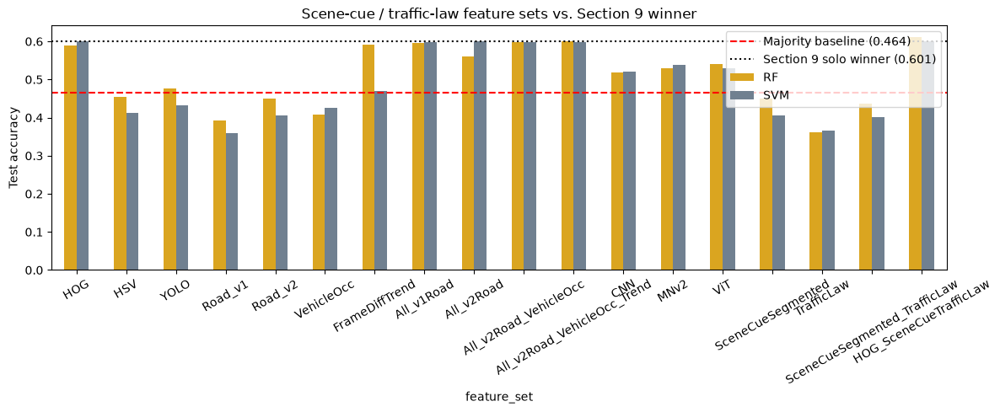

In [50]:
fig, ax = plt.subplots(figsize=(12, 5))
pivot_v2 = bench_df_v2.pivot(index='feature_set', columns='model', values='accuracy')
pivot_v2 = pivot_v2.reindex(feature_sets_clf_v2.keys())
pivot_v2.plot(kind='bar', ax=ax, color={'SVM': 'slategray', 'RF': 'goldenrod'})
ax.axhline(majority_baseline_3c, color='red', linestyle='--',
           label=f'Majority baseline ({majority_baseline_3c:.3f})')
ax.axhline(bench_df['accuracy'].max(), color='black', linestyle=':',
           label=f'Section 9 solo winner ({bench_df["accuracy"].max():.3f})')
ax.set_ylabel('Test accuracy')
ax.set_title('Scene-cue / traffic-law feature sets vs. Section 9 winner')
ax.tick_params(axis='x', rotation=30)
ax.legend()
plt.tight_layout()
plt.savefig('outputs/benchmark_3class_scene_cue.png', dpi=150)
plt.show()

In [51]:
# --- Empirical heading-change (deg) bounds per class, reusing turn_progress_profile() from
# Section 13. Population-level only -- used to build fixed corridor templates, not per-frame
# per-sequence values. See cell 42 for this estimator's known noise characteristics.

all_class_profiles = []
for sid, label in zip(seq_ids_3c, labels_3c):
    p = turn_progress_profile(sid)
    if p is not None:
        p['seq_id'] = sid
        p['label'] = label
        all_class_profiles.append(p)
all_profile_df = pd.DataFrame(all_class_profiles)

TURN_DEG_PERCENTILES = (10, 90)  # robust bounds, not raw min/max -- cell 42 flagged this
                                  # estimator as noisy, so raw extremes would overweight outliers

deg_bounds = {}
for cls in CLASSES:
    vals = all_profile_df.loc[all_profile_df['label'] == cls, 'total_turn_deg']
    lo, hi = np.percentile(vals, TURN_DEG_PERCENTILES)
    deg_bounds[cls] = (float(lo), float(hi))

print(f'Empirical total_turn_deg bounds per class (p{TURN_DEG_PERCENTILES[0]}-p{TURN_DEG_PERCENTILES[1]}, '
      f'from FUTURE_STATES chord-heading estimate):')
for cls, (lo, hi) in deg_bounds.items():
    n = int((all_profile_df['label'] == cls).sum())
    print(f'  {cls:<12} [{lo:+.1f}, {hi:+.1f}] deg   (n={n})')

print('\nThese bounds are only as trustworthy as cell 42\'s wrong-signed-rate check said they were --')
print('re-check that output before trusting the corridor widths built from them below.')

Empirical total_turn_deg bounds per class (p10-p90, from FUTURE_STATES chord-heading estimate):
  straight     [-1.7, +1.8] deg   (n=745)
  left-turn    [-26.4, +54.9] deg   (n=392)
  right-turn   [-49.2, +44.4] deg   (n=467)

These bounds are only as trustworthy as cell 42's wrong-signed-rate check said they were --
re-check that output before trusting the corridor widths built from them below.


In [56]:
# --- Corridor geometry + path-blockage feature ---

NEAR_ROW_FRAC = 0.98          # ego position: bottom of frame
FAR_ROW_FRAC_TURN = 0.4       # turn corridors resolve closer to ego -- far-field turn geometry
                               # isn't representable without calibration anyway
NEAR_HALF_WIDTH_FRAC = 0.05   # rough near-field lane half-width as a fraction of frame width;
                               # a constant, not derived from data -- retune if the QA panel looks off
MAX_BEARING_DEG = 90.0        # heading deviation treated as "pointing at the edge of the side
                               # camera segment" -- the one piece of validated geometry available
                               # (LEFT_SEG/RIGHT_SEG seams), used as a rough angular reference

BLOCKING_CLASSES = {0, 1, 2, 3, 5, 7}  # DRIVING_CLASSES minus traffic_light(9)/stop_sign(11) --
                                        # only things that can physically occupy a path


def _lerp(a, b, t):
    return a + (b - a) * t


def bearing_to_x(theta_deg, vp_x_px, W, max_bearing_deg=MAX_BEARING_DEG):
    '''Heuristic-only angle-to-pixel mapping (no camera calibration exists for this rig --
    see the Section 14g note). Linearly interpolates between the vanishing point (0 deg) and
    the outer edge of the corresponding side-camera segment (+-max_bearing_deg).'''
    t = np.clip(abs(theta_deg) / max_bearing_deg, 0.0, 1.0)
    target_x = 0 if theta_deg < 0 else W
    return _lerp(vp_x_px, target_x, t)


def build_trajectory_corridor(direction, deg_range, vp_x_px, vp_y_px, W, H,
                               near_row_frac=NEAR_ROW_FRAC, far_row_frac_turn=FAR_ROW_FRAC_TURN,
                               near_half_width_frac=NEAR_HALF_WIDTH_FRAC):
    '''Returns a 4-point int32 polygon (near_left, near_right, far_right, far_left) bounding
    the possible ego trajectory for `direction` in {'straight','left','right'}, using
    deg_range=(min_deg, max_deg) -- the empirical heading-change bounds for that class.'''
    near_row = int(H * near_row_frac)
    ego_half_w = W * near_half_width_frac
    near_left_x, near_right_x = vp_x_px - ego_half_w, vp_x_px + ego_half_w

    min_deg, max_deg = deg_range
    if direction == 'straight':
        far_row = max(0, min(int(vp_y_px), near_row - 1))
        far_left_x = far_right_x = vp_x_px
    else:
        far_row = max(0, min(int(H * far_row_frac_turn), near_row - 1))
        sign = -1 if direction == 'left' else 1
        far_a = bearing_to_x(sign * abs(min_deg), vp_x_px, W)
        far_b = bearing_to_x(sign * abs(max_deg), vp_x_px, W)
        far_left_x, far_right_x = sorted([far_a, far_b])

    return np.array([
        [near_left_x, near_row], [near_right_x, near_row],
        [far_right_x, far_row], [far_left_x, far_row],
    ], dtype=np.int32)


def build_all_corridors(img, deg_bounds, lines=None):
    '''Builds all three corridors for one frame, anchored at the CENTER camera's own
    vanishing point.

    FIX (v2): the first version called detect_edges_and_lines()/estimate_vanishing_point()
    on the full 384px-wide stitched panorama. That mixes Hough lines from the LEFT/RIGHT
    side cameras -- which face very different directions -- into the same VP estimate,
    dragging the corridor origin off toward whichever seam happened to dominate (confirmed
    visually: corridors were originating near the CENTER/RIGHT seam, not the true forward
    vanishing point). Scoped to CENTER_SEG only now, same as build_road_v2_features() /
    ego_lane_offset() already do -- lines are detected within the 128px center crop, then
    the resulting vp_x is offset back into full-panorama coordinates.'''
    H, W = img.shape[:2]
    center_crop = img[:, CENTER_SEG[0]:CENTER_SEG[1]]
    if lines is None:
        _, lines, _ = detect_edges_and_lines(center_crop)
    (vp_x_n, vp_y_n), _, _ = estimate_vanishing_point(lines, center_crop.shape)
    vp_x_px = CENTER_SEG[0] + float(np.clip(vp_x_n, 0, 1)) * (CENTER_SEG[1] - CENTER_SEG[0])
    vp_y_px = float(np.clip(vp_y_n, 0, 1)) * H
    corridors = {
        'straight': build_trajectory_corridor('straight', deg_bounds['straight'], vp_x_px, vp_y_px, W, H),
        'left': build_trajectory_corridor('left', deg_bounds['left-turn'], vp_x_px, vp_y_px, W, H),
        'right': build_trajectory_corridor('right', deg_bounds['right-turn'], vp_x_px, vp_y_px, W, H),
    }
    return corridors, (vp_x_px, vp_y_px)

def path_blockage_features(img, yolo_results, corridors):
    '''For each corridor polygon, checks whether any blocking-class YOLO detection's box
    CENTER falls inside it. Returns [any_blocked, n_blocking, nearest_blocking_h] per
    corridor (nearest_blocking_h = tallest overlapping box height in px, a crude
    "closest object" proxy -- taller boxes are typically closer to the camera).'''
    H, W = img.shape[:2]
    masks = {}
    for name, poly in corridors.items():
        m = np.zeros((H, W), dtype=np.uint8)
        cv2.fillPoly(m, [poly], 1)
        masks[name] = m.astype(bool)

    feats, names = [], []
    for name, mask in masks.items():
        blocking_heights = []
        for box in yolo_results[0].boxes:
            cls = int(box.cls)
            if cls not in BLOCKING_CLASSES:
                continue
            x1, y1, x2, y2 = [int(v) for v in box.xyxy[0].tolist()]
            cx, cy = (x1 + x2) // 2, (y1 + y2) // 2
            cx, cy = min(max(cx, 0), W - 1), min(max(cy, 0), H - 1)
            if mask[cy, cx]:
                blocking_heights.append(y2 - y1)
        feats.extend([float(len(blocking_heights) > 0), float(len(blocking_heights)),
                      float(max(blocking_heights)) if blocking_heights else 0.0])
        names.extend([f'{name}_blocked', f'{name}_n_blocking', f'{name}_nearest_blocking_h'])
    return np.array(feats, dtype=np.float32), names


def build_corridor_blockage_features(img, yolo_results=None, deg_bounds=deg_bounds):
    if yolo_results is None:
        yolo_results = yolo_model(img, verbose=False)
    corridors, _ = build_all_corridors(img, deg_bounds)
    return path_blockage_features(img, yolo_results, corridors)

_, CORRIDOR_BLOCKAGE_DIMS = build_corridor_blockage_features(qa_examples['straight'])
print(f'Corridor path-blockage prototype loaded: {len(CORRIDOR_BLOCKAGE_DIMS)} dims '
      f'(3 corridors x 3 stats: blocked/n_blocking/nearest_blocking_h).')

Corridor path-blockage prototype loaded: 9 dims (3 corridors x 3 stats: blocked/n_blocking/nearest_blocking_h).


straight     n_lines=3    vp_local=(+0.603,+0.810)  vp_px=(205.2,115.1)  [CENTER_SEG is x in (128, 256)]
left-turn    n_lines=0    vp_local=(+0.500,+0.500)  vp_px=(192.0,71.0)  [CENTER_SEG is x in (128, 256)]
right-turn   n_lines=2    vp_local=(+1.121,+1.017)  vp_px=(256.0,142.0)  [CENTER_SEG is x in (128, 256)]


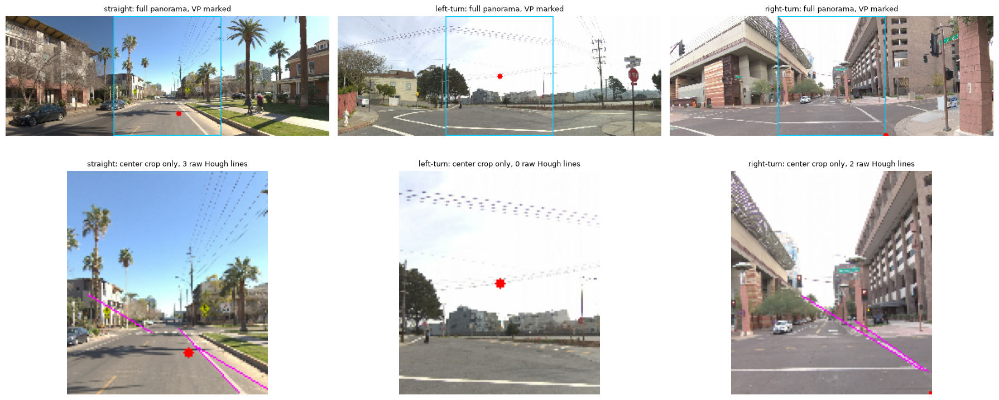


If the right-turn center-crop panel shows lines locking onto building edges / the
elevated structure rather than road lane markings, that -- not the corridor math -- is
the root cause of the off origin. A frame with too little visible road surface in the
128px center crop may just be a bad candidate for this feature regardless of tuning.


In [58]:
fig, axes = plt.subplots(2, len(CLASSES), figsize=(6 * len(CLASSES), 8))
for i, cls in enumerate(CLASSES):
    img = qa_examples[cls]
    H, W = img.shape[:2]
    center_crop = img[:, CENTER_SEG[0]:CENTER_SEG[1]]
    _, lines, _ = detect_edges_and_lines(center_crop)
    (vp_x_n, vp_y_n), n_lines, _ = estimate_vanishing_point(lines, center_crop.shape)
    vp_x_px = CENTER_SEG[0] + np.clip(vp_x_n, 0, 1) * (CENTER_SEG[1] - CENTER_SEG[0])
    vp_y_px = np.clip(vp_y_n, 0, 1) * H

    print(f'{cls:<12} n_lines={n_lines:<4} vp_local=({vp_x_n:+.3f},{vp_y_n:+.3f})  '
          f'vp_px=({vp_x_px:.1f},{vp_y_px:.1f})  [CENTER_SEG is x in {CENTER_SEG}]')

    # top row: full panorama, CENTER_SEG boundary + resulting VP marked
    ax = axes[0, i]
    overlay = img.copy()
    cv2.rectangle(overlay, (CENTER_SEG[0], 0), (CENTER_SEG[1] - 1, H - 1), (0, 200, 255), 1)
    cv2.circle(overlay, (int(vp_x_px), int(np.clip(vp_y_px, 0, H - 1))), 3, (255, 0, 0), -1)
    ax.imshow(overlay)
    ax.set_title(f'{cls}: full panorama, VP marked', fontsize=9)
    ax.axis('off')

    # bottom row: JUST the center crop, every raw Hough line drawn -- what the estimator saw
    ax2 = axes[1, i]
    crop_overlay = center_crop.copy()
    for x1, y1, x2, y2 in lines:
        cv2.line(crop_overlay, (int(x1), int(y1)), (int(x2), int(y2)), (255, 0, 255), 1)
    cv2.circle(crop_overlay, (int(np.clip(vp_x_n, 0, 1) * center_crop.shape[1]),
                               int(np.clip(vp_y_n, 0, 1) * H)), 3, (255, 0, 0), -1)
    ax2.imshow(crop_overlay)
    ax2.set_title(f'{cls}: center crop only, {n_lines} raw Hough lines', fontsize=9)
    ax2.axis('off')

plt.tight_layout()
plt.savefig('outputs/qa_corridor_vp_diagnostic.png', dpi=130, bbox_inches='tight')
plt.show()
print('\nIf the right-turn center-crop panel shows lines locking onto building edges / the')
print('elevated structure rather than road lane markings, that -- not the corridor math -- is')
print('the root cause of the off origin. A frame with too little visible road surface in the')
print('128px center crop may just be a bad candidate for this feature regardless of tuning.')

In [60]:
# --- Fixed-origin corridor construction (supersedes the VP-anchored version above) ---

EGO_ORIGIN_X = (CENTER_SEG[0] + CENTER_SEG[1]) / 2.0  # fixed: bottom-center of CENTER_SEG,
                                                        # same assumption ego_lane_offset() makes


def build_trajectory_corridor(direction, deg_range, ego_x, W, H,
                               near_row_frac=NEAR_ROW_FRAC, far_row_frac=FAR_ROW_FRAC_TURN,
                               near_half_width_frac=NEAR_HALF_WIDTH_FRAC):
    '''Same trapezoid construction as before, but both near AND far edges are now anchored
    to a fixed ego_x rather than a per-frame vanishing point. All three directions share
    the same far_row now too (there's no per-frame vp_y left to use for "straight").'''
    near_row = int(H * near_row_frac)
    far_row = max(0, min(int(H * far_row_frac), near_row - 1))
    ego_half_w = W * near_half_width_frac
    near_left_x, near_right_x = ego_x - ego_half_w, ego_x + ego_half_w

    min_deg, max_deg = deg_range
    if direction == 'straight':
        far_left_x = far_right_x = ego_x
    else:
        sign = -1 if direction == 'left' else 1
        far_a = bearing_to_x(sign * abs(min_deg), ego_x, W)
        far_b = bearing_to_x(sign * abs(max_deg), ego_x, W)
        far_left_x, far_right_x = sorted([far_a, far_b])

    return np.array([
        [near_left_x, near_row], [near_right_x, near_row],
        [far_right_x, far_row], [far_left_x, far_row],
    ], dtype=np.int32)


def build_all_corridors(img, deg_bounds):
    '''Builds all three corridors anchored at the fixed EGO_ORIGIN_X -- no Hough line
    detection or vanishing-point estimation runs here at all anymore.'''
    H, W = img.shape[:2]
    corridors = {
        'straight': build_trajectory_corridor('straight', deg_bounds['straight'], EGO_ORIGIN_X, W, H),
        'left': build_trajectory_corridor('left', deg_bounds['left-turn'], EGO_ORIGIN_X, W, H),
        'right': build_trajectory_corridor('right', deg_bounds['right-turn'], EGO_ORIGIN_X, W, H),
    }
    return corridors, (EGO_ORIGIN_X, int(H * NEAR_ROW_FRAC))


def build_corridor_blockage_features(img, yolo_results=None, deg_bounds=deg_bounds):
    if yolo_results is None:
        yolo_results = yolo_model(img, verbose=False)
    corridors, _ = build_all_corridors(img, deg_bounds)
    return path_blockage_features(img, yolo_results, corridors)

_, CORRIDOR_BLOCKAGE_DIMS = build_corridor_blockage_features(qa_examples['straight'])
print(f'Fixed-origin corridor prototype loaded: {len(CORRIDOR_BLOCKAGE_DIMS)} dims. '
      f'EGO_ORIGIN_X={EGO_ORIGIN_X} (fixed, no VP dependency).')

Fixed-origin corridor prototype loaded: 9 dims. EGO_ORIGIN_X=192.0 (fixed, no VP dependency).


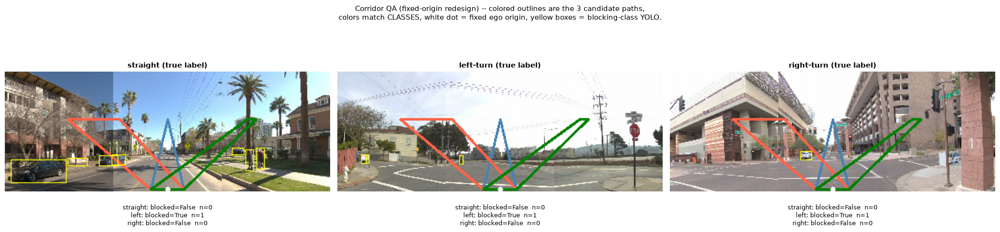

Should be immune to the right-turn-example VP problem now -- the origin is identical
(EGO_ORIGIN_X) across all three panels by construction. Check whether the corridor shapes
and blocked verdicts still look sane before extracting at scale.


In [61]:
# --- Visual QA (re-run): same panel as before, using the fixed-origin corridors ---
fig, axes = plt.subplots(1, len(CLASSES), figsize=(7 * len(CLASSES), 5))
for i, cls in enumerate(CLASSES):
    img = qa_examples[cls]
    H, W = img.shape[:2]
    yres = yolo_model(img, verbose=False)
    corridors, (origin_x, origin_y) = build_all_corridors(img, deg_bounds)
    feats, names = path_blockage_features(img, yres, corridors)
    by_name = dict(zip(names, feats))

    overlay = img.copy()
    for name, poly in corridors.items():
        cv2.polylines(overlay, [poly], isClosed=True, color=CORRIDOR_COLORS_RGB[name], thickness=2)
    cv2.circle(overlay, (int(origin_x), int(np.clip(origin_y, 0, H - 1))), 3, (255, 255, 255), -1)

    for box in yres[0].boxes:
        cls_id = int(box.cls)
        if cls_id not in BLOCKING_CLASSES:
            continue
        x1, y1, x2, y2 = [int(v) for v in box.xyxy[0].tolist()]
        cv2.rectangle(overlay, (x1, y1), (x2, y2), (255, 255, 0), 1)

    ax = axes[i]
    ax.imshow(overlay)
    ax.set_title(f'{cls} (true label)', fontsize=11, fontweight='bold')
    ax.axis('off')
    lines_txt = [f"{name}: blocked={bool(by_name[f'{name}_blocked'])}  "
                 f"n={by_name[f'{name}_n_blocking']:.0f}" for name in ['straight', 'left', 'right']]
    ax.text(0.5, -0.10, '\n'.join(lines_txt), transform=ax.transAxes, ha='center', va='top', fontsize=9)

plt.suptitle('Corridor QA (fixed-origin redesign) -- colored outlines are the 3 candidate paths,\n'
             'colors match CLASSES, white dot = fixed ego origin, yellow boxes = blocking-class YOLO.',
             fontsize=11)
plt.tight_layout()
plt.savefig('outputs/qa_corridor_blockage_fixed_origin.png', dpi=130, bbox_inches='tight')
plt.show()
print('Should be immune to the right-turn-example VP problem now -- the origin is identical')
print('(EGO_ORIGIN_X) across all three panels by construction. Check whether the corridor shapes')
print('and blocked verdicts still look sane before extracting at scale.')

In [69]:
def corridor_sub_polygon(poly, t_start, t_end):
    '''Given a corridor's 4-point trapezoid (near_left, near_right, far_right, far_left),
    returns the sub-trapezoid between interpolation fractions t_start and t_end along the
    near->far axis (t=0 is the near/ego edge, t=1 is the far edge).'''
    near_left, near_right, far_right, far_left = poly.astype(float)
    def interp_edge(p_near, p_far, t):
        return p_near + t * (p_far - p_near)
    a_left, a_right = interp_edge(near_left, far_left, t_start), interp_edge(near_right, far_right, t_start)
    b_left, b_right = interp_edge(near_left, far_left, t_end), interp_edge(near_right, far_right, t_end)
    return np.array([a_left, a_right, b_right, b_left], dtype=np.int32)


NONROAD_THRESH = 0.3  # fraction of a corridor sub-region that must fall outside the road
                        # mask to call it "curb_blocked" -- a constant, not derived from data


def path_curb_features(img, corridors, road_mask=None, t_ranges=None, nonroad_thresh=NONROAD_THRESH):
    '''For a configurable sub-region of each corridor, checks what fraction of that region
    falls OUTSIDE segment_road()'s flood-fill road mask. Defaults to the FULL corridor
    (t=0 to 1) per the diagnostic above -- pass t_ranges to restrict any direction to a
    narrower near/far window.'''
    H, W = img.shape[:2]
    if road_mask is None:
        road_mask, _ = segment_road(img)
    road_bool = road_mask > 0
    if t_ranges is None:
        t_ranges = {name: (0.0, 1.0) for name in corridors}

    feats, names = [], []
    for name, poly in corridors.items():
        t0, t1 = t_ranges.get(name, (0.0, 1.0))
        sub_poly = corridor_sub_polygon(poly, t0, t1)
        m = np.zeros((H, W), dtype=np.uint8)
        cv2.fillPoly(m, [sub_poly], 1)
        m = m.astype(bool)
        total = int(m.sum())
        nonroad_frac = float(1.0 - (m & road_bool).sum() / total) if total > 0 else 0.0
        feats.extend([nonroad_frac, float(nonroad_frac > nonroad_thresh)])
        names.extend([f'{name}_nonroad_frac', f'{name}_curb_blocked'])
    return np.array(feats, dtype=np.float32), names

def build_corridor_curb_features(img, deg_bounds=deg_bounds, road_mask=None):
    '''Defaults to segment_road_center() (CENTER_SEG only), not segment_road_panorama().
    The panorama-wide version was tried and reverted -- see its docstring above -- because
    its per-segment seed-color assumption fails on the side cameras in a way that produces
    confidently WRONG road masks, which is worse for this feature than the honest coverage
    gap of just not checking LEFT_SEG/RIGHT_SEG at all. Net effect: nonroad_frac/curb_blocked
    is only really trustworthy for the straight corridor and the portion of any turn corridor
    that stays inside CENTER_SEG -- treat anything a turn corridor claims once it swings past
    x=128 or x=256 with real skepticism regardless of which version of the mask is used.'''
    corridors, _ = build_all_corridors(img, deg_bounds)
    if road_mask is None:
        road_mask, _ = segment_road_center(img)
    return path_curb_features(img, corridors, road_mask=road_mask)

_, CORRIDOR_CURB_DIMS = build_corridor_curb_features(qa_examples['straight'])
print(f'Corridor curb/non-road prototype loaded: {len(CORRIDOR_CURB_DIMS)} dims '
      f'(3 corridors x [nonroad_frac, curb_blocked]). Using segment_road_center() -- reverted '
      f'from the panorama-wide version, see docstrings for why.')

Corridor curb/non-road prototype loaded: 6 dims (3 corridors x [nonroad_frac, curb_blocked]). Using segment_road_center() -- reverted from the panorama-wide version, see docstrings for why.


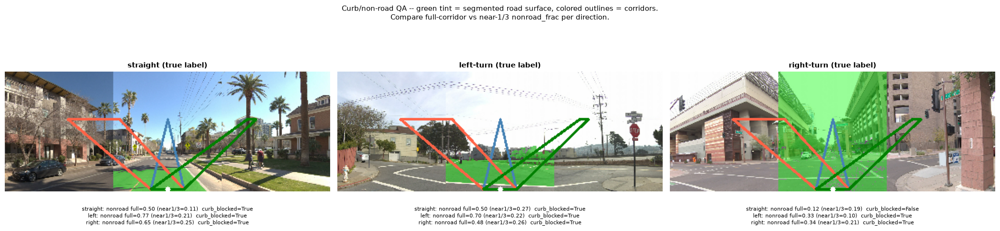

Review: does the green tint actually cover the drivable road in each frame (same caveat as
every other segment_road()-based feature in this notebook -- it can under/over-segment)? Does
curb_blocked=True line up with a real curb/median visible in the frame?


In [70]:
# --- Visual QA: road mask (green tint) + corridor outlines, both near-1/3 and full nonroad_frac ---
fig, axes = plt.subplots(1, len(CLASSES), figsize=(7 * len(CLASSES), 5))
for i, cls in enumerate(CLASSES):
    img = qa_examples[cls]
    H, W = img.shape[:2]
    road_mask, _ = segment_road_center(img)
    corridors, (origin_x, origin_y) = build_all_corridors(img, deg_bounds)

    full_feats, full_names = path_curb_features(img, corridors, road_mask=road_mask)
    near_feats, near_names = path_curb_features(
        img, corridors, road_mask=road_mask,
        t_ranges={name: (0.0, 1/3) for name in corridors})
    full_by_name = dict(zip(full_names, full_feats))
    near_by_name = dict(zip(near_names, near_feats))

    overlay = img.copy()
    overlay[road_mask > 0] = (overlay[road_mask > 0] * 0.6 + np.array([0, 255, 0]) * 0.4).astype(np.uint8)
    for name, poly in corridors.items():
        cv2.polylines(overlay, [poly], isClosed=True, color=CORRIDOR_COLORS_RGB[name], thickness=2)
    cv2.circle(overlay, (int(origin_x), int(np.clip(origin_y, 0, H - 1))), 3, (255, 255, 255), -1)

    ax = axes[i]
    ax.imshow(overlay)
    ax.set_title(f'{cls} (true label)', fontsize=11, fontweight='bold')
    ax.axis('off')
    lines_txt = [f"{name}: nonroad full={full_by_name[f'{name}_nonroad_frac']:.2f} "
                 f"(near1/3={near_by_name[f'{name}_nonroad_frac']:.2f})  "
                 f"curb_blocked={bool(full_by_name[f'{name}_curb_blocked'])}"
                 for name in ['straight', 'left', 'right']]
    ax.text(0.5, -0.12, '\n'.join(lines_txt), transform=ax.transAxes, ha='center', va='top', fontsize=8)

plt.suptitle('Curb/non-road QA -- green tint = segmented road surface, colored outlines = corridors.\n'
             'Compare full-corridor vs near-1/3 nonroad_frac per direction.',
             fontsize=11)
plt.tight_layout()
plt.savefig('outputs/qa_corridor_curb.png', dpi=130, bbox_inches='tight')
plt.show()
print('Review: does the green tint actually cover the drivable road in each frame (same caveat as')
print('every other segment_road()-based feature in this notebook -- it can under/over-segment)? Does')
print('curb_blocked=True line up with a real curb/median visible in the frame?')

In [71]:
def build_corridor_combined_features(img, deg_bounds=deg_bounds, yolo_results=None, road_mask=None):
    '''Blockage (9 dims) + curb/non-road (6 dims) = 15 dims, sharing one build_all_corridors()
    call and one YOLO call instead of rebuilding corridors / re-running YOLO per feature group.'''
    if yolo_results is None:
        yolo_results = yolo_model(img, verbose=False)
    corridors, _ = build_all_corridors(img, deg_bounds)
    if road_mask is None:
        road_mask, _ = segment_road_center(img)
    block_feats, block_names = path_blockage_features(img, yolo_results, corridors)
    curb_feats, curb_names = path_curb_features(img, corridors, road_mask=road_mask)
    return np.concatenate([block_feats, curb_feats]), block_names + curb_names

RECOMPUTE_CORRIDOR_FEATURES = True  # set False to load cached arrays instead

corridor_path = os.path.join(FEATURES_DIR, 'corridor_combined_3class.npy')
corridor_names_path = os.path.join(FEATURES_DIR, 'corridor_combined_feature_names.json')

if RECOMPUTE_CORRIDOR_FEATURES:
    t0 = time.time()
    corridor_list = []
    for i, sid in enumerate(seq_ids_3c):
        if (i + 1) % 200 == 0:
            elapsed = time.time() - t0
            print(f'  {i+1}/{len(seq_ids_3c)} ({elapsed:.0f}s, '
                  f'{elapsed/(i+1)*(len(seq_ids_3c)-(i+1)):.0f}s remaining)')
        entry = manifest[sid]
        data = np.load(os.path.join(TRAIN_DIR, entry['target_fname']), allow_pickle=True)
        img = np.array(data['_modality_data'].item()[Modality.CAMERAS])
        feats, corridor_feature_names = build_corridor_combined_features(img)
        corridor_list.append(feats)

    corridor_3c = np.array(corridor_list, dtype=np.float32)
    np.save(corridor_path, corridor_3c)
    with open(corridor_names_path, 'w') as f:
        json.dump(corridor_feature_names, f)
    print(f'\nDone in {time.time()-t0:.0f}s. corridor_3c shape: {corridor_3c.shape}')
    print('Saved corridor_combined_3class.npy, corridor_combined_feature_names.json')
elif os.path.exists(corridor_path):
    corridor_3c = np.load(corridor_path)
    with open(corridor_names_path) as f:
        corridor_feature_names = json.load(f)
    print(f'Loaded cached corridor_combined_3class.npy: {corridor_3c.shape}')
else:
    corridor_3c = None
    print('RECOMPUTE_CORRIDOR_FEATURES=False and no cached file found -- corridor features will')
    print('be skipped in the benchmark below.')

assert corridor_3c is None or len(corridor_3c) == len(seq_ids_3c), \
    'corridor_3c row count does not match seq_ids_3c -- alignment broken.'

  200/1604 (14s, 97s remaining)
  400/1604 (25s, 76s remaining)
  600/1604 (37s, 62s remaining)
  800/1604 (50s, 50s remaining)
  1000/1604 (59s, 36s remaining)
  1200/1604 (69s, 23s remaining)
  1400/1604 (78s, 11s remaining)
  1600/1604 (87s, 0s remaining)

Done in 87s. corridor_3c shape: (1604, 15)
Saved corridor_combined_3class.npy, corridor_combined_feature_names.json


In [72]:
assert corridor_3c is not None, 'Run the extraction cell above first.'

# Whatever's won so far across Section 9 + Section 14f -- reruns of those same feature sets
# would just reproduce identical numbers (same features, same split, same random_state), so
# only the NEW candidates are tested here rather than re-benchmarking everything again.
best_overall_row = combined_bench_df.loc[combined_bench_df['accuracy'].idxmax()]
best_overall_name = best_overall_row['feature_set']
best_overall_acc = best_overall_row['accuracy']

feature_sets_clf_corridor = {'Corridor': corridor_3c}
base_feats = feature_sets_clf_v2.get(best_overall_name, feature_sets_clf.get(best_overall_name))
if base_feats is not None:
    feature_sets_clf_corridor[f'{best_overall_name}_Corridor'] = np.concatenate([base_feats, corridor_3c], axis=1)

print(f'Best so far (Section 9 + 14f combined): {best_overall_name} (acc={best_overall_acc:.3f})')
print(f'New candidates being tested: {list(feature_sets_clf_corridor.keys())}')

Best so far (Section 9 + 14f combined): HOG_SceneCueTrafficLaw (acc=0.611)
New candidates being tested: ['Corridor', 'HOG_SceneCueTrafficLaw_Corridor']


In [73]:
bench_rows_corridor = []
for name, feats in feature_sets_clf_corridor.items():
    X_train, X_test, y_train, y_test = train_test_split(
        feats, labels_3c, test_size=0.25, random_state=RANDOM_STATE, stratify=labels_3c)
    scaler = StandardScaler()
    X_train_s, X_test_s = scaler.fit_transform(X_train), scaler.transform(X_test)

    svm = SVC(kernel='rbf', class_weight='balanced', random_state=RANDOM_STATE)
    svm.fit(X_train_s, y_train)
    svm_pred = svm.predict(X_test_s)

    rf = RandomForestClassifier(n_estimators=300, class_weight='balanced',
                                 random_state=RANDOM_STATE, n_jobs=-1)
    rf.fit(X_train, y_train)
    rf_pred = rf.predict(X_test)

    for model_name, pred in [('SVM', svm_pred), ('RF', rf_pred)]:
        acc = accuracy_score(y_test, pred)
        macro_f1 = f1_score(y_test, pred, labels=CLASSES, average='macro', zero_division=0)
        bench_rows_corridor.append({'feature_set': name, 'model': model_name, 'accuracy': acc, 'macro_f1': macro_f1})

    print(f'{name:32s}  SVM acc={accuracy_score(y_test, svm_pred):.3f}  '
          f'RF acc={accuracy_score(y_test, rf_pred):.3f}')

bench_df_corridor = pd.DataFrame(bench_rows_corridor)
bench_df_corridor.to_csv(os.path.join(FEATURES_DIR, 'benchmark_3class_corridor.csv'), index=False)

combined_bench_df_v3 = pd.concat([combined_bench_df, bench_df_corridor], ignore_index=True).drop_duplicates(
    subset=['feature_set', 'model'], keep='last')
best_row_corridor = combined_bench_df_v3.loc[combined_bench_df_v3['accuracy'].idxmax()]
print(f'\nBest overall (Section 9 + 14f + Corridor): {best_row_corridor["feature_set"]} / '
      f'{best_row_corridor["model"]}  acc={best_row_corridor["accuracy"]:.3f}  '
      f'macro_f1={best_row_corridor["macro_f1"]:.3f}')
print(f'(prior best was {best_overall_name}, acc={best_overall_acc:.3f}, for comparison)')
print('Saved benchmark_3class_corridor.csv')

Corridor                          SVM acc=0.392  RF acc=0.424
HOG_SceneCueTrafficLaw_Corridor   SVM acc=0.601  RF acc=0.581

Best overall (Section 9 + 14f + Corridor): HOG_SceneCueTrafficLaw / RF  acc=0.611  macro_f1=0.532
(prior best was HOG_SceneCueTrafficLaw, acc=0.611, for comparison)
Saved benchmark_3class_corridor.csv


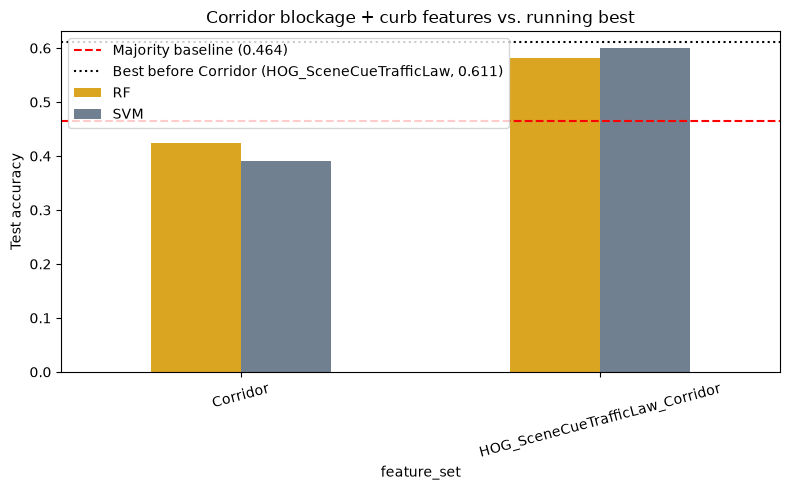

In [74]:
fig, ax = plt.subplots(figsize=(8, 5))
pivot_corridor = bench_df_corridor.pivot(index='feature_set', columns='model', values='accuracy')
pivot_corridor = pivot_corridor.reindex(feature_sets_clf_corridor.keys())
pivot_corridor.plot(kind='bar', ax=ax, color={'SVM': 'slategray', 'RF': 'goldenrod'})
ax.axhline(majority_baseline_3c, color='red', linestyle='--',
           label=f'Majority baseline ({majority_baseline_3c:.3f})')
ax.axhline(best_overall_acc, color='black', linestyle=':',
           label=f'Best before Corridor ({best_overall_name}, {best_overall_acc:.3f})')
ax.set_ylabel('Test accuracy')
ax.set_title('Corridor blockage + curb features vs. running best')
ax.tick_params(axis='x', rotation=15)
ax.legend()
plt.tight_layout()
plt.savefig('outputs/benchmark_3class_corridor.png', dpi=150)
plt.show()

In [75]:
assert corridor_3c is not None, 'Run the Section 14h extraction cell first.'
assert len(corridor_feature_names) == 15, f'expected 15 corridor feature names, got {len(corridor_feature_names)}'

BLOCKAGE_N_DIMS = 9  # 3 corridors x [blocked, n_blocking, nearest_blocking_h] -- see
                       # build_corridor_combined_features(): block_feats (9) then curb_feats (6)
blockage_names = corridor_feature_names[:BLOCKAGE_N_DIMS]
curb_names = corridor_feature_names[BLOCKAGE_N_DIMS:]
print('blockage dims (9):', blockage_names)
print('curb dims (6):', curb_names)

corridor_blockage_only = corridor_3c[:, :BLOCKAGE_N_DIMS]
corridor_curb_only = corridor_3c[:, BLOCKAGE_N_DIMS:]

feature_sets_clf_split = {
    'Corridor_BlockageOnly': corridor_blockage_only,
    'Corridor_CurbOnly': corridor_curb_only,
}
print(f'\nSplit corridor_3c {corridor_3c.shape} into blockage-only {corridor_blockage_only.shape} '
      f'and curb-only {corridor_curb_only.shape}.')

blockage dims (9): ['straight_blocked', 'straight_n_blocking', 'straight_nearest_blocking_h', 'left_blocked', 'left_n_blocking', 'left_nearest_blocking_h', 'right_blocked', 'right_n_blocking', 'right_nearest_blocking_h']
curb dims (6): ['straight_nonroad_frac', 'straight_curb_blocked', 'left_nonroad_frac', 'left_curb_blocked', 'right_nonroad_frac', 'right_curb_blocked']

Split corridor_3c (1604, 15) into blockage-only (1604, 9) and curb-only (1604, 6).


In [76]:
bench_rows_split = []
for name, feats in feature_sets_clf_split.items():
    X_train, X_test, y_train, y_test = train_test_split(
        feats, labels_3c, test_size=0.25, random_state=RANDOM_STATE, stratify=labels_3c)
    scaler = StandardScaler()
    X_train_s, X_test_s = scaler.fit_transform(X_train), scaler.transform(X_test)

    svm = SVC(kernel='rbf', class_weight='balanced', random_state=RANDOM_STATE)
    svm.fit(X_train_s, y_train)
    svm_pred = svm.predict(X_test_s)

    rf = RandomForestClassifier(n_estimators=300, class_weight='balanced',
                                 random_state=RANDOM_STATE, n_jobs=-1)
    rf.fit(X_train, y_train)
    rf_pred = rf.predict(X_test)

    for model_name, pred in [('SVM', svm_pred), ('RF', rf_pred)]:
        acc = accuracy_score(y_test, pred)
        macro_f1 = f1_score(y_test, pred, labels=CLASSES, average='macro', zero_division=0)
        bench_rows_split.append({'feature_set': name, 'model': model_name, 'accuracy': acc, 'macro_f1': macro_f1})

    print(f'{name:24s}  SVM acc={accuracy_score(y_test, svm_pred):.3f}  '
          f'RF acc={accuracy_score(y_test, rf_pred):.3f}')

bench_df_split = pd.DataFrame(bench_rows_split)
bench_df_split.to_csv(os.path.join(FEATURES_DIR, 'benchmark_3class_corridor_split.csv'), index=False)

print(f'\nFor reference:')
print(f'  majority baseline        acc={majority_baseline_3c:.3f}')
prior = bench_df_corridor[bench_df_corridor['feature_set'] == 'Corridor']
for _, row in prior.iterrows():
    print(f'  Corridor (combined) {row["model"]:<4s} acc={row["accuracy"]:.3f}  macro_f1={row["macro_f1"]:.3f}')
print('Saved benchmark_3class_corridor_split.csv')

Corridor_BlockageOnly     SVM acc=0.384  RF acc=0.382
Corridor_CurbOnly         SVM acc=0.394  RF acc=0.354

For reference:
  majority baseline        acc=0.464
  Corridor (combined) SVM  acc=0.392  macro_f1=0.382
  Corridor (combined) RF   acc=0.424  macro_f1=0.403
Saved benchmark_3class_corridor_split.csv


In [78]:
import os, warnings, time
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pandas as pd
from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix
from sklearn.decomposition import PCA

# ── attempt to load YOLOP via onnxruntime ────────────────────────────────────
# YOLOP is a BDD100K-pretrained model with a drivable-area segmentation head.
# Weights (~30 MB): https://github.com/hustvl/YOLOP/releases → yolop-640-640.onnx
# Place the file in FEATURES_DIR or the project root before running.
# If unavailable, falls back to an OpenCV heuristic using segment_road().

try:
    import onnxruntime as ort
    _onnx_candidates = [
        os.path.join(FEATURES_DIR, 'yolop-640-640.onnx'),
        os.path.join(os.path.dirname(FEATURES_DIR), 'yolop-640-640.onnx'),
    ]
    YOLOP_ONNX_PATH = next((p for p in _onnx_candidates if os.path.exists(p)), None)
    if YOLOP_ONNX_PATH:
        yolop_session = ort.InferenceSession(
            YOLOP_ONNX_PATH, providers=['CPUExecutionProvider'])
        YOLOP_AVAILABLE = True
        print(f'YOLOP loaded: {YOLOP_ONNX_PATH}')
    else:
        YOLOP_AVAILABLE = False
        print('YOLOP weights not found — using OpenCV heuristic fallback.')
        print('Download yolop-640-640.onnx from https://github.com/hustvl/YOLOP/releases')
        print('and place it in FEATURES_DIR.')
except ImportError:
    YOLOP_AVAILABLE = False
    print('onnxruntime not installed — using OpenCV heuristic fallback.')
    print('To install: pip install onnxruntime')

DRIVABLE_FEATURE_NAMES = [
    'direct_area_frac',    # share of pixels classified as directly drivable
    'alt_area_frac',       # share of pixels classified as alternatively drivable
    'direct_alt_ratio',    # direct / (direct + alt); 1.0 = no alt lanes visible
    'direct_centroid_x',   # normalized x centroid of the direct mask (0=left, 1=right)
    'alt_left_frac',       # fraction of alt-drivable pixels in the LEFT half
    'alt_right_frac',      # fraction of alt-drivable pixels in the RIGHT half
    'alt_lr_balance',      # alt_left_frac - alt_right_frac (>0 = more alt lane on left)
    'direct_width_bottom', # width of direct mask at 90% image height (normalized)
    'direct_aspect',       # width/height of the direct mask bounding box
]

print(f'Backend: {"YOLOP (onnxruntime)" if YOLOP_AVAILABLE else "OpenCV heuristic"}')
print(f'Feature dims: {len(DRIVABLE_FEATURE_NAMES)}  →  {DRIVABLE_FEATURE_NAMES}')

YOLOP weights not found — using OpenCV heuristic fallback.
Download yolop-640-640.onnx from https://github.com/hustvl/YOLOP/releases
and place it in FEATURES_DIR.
Backend: OpenCV heuristic
Feature dims: 9  →  ['direct_area_frac', 'alt_area_frac', 'direct_alt_ratio', 'direct_centroid_x', 'alt_left_frac', 'alt_right_frac', 'alt_lr_balance', 'direct_width_bottom', 'direct_aspect']


In [79]:
_YOLOP_W, _YOLOP_H = 640, 640

def _preprocess_yolop(img_rgb):
    """Resize and normalize an RGB image to YOLOP's expected input format."""
    resized = cv2.resize(img_rgb, (_YOLOP_W, _YOLOP_H))
    inp = resized.astype(np.float32) / 255.0
    mean = np.array([0.485, 0.456, 0.406], dtype=np.float32)
    std  = np.array([0.229, 0.224, 0.225], dtype=np.float32)
    inp = (inp - mean) / std
    return inp.transpose(2, 0, 1)[None]   # (1, 3, H, W)


def _yolop_drivable_mask(img_rgb, session):
    """
    Run YOLOP and return a (H, W) uint8 mask:
      0 = background
      1 = directly drivable  (ego lane)
      2 = alternatively drivable  (adjacent lanes)
    Resized to match img_rgb dimensions.
    """
    inp = _preprocess_yolop(img_rgb)
    input_name = session.get_inputs()[0].name
    outputs = session.run(None, {input_name: inp})
    # YOLOP output order: [det_output, drive_area_seg, lane_line_seg]
    drive_seg = outputs[1]   # shape (1, 3, 640, 640) — class logits
    mask = np.argmax(drive_seg[0], axis=0).astype(np.uint8)
    H, W = img_rgb.shape[:2]
    return cv2.resize(mask, (W, H), interpolation=cv2.INTER_NEAREST)


def _heuristic_drivable_mask(img_rgb):
    """
    Fallback when YOLOP is unavailable.
    Uses the canonical segment_road() to approximate the directly-drivable region,
    and estimates alternatively-drivable pixels from the same road-colored area
    outside the flood-filled direct region.
    """
    road_mask, _ = segment_road(img_rgb)   # road_mask: 0 or 255
    H, W = img_rgb.shape[:2]
    out = np.zeros((H, W), dtype=np.uint8)
    out[road_mask > 0] = 1   # directly drivable

    # alternatively drivable: road-colored pixels in the lower half not already
    # captured by the flood fill
    road_y = int(H * 0.55)
    hsv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV)
    seed_color, _ = get_robust_seed_color(hsv, H, W)
    tol   = np.array([25, 70, 70])
    lower = np.clip(seed_color.astype(int) - tol, 0, 255).astype(np.uint8)
    upper = np.clip(seed_color.astype(int) + tol, 0, 255).astype(np.uint8)
    color_mask = cv2.inRange(hsv, lower, upper)
    color_mask[:road_y, :] = 0
    out[(color_mask > 0) & (road_mask == 0)] = 2   # alternatively drivable
    return out


def get_drivable_mask(img_rgb):
    """Dispatch to YOLOP or heuristic."""
    if YOLOP_AVAILABLE:
        return _yolop_drivable_mask(img_rgb, yolop_session)
    return _heuristic_drivable_mask(img_rgb)


def extract_drivable_features(img_rgb, center_seg=CENTER_SEG):
    """
    Extract 9 drivable-area features from the front-center camera crop.

    Parameters
    ----------
    img_rgb    : (H, W, 3) uint8 RGB — full panoramic frame
    center_seg : (col_start, col_end) — front-center crop, same as road_v2

    Returns
    -------
    features : np.ndarray (9,) float32
    mask     : np.ndarray (H, crop_W) uint8  — 0/1/2, for visualization
    """
    x0, x1 = center_seg
    crop = img_rgb[:, x0:x1, :]
    H, W = crop.shape[:2]
    mask = get_drivable_mask(crop)

    direct_px = int((mask == 1).sum())
    alt_px    = int((mask == 2).sum())
    total_px  = H * W

    direct_area_frac = direct_px / total_px
    alt_area_frac    = alt_px    / total_px
    denom = direct_area_frac + alt_area_frac
    direct_alt_ratio = (direct_area_frac / denom) if denom > 1e-6 else 1.0

    direct_ys, direct_xs = np.where(mask == 1)
    if len(direct_xs) >= 10:
        direct_centroid_x = float(direct_xs.mean()) / W
        bbox_w            = float(direct_xs.max() - direct_xs.min() + 1)
        bbox_h            = float(direct_ys.max() - direct_ys.min() + 1)
        direct_aspect     = bbox_w / max(bbox_h, 1.0)
    else:
        direct_centroid_x = 0.5   # degenerate fallback
        direct_aspect     = 1.0

    alt_ys, alt_xs = np.where(mask == 2)
    if len(alt_xs) >= 10:
        alt_left_frac  = float((alt_xs <  W / 2).sum()) / len(alt_xs)
        alt_right_frac = float((alt_xs >= W / 2).sum()) / len(alt_xs)
    else:
        alt_left_frac  = 0.5
        alt_right_frac = 0.5
    alt_lr_balance = alt_left_frac - alt_right_frac   # >0 → more alt lane on left

    bottom_row          = mask[int(H * 0.9), :]
    direct_width_bottom = float((bottom_row == 1).sum()) / W

    features = np.array([
        direct_area_frac,
        alt_area_frac,
        direct_alt_ratio,
        direct_centroid_x,
        alt_left_frac,
        alt_right_frac,
        alt_lr_balance,
        direct_width_bottom,
        direct_aspect,
    ], dtype=np.float32)

    return features, mask


print('Drivable area extraction functions defined.')

Drivable area extraction functions defined.


In [80]:
DRIVABLE_PATH        = os.path.join(FEATURES_DIR, 'drivable_3class.npy')
DRIVABLE_SEQIDS_PATH = os.path.join(FEATURES_DIR, 'drivable_3class_seq_ids.npy')
RECOMPUTE_DRIVABLE   = not os.path.exists(DRIVABLE_PATH)   # set True to force recompute

if RECOMPUTE_DRIVABLE:
    print(f'Extracting drivable area features for {len(seq_ids_3c)} sequences ...')
    print(f'Backend: {"YOLOP" if YOLOP_AVAILABLE else "OpenCV heuristic"}')
    t0 = time.time()
    drivable_list = []
    for i, sid in enumerate(seq_ids_3c):
        target_fname = manifest[sid]['context_fnames'][-1]   # last frame = closest to maneuver
        img = load_frame(target_fname)
        feat, _ = extract_drivable_features(img, center_seg=CENTER_SEG)
        drivable_list.append(feat)
        if (i + 1) % 200 == 0:
            elapsed = time.time() - t0
            eta = elapsed / (i + 1) * (len(seq_ids_3c) - (i + 1))
            print(f'  {i+1}/{len(seq_ids_3c)}  ({elapsed:.0f}s elapsed, ~{eta:.0f}s remaining)')
    drivable_3c = np.array(drivable_list, dtype=np.float32)
    np.save(DRIVABLE_PATH,        drivable_3c)
    np.save(DRIVABLE_SEQIDS_PATH, seq_ids_3c)
    print(f'Done in {time.time()-t0:.0f}s.  Shape: {drivable_3c.shape}')
    print(f'Saved {DRIVABLE_PATH}')
else:
    drivable_3c = np.load(DRIVABLE_PATH)
    _saved_ids  = np.load(DRIVABLE_SEQIDS_PATH, allow_pickle=True).astype(str)
    assert np.array_equal(_saved_ids, seq_ids_3c), (
        'drivable_3class_seq_ids.npy does not match current seq_ids_3c — '
        'set RECOMPUTE_DRIVABLE=True to regenerate.')
    print(f'Loaded cached drivable_3class.npy: {drivable_3c.shape}')

print(f'\ndrivable_3c  shape={drivable_3c.shape}   dtype={drivable_3c.dtype}')

Extracting drivable area features for 1604 sequences ...
Backend: OpenCV heuristic
  200/1604  (1s elapsed, ~4s remaining)
  400/1604  (1s elapsed, ~3s remaining)
  600/1604  (1s elapsed, ~2s remaining)
  800/1604  (2s elapsed, ~2s remaining)
  1000/1604  (2s elapsed, ~1s remaining)
  1200/1604  (3s elapsed, ~1s remaining)
  1400/1604  (3s elapsed, ~0s remaining)
  1600/1604  (3s elapsed, ~0s remaining)
Done in 3s.  Shape: (1604, 9)
Saved ../data/processed/waymo_e2e/features/drivable_3class.npy

drivable_3c  shape=(1604, 9)   dtype=float32


In [82]:
print('=== Drivable Area — Structural QA ===\n')
qa_driv = []

expected_shape = (len(seq_ids_3c), len(DRIVABLE_FEATURE_NAMES))
qa_driv.append(('shape correct',
                 drivable_3c.shape == expected_shape,
                 f'{drivable_3c.shape} vs expected {expected_shape}'))

n_bad = int(np.sum(~np.isfinite(drivable_3c)))
qa_driv.append(('no NaN/Inf', n_bad == 0, f'{n_bad} bad values'))

for fi, fname in enumerate(DRIVABLE_FEATURE_NAMES):
    col = drivable_3c[:, fi]
    _range_bounds = {
    'direct_area_frac':    (-0.01, 1.01),
    'alt_area_frac':       (-0.01, 1.01),
    'direct_alt_ratio':    (-0.01, 1.01),
    'direct_centroid_x':   (-0.01, 1.01),
    'alt_left_frac':       (-0.01, 1.01),
    'alt_right_frac':      (-0.01, 1.01),
    'alt_lr_balance':      (-1.01, 1.01),
    'direct_width_bottom': (-0.01, 1.01),
    'direct_aspect':       ( 0.0,  20.0),   # width/height ratio, no hard upper bound
    }
    lo, hi = _range_bounds[fname]
    ok = bool(col.min() >= lo and col.max() <= hi)
    qa_driv.append((f'{fname} range OK', ok, f'min={col.min():.3f}  max={col.max():.3f}'))

_cx    = drivable_3c[:, DRIVABLE_FEATURE_NAMES.index('direct_centroid_x')]
_area  = drivable_3c[:, DRIVABLE_FEATURE_NAMES.index('direct_area_frac')]
_degen = (_cx == 0.5) & (_area < 0.001)
_degen_rate = _degen.mean()
qa_driv.append(('degenerate fallback rate < 10%', _degen_rate < 0.10,
                 f'{_degen_rate:.1%} of sequences hit degenerate fallback'))

qa_driv_df = pd.DataFrame(qa_driv, columns=['check', 'pass', 'detail'])
print(qa_driv_df.to_string(index=False))
if not qa_driv_df['pass'].all():
    warnings.warn('One or more drivable QA checks FAILED — see above.')
else:
    print('\nAll structural QA checks passed.')

=== Drivable Area — Structural QA ===

                         check  pass                                    detail
                 shape correct  True           (1604, 9) vs expected (1604, 9)
                    no NaN/Inf  True                              0 bad values
     direct_area_frac range OK  True                      min=0.000  max=1.000
        alt_area_frac range OK  True                      min=0.000  max=0.365
     direct_alt_ratio range OK  True                      min=0.000  max=1.000
    direct_centroid_x range OK  True                      min=0.187  max=0.808
        alt_left_frac range OK  True                      min=0.086  max=0.960
       alt_right_frac range OK  True                      min=0.040  max=0.914
       alt_lr_balance range OK  True                     min=-0.827  max=0.921
  direct_width_bottom range OK  True                      min=0.000  max=1.000
        direct_aspect range OK  True                      min=0.812  max=8.857
degenerate fa

In [83]:
print('=== Drivable Area — Semantic / Directional Checks ===\n')

def _dir_check(label, col, labels=labels_3c, classes=CLASSES):
    means = {c: col[labels == c].mean() for c in classes}
    stds  = {c: col[labels == c].std()  for c in classes}
    F, p  = stats.f_oneway(*[col[labels == c] for c in classes])
    print(f'  {label}')
    for c in classes:
        print(f'    {c:12s}  mean={means[c]:.4f}  std={stds[c]:.4f}')
    sig = '** significant **' if p < 0.05 else '(not significant)'
    print(f'    ANOVA: F={F:.2f}  p={p:.4f}  {sig}\n')
    return means, p

print('direct_centroid_x  (expect asymmetry between left-turn and right-turn):')
_dir_check('direct_centroid_x',
           drivable_3c[:, DRIVABLE_FEATURE_NAMES.index('direct_centroid_x')])

print('alt_lr_balance  (expect: right-turn > 0 > left-turn):')
print('  cross-street appears as alt-drivable on the OPPOSITE side from the intended turn')
_dir_check('alt_lr_balance',
           drivable_3c[:, DRIVABLE_FEATURE_NAMES.index('alt_lr_balance')])

print('direct_area_frac  (expect: straight > turns):')
_dir_check('direct_area_frac',
           drivable_3c[:, DRIVABLE_FEATURE_NAMES.index('direct_area_frac')])

print('alt_area_frac  (expect: turns > straight):')
_dir_check('alt_area_frac',
           drivable_3c[:, DRIVABLE_FEATURE_NAMES.index('alt_area_frac')])

print('direct_alt_ratio  (expect: straight > turns):')
_dir_check('direct_alt_ratio',
           drivable_3c[:, DRIVABLE_FEATURE_NAMES.index('direct_alt_ratio')])

=== Drivable Area — Semantic / Directional Checks ===

direct_centroid_x  (expect asymmetry between left-turn and right-turn):
  direct_centroid_x
    straight      mean=0.4937  std=0.0634
    left-turn     mean=0.5014  std=0.0579
    right-turn    mean=0.4936  std=0.0539
    ANOVA: F=2.50  p=0.0821  (not significant)

alt_lr_balance  (expect: right-turn > 0 > left-turn):
  cross-street appears as alt-drivable on the OPPOSITE side from the intended turn
  alt_lr_balance
    straight      mean=-0.0181  std=0.3173
    left-turn     mean=0.0140  std=0.2856
    right-turn    mean=-0.0259  std=0.2964
    ANOVA: F=2.07  p=0.1271  (not significant)

direct_area_frac  (expect: straight > turns):
  direct_area_frac
    straight      mean=0.2862  std=0.2369
    left-turn     mean=0.2498  std=0.1871
    right-turn    mean=0.2651  std=0.1974
    ANOVA: F=3.96  p=0.0193  ** significant **

alt_area_frac  (expect: turns > straight):
  alt_area_frac
    straight      mean=0.0671  std=0.0494
    left-

({'straight': 0.7525561, 'left-turn': 0.7338418, 'right-turn': 0.7524593},
 0.34864689481277283)

In [84]:
print('=== Per-class degenerate mask rate ===\n')

_degen_mask = (
    (drivable_3c[:, DRIVABLE_FEATURE_NAMES.index('direct_centroid_x')] == 0.5) &
    (drivable_3c[:, DRIVABLE_FEATURE_NAMES.index('direct_area_frac')]  < 0.001)
)
fallback_driv_df = pd.DataFrame({
    'class':            CLASSES,
    'n':                [int((labels_3c == c).sum())            for c in CLASSES],
    'degen_rate':       [_degen_mask[labels_3c == c].mean()     for c in CLASSES],
    'mean_direct_area': [drivable_3c[labels_3c == c, 0].mean() for c in CLASSES],
    'mean_alt_area':    [drivable_3c[labels_3c == c, 1].mean() for c in CLASSES],
    'mean_direct_cx':   [drivable_3c[labels_3c == c, 3].mean() for c in CLASSES],
    'mean_alt_balance': [drivable_3c[labels_3c == c, 6].mean() for c in CLASSES],
})
print(fallback_driv_df.round(3).to_string(index=False))
print('\nIf degen_rate is substantially higher for one class, the classifier may be')
print('picking up imagery quality rather than actual road geometry.')
fallback_driv_df.to_csv(
    os.path.join(FEATURES_DIR, 'qa_drivable_fallback_3class.csv'), index=False)
print('Saved qa_drivable_fallback_3class.csv')

=== Per-class degenerate mask rate ===

     class   n  degen_rate  mean_direct_area  mean_alt_area  mean_direct_cx  mean_alt_balance
  straight 745       0.028             0.286          0.067           0.494            -0.018
 left-turn 392       0.028             0.250          0.070           0.501             0.014
right-turn 467       0.030             0.265          0.068           0.494            -0.026

If degen_rate is substantially higher for one class, the classifier may be
picking up imagery quality rather than actual road geometry.
Saved qa_drivable_fallback_3class.csv


=== Upper-bound degenerate check (direct_area_frac > 0.85) ===

Sequences with direct_area_frac > 0.85: 116 / 1604 (7.2%)

     class   n  n_flooded  flood_rate  mean_area_if_flooded
  straight 745         69       0.093                 0.961
 left-turn 392         20       0.051                 0.961
right-turn 467         27       0.058                 0.955


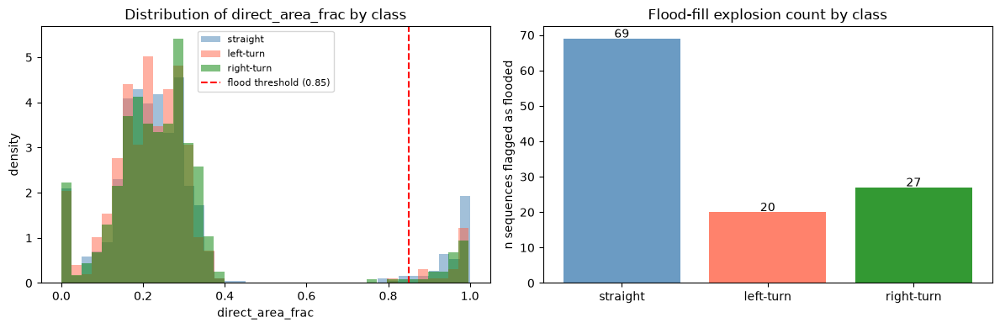

Saved outputs/drivable_flood_audit_3class.png

Flooded seq_ids saved to variable flooded_seq_ids (116 entries).
If flood_rate is substantially higher for one class, consider either:
  (a) clipping direct_area_frac at 0.85 before using it as a feature, or
  (b) excluding flooded sequences from the benchmark entirely.


In [90]:
# ── Cell 14.5b — Upper-bound degenerate audit (flood-fill explosion) ─────────
print('=== Upper-bound degenerate check (direct_area_frac > 0.85) ===\n')

_area_col = drivable_3c[:, DRIVABLE_FEATURE_NAMES.index('direct_area_frac')]
_flooded  = _area_col > 0.85

print(f'Sequences with direct_area_frac > 0.85: {_flooded.sum()} / {len(_flooded)} '
      f'({_flooded.mean():.1%})\n')

flooded_by_class = pd.DataFrame({
    'class':       CLASSES,
    'n':           [int((labels_3c == c).sum())          for c in CLASSES],
    'n_flooded':   [int(_flooded[labels_3c == c].sum())  for c in CLASSES],
    'flood_rate':  [_flooded[labels_3c == c].mean()      for c in CLASSES],
    'mean_area_if_flooded': [
        _area_col[_flooded & (labels_3c == c)].mean() if (_flooded & (labels_3c == c)).any()
        else float('nan')
        for c in CLASSES
    ],
})
print(flooded_by_class.round(3).to_string(index=False))

# distribution of direct_area_frac to see the shape of the problem
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

ax = axes[0]
for cls in CLASSES:
    ax.hist(_area_col[labels_3c == cls], bins=40, alpha=0.5,
            color=COLORS[cls], label=cls, density=True)
ax.axvline(0.85, color='red', linestyle='--', label='flood threshold (0.85)')
ax.set_xlabel('direct_area_frac')
ax.set_ylabel('density')
ax.set_title('Distribution of direct_area_frac by class')
ax.legend(fontsize=8)

ax2 = axes[1]
flood_counts = [int(_flooded[labels_3c == c].sum()) for c in CLASSES]
ax2.bar(CLASSES, flood_counts, color=[COLORS[c] for c in CLASSES], alpha=0.8)
ax2.set_ylabel('n sequences flagged as flooded')
ax2.set_title('Flood-fill explosion count by class')
for i, v in enumerate(flood_counts):
    ax2.text(i, v + 0.3, str(v), ha='center', fontsize=10)

plt.tight_layout()
plt.savefig('outputs/drivable_flood_audit_3class.png', dpi=140)
plt.show()
print('Saved outputs/drivable_flood_audit_3class.png')

# flag for reference downstream
flooded_seq_ids = seq_ids_3c[_flooded]
print(f'\nFlooded seq_ids saved to variable flooded_seq_ids ({len(flooded_seq_ids)} entries).')
print('If flood_rate is substantially higher for one class, consider either:')
print('  (a) clipping direct_area_frac at 0.85 before using it as a feature, or')
print('  (b) excluding flooded sequences from the benchmark entirely.')

Generating visual QA panel ...


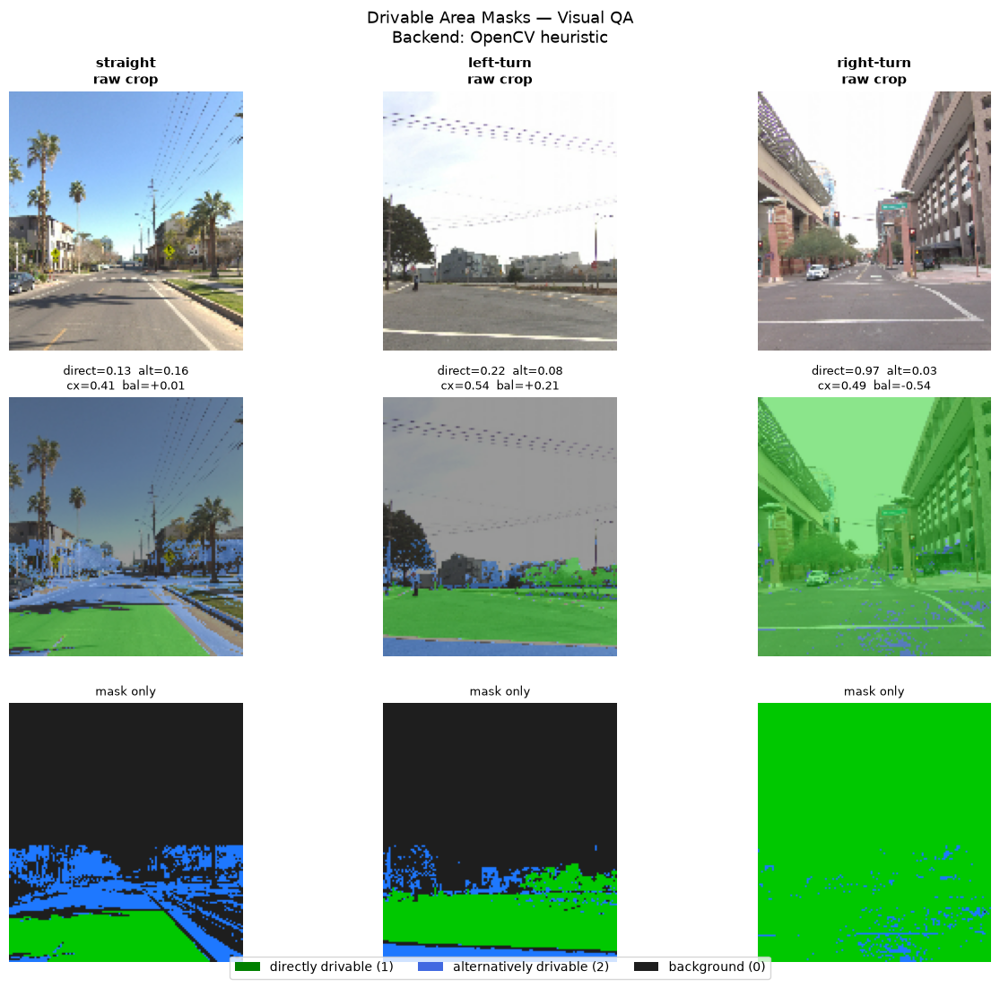

Saved outputs/qa_drivable_visual_panel_3class.png


In [85]:
print('Generating visual QA panel ...')

_MASK_COLORS = {
    0: np.array([30,  30,  30], dtype=np.uint8),
    1: np.array([0,  200,   0], dtype=np.uint8),
    2: np.array([30, 120, 255], dtype=np.uint8),
}

def _colorize(mask):
    rgb = np.zeros((*mask.shape, 3), dtype=np.uint8)
    for v, c in _MASK_COLORS.items():
        rgb[mask == v] = c
    return rgb

fig, axes = plt.subplots(3, len(CLASSES), figsize=(4.5 * len(CLASSES), 11))
for i, cls in enumerate(CLASSES):
    img  = qa_examples[cls]
    x0, x1 = CENTER_SEG
    crop = img[:, x0:x1, :]
    feat, mask = extract_drivable_features(img, center_seg=CENTER_SEG)

    axes[0, i].imshow(crop)
    axes[0, i].set_title(f'{cls}\nraw crop', fontsize=11, fontweight='bold')
    axes[0, i].axis('off')

    blended = (0.45 * _colorize(mask) + 0.55 * crop).astype(np.uint8)
    axes[1, i].imshow(blended)
    axes[1, i].set_title(
        f'direct={feat[0]:.2f}  alt={feat[1]:.2f}\n'
        f'cx={feat[3]:.2f}  bal={feat[6]:+.2f}', fontsize=9)
    axes[1, i].axis('off')

    axes[2, i].imshow(_colorize(mask))
    axes[2, i].set_title('mask only', fontsize=9)
    axes[2, i].axis('off')

legend_elems = [
    mpatches.Patch(facecolor='green',      label='directly drivable (1)'),
    mpatches.Patch(facecolor='royalblue',  label='alternatively drivable (2)'),
    mpatches.Patch(facecolor='#1e1e1e',    label='background (0)'),
]
fig.legend(handles=legend_elems, loc='lower center', ncol=3,
           fontsize=10, bbox_to_anchor=(0.5, -0.01))
plt.suptitle(
    f'Drivable Area Masks — Visual QA\n'
    f'Backend: {"YOLOP" if YOLOP_AVAILABLE else "OpenCV heuristic"}',
    fontsize=13)
plt.tight_layout()
plt.savefig('outputs/qa_drivable_visual_panel_3class.png', dpi=140, bbox_inches='tight')
plt.show()
print('Saved outputs/qa_drivable_visual_panel_3class.png')

In [91]:
# clip flood-fill explosions before benchmarking
drivable_3c_clipped = drivable_3c.copy()
_area_idx = DRIVABLE_FEATURE_NAMES.index('direct_area_frac')
_ratio_idx = DRIVABLE_FEATURE_NAMES.index('direct_alt_ratio')
drivable_3c_clipped[:, _area_idx] = np.clip(drivable_3c[:, _area_idx], 0, 0.85)
# recompute direct_alt_ratio consistently with the clipped area
_alt_idx = DRIVABLE_FEATURE_NAMES.index('alt_area_frac')
_denom = drivable_3c_clipped[:, _area_idx] + drivable_3c_clipped[:, _alt_idx]
drivable_3c_clipped[:, _ratio_idx] = np.where(
    _denom > 1e-6, drivable_3c_clipped[:, _area_idx] / _denom, 1.0)
print(f'Clipped direct_area_frac at 0.85. '
      f'New mean by class:')
for c in CLASSES:
    print(f'  {c:12s}  {drivable_3c_clipped[labels_3c == c, _area_idx].mean():.4f}')

Clipped direct_area_frac at 0.85. New mean by class:
  straight      0.2759
  left-turn     0.2442
  right-turn    0.2590


In [93]:
print('=== Benchmark: drivable area features ===\n')
print(f'Majority-class baseline: {majority_baseline_3c:.3f}\n')

drivable_sets = {
    'Drivable':                drivable_3c_clipped,
    'Road_v2+Drivable':        np.concatenate([road_v2_3c,  drivable_3c_clipped], axis=1),
    'YOLO+Drivable':           np.concatenate([yolo_3c,     drivable_3c_clipped], axis=1),
    'Road_v2+YOLO+Drivable':   np.concatenate([road_v2_3c,  yolo_3c, drivable_3c_clipped], axis=1),
    'All_v2Road+Drivable':     np.concatenate([hog_3c, hsv_3c, yolo_3c,
                                               road_v2_3c, drivable_3c_clipped], axis=1),
}
if trend_3c is not None:
    drivable_sets['All+Drivable+Trend'] = np.concatenate(
        [hog_3c, hsv_3c, yolo_3c, road_v2_3c, drivable_3c_clipped, trend_3c], axis=1)

bench_driv_rows = []
preds_driv      = {}

for name, feats in drivable_sets.items():
    X_tr, X_te, y_tr, y_te = train_test_split(
        feats, labels_3c, test_size=0.25, random_state=RANDOM_STATE, stratify=labels_3c)
    sc = StandardScaler()
    X_tr_s, X_te_s = sc.fit_transform(X_tr), sc.transform(X_te)

    svm = SVC(kernel='rbf', class_weight='balanced', random_state=RANDOM_STATE)
    svm.fit(X_tr_s, y_tr); svm_pred = svm.predict(X_te_s)

    rf = RandomForestClassifier(n_estimators=300, class_weight='balanced',
                                 random_state=RANDOM_STATE, n_jobs=-1)
    rf.fit(X_tr, y_tr); rf_pred = rf.predict(X_te)

    for mname, pred in [('SVM', svm_pred), ('RF', rf_pred)]:
        acc = accuracy_score(y_te, pred)
        mf1 = f1_score(y_te, pred, labels=CLASSES, average='macro', zero_division=0)
        bench_driv_rows.append({'feature_set': name, 'model': mname,
                                  'accuracy': acc, 'macro_f1': mf1})
        preds_driv[(name, mname)] = (y_te, pred)

    _svm_f1 = f1_score(y_te, svm_pred, labels=CLASSES, average='macro', zero_division=0)
    _rf_f1  = f1_score(y_te, rf_pred,  labels=CLASSES, average='macro', zero_division=0)
    print(f'{name:35s}  '
          f'SVM acc={accuracy_score(y_te, svm_pred):.3f} f1={_svm_f1:.3f}  |  '
          f'RF  acc={accuracy_score(y_te, rf_pred):.3f} f1={_rf_f1:.3f}')

bench_driv_df = pd.DataFrame(bench_driv_rows)
bench_driv_df.to_csv(
    os.path.join(FEATURES_DIR, 'benchmark_drivable_3class.csv'), index=False)

best_driv = bench_driv_df.loc[bench_driv_df['macro_f1'].idxmax()]
print(f'\nBest (drivable sets): {best_driv["feature_set"]} / {best_driv["model"]}  '
      f'acc={best_driv["accuracy"]:.3f}  macro_f1={best_driv["macro_f1"]:.3f}')
print('Saved benchmark_drivable_3class.csv')

=== Benchmark: drivable area features ===

Majority-class baseline: 0.464

Drivable                             SVM acc=0.344 f1=0.343  |  RF  acc=0.384 f1=0.360
Road_v2+Drivable                     SVM acc=0.406 f1=0.392  |  RF  acc=0.444 f1=0.411
YOLO+Drivable                        SVM acc=0.436 f1=0.408  |  RF  acc=0.479 f1=0.434
Road_v2+YOLO+Drivable                SVM acc=0.469 f1=0.447  |  RF  acc=0.494 f1=0.449
All_v2Road+Drivable                  SVM acc=0.596 f1=0.543  |  RF  acc=0.601 f1=0.533
All+Drivable+Trend                   SVM acc=0.596 f1=0.543  |  RF  acc=0.601 f1=0.529

Best (drivable sets): All_v2Road+Drivable / SVM  acc=0.596  macro_f1=0.543
Saved benchmark_drivable_3class.csv


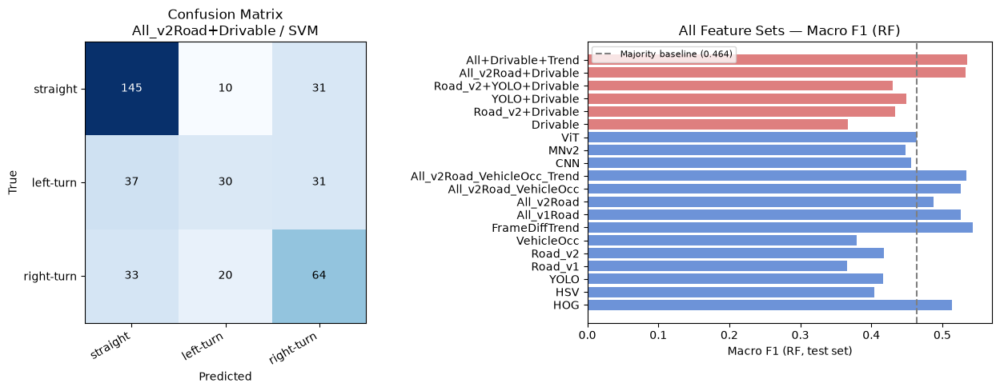

              precision    recall  f1-score   support

    straight       0.67      0.78      0.72       186
   left-turn       0.50      0.31      0.38        98
  right-turn       0.51      0.55      0.53       117

    accuracy                           0.60       401
   macro avg       0.56      0.54      0.54       401
weighted avg       0.58      0.60      0.58       401

Saved outputs/drivable_benchmark_summary_3class.png


In [88]:
_best_name  = best_driv['feature_set']
_best_model = best_driv['model']
y_te_b, y_pr_b = preds_driv[(_best_name, _best_model)]
cm = confusion_matrix(y_te_b, y_pr_b, labels=CLASSES)

fig, axes = plt.subplots(1, 2, figsize=(13, 5))

ax = axes[0]
ax.imshow(cm, cmap='Blues')
ax.set_xticks(range(len(CLASSES))); ax.set_xticklabels(CLASSES, rotation=30, ha='right')
ax.set_yticks(range(len(CLASSES))); ax.set_yticklabels(CLASSES)
ax.set_xlabel('Predicted'); ax.set_ylabel('True')
ax.set_title(f'Confusion Matrix\n{_best_name} / {_best_model}')
for i in range(len(CLASSES)):
    for j in range(len(CLASSES)):
        ax.text(j, i, cm[i, j], ha='center', va='center',
                 color='white' if cm[i, j] > cm.max() / 2 else 'black')

ax2 = axes[1]
_prior = bench_df[bench_df['model'] == 'RF'][['feature_set', 'macro_f1']].copy()
_new   = bench_driv_df[bench_driv_df['model'] == 'RF'][['feature_set', 'macro_f1']].copy()
_prior['group'] = 'Prior (Sec 9)'; _new['group'] = 'With Drivable'
_compare = pd.concat([_prior, _new], ignore_index=True)
_bar_colors = ['#4878CF'] * len(_prior) + ['#D65F5F'] * len(_new)
ax2.barh(_compare['feature_set'], _compare['macro_f1'], color=_bar_colors, alpha=0.8)
ax2.axvline(majority_baseline_3c, color='gray', linestyle='--',
             label=f'Majority baseline ({majority_baseline_3c:.3f})')
ax2.set_xlabel('Macro F1 (RF, test set)')
ax2.set_title('All Feature Sets — Macro F1 (RF)')
ax2.legend(fontsize=8)

plt.tight_layout()
plt.savefig('outputs/drivable_benchmark_summary_3class.png', dpi=140)
plt.show()

print(classification_report(y_te_b, y_pr_b, labels=CLASSES, zero_division=0))
print('Saved outputs/drivable_benchmark_summary_3class.png')

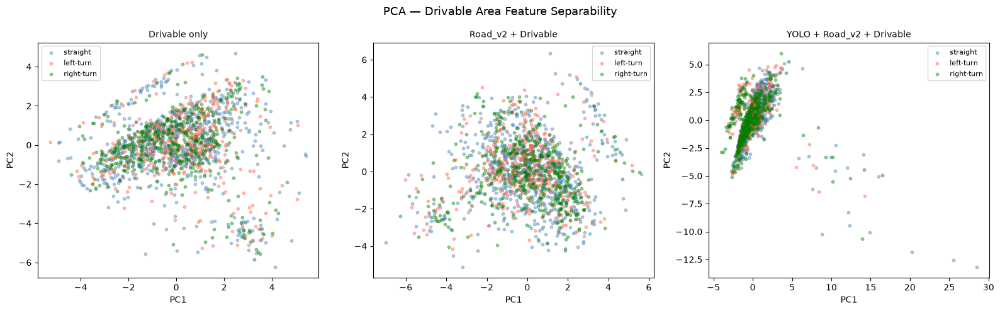

Saved outputs/pca_drivable_3class.png


In [89]:
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
_pca_sets = [
    ('Drivable only',             drivable_3c),
    ('Road_v2 + Drivable',        np.concatenate([road_v2_3c, drivable_3c], axis=1)),
    ('YOLO + Road_v2 + Drivable', np.concatenate([yolo_3c, road_v2_3c, drivable_3c], axis=1)),
]
for ax, (name, feats) in zip(axes, _pca_sets):
    proj = PCA(n_components=2, random_state=RANDOM_STATE).fit_transform(
        StandardScaler().fit_transform(feats))
    for cls in CLASSES:
        mask = labels_3c == cls
        ax.scatter(proj[mask, 0], proj[mask, 1],
                   c=COLORS[cls], label=cls, alpha=0.4, s=10)
    ax.set_title(name, fontsize=10)
    ax.set_xlabel('PC1'); ax.set_ylabel('PC2')
    ax.legend(fontsize=8)
plt.suptitle('PCA — Drivable Area Feature Separability', fontsize=13)
plt.tight_layout()
plt.savefig('outputs/pca_drivable_3class.png', dpi=140)
plt.show()
print('Saved outputs/pca_drivable_3class.png')

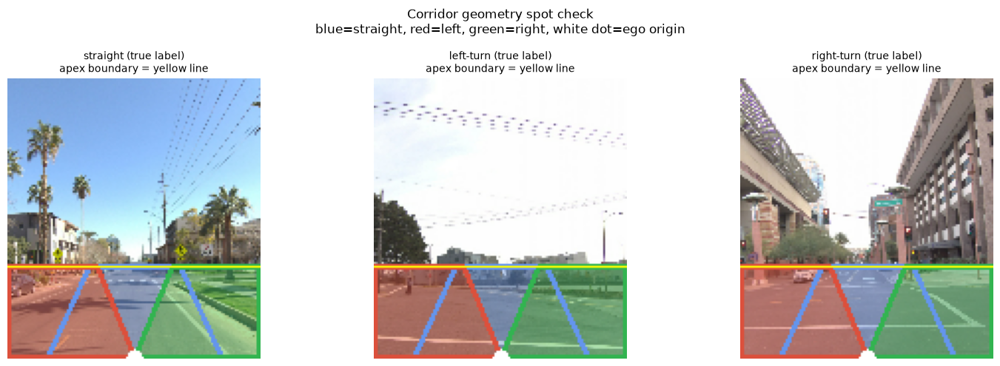

Saved outputs/corridor_geometry_spotcheck.png

Adjust make_corridors() fractions if the shapes feel wrong.
Key parameters:
  apex_row    = H * 0.67  (yellow line)
  straight width at bottom = W * 0.40,  at apex = W * 0.16
  left/right apex inset from edge = W * 0.15


In [95]:
# ── Corridor geometry spot check ─────────────────────────────────────────────
# Draws the three candidate corridors on qa_examples for visual inspection.
# No scoring yet — just checking the shapes feel right.

def make_corridors(H, W):
    """
    Return three corridor polygons in (row, col) opencv point format,
    all anchored to bottom-center of the crop.
    Apex is clamped to the bottom-third boundary (67% from top).
    W is the crop width (CENTER_SEG width = 128px typically).
    """
    apex_row    = int(H * 0.67)   # bottom-third boundary
    bottom_row  = H - 1
    cx          = W // 2          # ego origin x

    # straight: narrow centered trapezoid
    straight = np.array([
        [bottom_row, cx - int(W * 0.35)],   # was 0.20
        [bottom_row, cx + int(W * 0.35)],   # was 0.20
        [apex_row,   cx + int(W * 0.18)],   # was 0.08
        [apex_row,   cx - int(W * 0.18)],   # was 0.08
    ], dtype=np.int32)

    # left: sweeps to lower-left
    left = np.array([
        [bottom_row, cx],                    # bottom-right (ego origin)
        [bottom_row, 0],                     # bottom-left corner
        [apex_row,   0],                     # apex-left
        [apex_row,   cx - int(W * 0.15)],   # apex-right
    ], dtype=np.int32)

    # right: mirror of left
    right = np.array([
        [bottom_row, cx],                    # bottom-left (ego origin)
        [bottom_row, W - 1],                 # bottom-right corner
        [apex_row,   W - 1],                 # apex-right
        [apex_row,   cx + int(W * 0.15)],   # apex-left
    ], dtype=np.int32)

    return straight, left, right


CORRIDOR_COLORS = {
    'straight': (100, 149, 237),   # cornflower blue
    'left':     (220,  80,  60),   # red-orange
    'right':    (50,  180,  80),   # green
}

fig, axes = plt.subplots(1, len(CLASSES), figsize=(5 * len(CLASSES), 5))

for ax, cls in zip(axes, CLASSES):
    img  = qa_examples[cls]
    x0, x1 = CENTER_SEG
    crop = img[:, x0:x1, :].copy()
    H, W = crop.shape[:2]

    straight, left, right = make_corridors(H, W)

    # draw filled semi-transparent corridors
    overlay = crop.copy()
    for poly, color in zip([straight, left, right],
                            [CORRIDOR_COLORS['straight'],
                             CORRIDOR_COLORS['left'],
                             CORRIDOR_COLORS['right']]):
        pts = poly[:, [1, 0]].reshape((-1, 1, 2))   # opencv wants (col, row)
        cv2.fillPoly(overlay, [pts], color)

    blended = (0.4 * overlay + 0.6 * crop).astype(np.uint8)

    # draw outlines on top
    for poly, color in zip([straight, left, right],
                            [CORRIDOR_COLORS['straight'],
                             CORRIDOR_COLORS['left'],
                             CORRIDOR_COLORS['right']]):
        pts = poly[:, [1, 0]].reshape((-1, 1, 2))
        cv2.polylines(blended, [pts], isClosed=True, color=color, thickness=2)

    # mark ego origin
    cv2.circle(blended, (W // 2, H - 1), 4, (255, 255, 255), -1)

    # mark apex row
    cv2.line(blended, (0, int(H * 0.67)), (W - 1, int(H * 0.67)),
             (255, 255, 0), 1)   # yellow = apex boundary

    ax.imshow(blended)
    ax.set_title(f'{cls} (true label)\napex boundary = yellow line', fontsize=10)
    ax.axis('off')

plt.suptitle('Corridor geometry spot check\n'
             'blue=straight, red=left, green=right, white dot=ego origin',
             fontsize=12)
plt.tight_layout()
plt.savefig('outputs/corridor_geometry_spotcheck.png', dpi=140)
plt.show()
print('Saved outputs/corridor_geometry_spotcheck.png')
print('\nAdjust make_corridors() fractions if the shapes feel wrong.')
print('Key parameters:')
print(f'  apex_row    = H * 0.67  (yellow line)')
print(f'  straight width at bottom = W * 0.40,  at apex = W * 0.16')
print(f'  left/right apex inset from edge = W * 0.15')

In [102]:
# ── Cell 14.12 — Corridor scoring feature extraction ─────────────────────────

CORRIDOR_WEIGHTS = {'direct': 1.0, 'alt': 0.4, 'background': -0.1}

def make_corridors(H, W):
    """Fixed-geometry corridors anchored to bottom-center of the crop."""
    apex_row = int(H * 0.82)   # was 0.67
    bottom_row = H - 1
    cx         = W // 2

    straight = np.array([
        [bottom_row, cx - int(W * 0.35)],
        [bottom_row, cx + int(W * 0.35)],
        [apex_row,   cx + int(W * 0.18)],
        [apex_row,   cx - int(W * 0.18)],
    ], dtype=np.int32)

    left = np.array([
        [bottom_row, cx],
        [bottom_row, 0],
        [apex_row,   0],
        [apex_row,   cx - int(W * 0.15)],
    ], dtype=np.int32)

    right = np.array([
        [bottom_row, cx],
        [bottom_row, W - 1],
        [apex_row,   W - 1],
        [apex_row,   cx + int(W * 0.15)],
    ], dtype=np.int32)

    return {'straight': straight, 'left': left, 'right': right}


def score_corridor(mask, poly, weights=CORRIDOR_WEIGHTS):
    """
    Score a single corridor polygon against a drivable mask.
    Returns a float in roughly [-0.1, 1.0]:
      weighted sum of pixel values inside the polygon,
      normalized by corridor pixel count so size doesn't dominate.

    mask  : (H, W) uint8  0=background, 1=direct, 2=alt
    poly  : (N, 2) int32  points in (row, col) order
    """
    H, W = mask.shape
    # rasterize the corridor polygon
    corridor_mask = np.zeros((H, W), dtype=np.uint8)
    pts = poly[:, [1, 0]].reshape((-1, 1, 2))   # opencv wants (col, row)
    cv2.fillPoly(corridor_mask, [pts], 1)

    n_pixels = corridor_mask.sum()
    if n_pixels == 0:
        return 0.0

    inside = mask[corridor_mask == 1]
    score = (
        (inside == 1).sum() * weights['direct'] +
        (inside == 2).sum() * weights['alt'] +
        (inside == 0).sum() * weights['background']
    ) / n_pixels

    return float(score)


def extract_corridor_features(img_rgb, center_seg=CENTER_SEG,
                               weights=CORRIDOR_WEIGHTS):
    """
    Extract 6 corridor-based features from the front-center crop.

    Returns
    -------
    features : np.ndarray (6,) float32
        [score_straight, score_left, score_right,
         norm_straight,  norm_left,  norm_right]
         raw scores + softmax-normalized scores
    mask     : (H, crop_W) uint8  for visualization
    corridors: dict of polygon arrays  for visualization
    """
    x0, x1 = center_seg
    crop = img_rgb[:, x0:x1, :]
    H, W = crop.shape[:2]

    mask      = get_drivable_mask(crop)
    corridors = make_corridors(H, W)

    scores = {
        name: score_corridor(mask, poly, weights)
        for name, poly in corridors.items()
    }

    # softmax-normalize so the three scores sum to 1
    # (shift by max for numerical stability)
    sv = np.array([scores['straight'], scores['left'], scores['right']])
    sv_exp = np.exp(sv - sv.max())
    sv_norm = sv_exp / sv_exp.sum()

    features = np.array([
        scores['straight'], scores['left'], scores['right'],
        sv_norm[0],         sv_norm[1],     sv_norm[2],
    ], dtype=np.float32)

    return features, mask, corridors


CORRIDOR_FEATURE_NAMES = [
    'score_straight',  # raw weighted drivable score in straight corridor
    'score_left',      # raw weighted drivable score in left corridor
    'score_right',     # raw weighted drivable score in right corridor
    'norm_straight',   # softmax-normalized score (sums to 1 across 3)
    'norm_left',
    'norm_right',
]

print('Corridor scoring functions defined.')
print(f'Weights: {CORRIDOR_WEIGHTS}')
print(f'Feature dims: {len(CORRIDOR_FEATURE_NAMES)}  →  {CORRIDOR_FEATURE_NAMES}')

Corridor scoring functions defined.
Weights: {'direct': 1.0, 'alt': 0.4, 'background': -0.1}
Feature dims: 6  →  ['score_straight', 'score_left', 'score_right', 'norm_straight', 'norm_left', 'norm_right']


In [111]:
# ── Cell 14.14 — Corridor feature extraction loop ────────────────────────────

CORRIDOR_PATH        = os.path.join(FEATURES_DIR, 'corridor_3class.npy')
CORRIDOR_SEQIDS_PATH = os.path.join(FEATURES_DIR, 'corridor_3class_seq_ids.npy')
RECOMPUTE_CORRIDOR   = True

if RECOMPUTE_CORRIDOR:
    print(f'Extracting corridor features for {len(seq_ids_3c)} sequences ...')
    t0 = time.time()
    corridor_list = []
    for i, sid in enumerate(seq_ids_3c):
        target_fname = manifest[sid]['context_fnames'][-1]
        img  = load_frame(target_fname)
        feat, _, _ = extract_corridor_features(img, center_seg=CENTER_SEG)
        corridor_list.append(feat)
        if (i + 1) % 200 == 0:
            elapsed = time.time() - t0
            eta     = elapsed / (i + 1) * (len(seq_ids_3c) - (i + 1))
            print(f'  {i+1}/{len(seq_ids_3c)}  ({elapsed:.0f}s elapsed, ~{eta:.0f}s remaining)')
    corridor_3c = np.array(corridor_list, dtype=np.float32)
    np.save(CORRIDOR_PATH,        corridor_3c)
    np.save(CORRIDOR_SEQIDS_PATH, seq_ids_3c)
    print(f'Done in {time.time()-t0:.0f}s.  Shape: {corridor_3c.shape}')
else:
    corridor_3c = np.load(CORRIDOR_PATH)
    _saved_ids  = np.load(CORRIDOR_SEQIDS_PATH, allow_pickle=True).astype(str)
    assert np.array_equal(_saved_ids, seq_ids_3c), (
        'corridor_3class_seq_ids.npy does not match seq_ids_3c — '
        'set RECOMPUTE_CORRIDOR=True to regenerate.')
    print(f'Loaded cached corridor_3class.npy: {corridor_3c.shape}')

Extracting corridor features for 1604 sequences ...
  200/1604  (0s elapsed, ~3s remaining)
  400/1604  (1s elapsed, ~2s remaining)
  600/1604  (1s elapsed, ~2s remaining)
  800/1604  (2s elapsed, ~2s remaining)
  1000/1604  (2s elapsed, ~1s remaining)
  1200/1604  (3s elapsed, ~1s remaining)
  1400/1604  (3s elapsed, ~0s remaining)
  1600/1604  (3s elapsed, ~0s remaining)
Done in 3s.  Shape: (1604, 6)


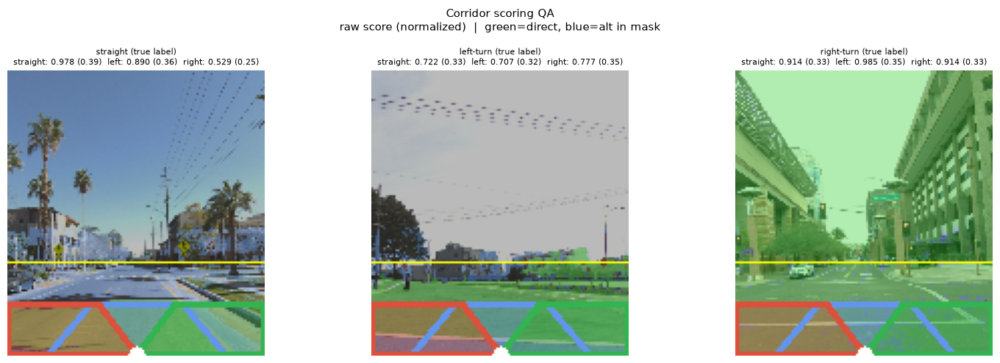

Saved outputs/corridor_scoring_qa.png


In [107]:
# ── Cell 14.13 — Corridor visual QA with scores ──────────────────────────────

fig, axes = plt.subplots(1, len(CLASSES), figsize=(5 * len(CLASSES), 5))

for ax, cls in zip(axes, CLASSES):
    img  = qa_examples[cls]
    x0, x1 = CENTER_SEG
    crop = img[:, x0:x1, :].copy()
    H, W = crop.shape[:2]

    feat, mask, corridors = extract_corridor_features(img, center_seg=CENTER_SEG)

    # blend drivable mask under corridors
    mask_rgb = _colorize(mask)   # reuse from Cell 14.6
    base = (0.3 * mask_rgb + 0.7 * crop).astype(np.uint8)

    # draw filled semi-transparent corridors
    overlay = base.copy()
    for name, poly in corridors.items():
        color = CORRIDOR_COLORS[name]
        pts   = poly[:, [1, 0]].reshape((-1, 1, 2))
        cv2.fillPoly(overlay, [pts], color)
    blended = (0.35 * overlay + 0.65 * base).astype(np.uint8)

    # draw outlines
    for name, poly in corridors.items():
        pts = poly[:, [1, 0]].reshape((-1, 1, 2))
        cv2.polylines(blended, [pts], isClosed=True,
                      color=CORRIDOR_COLORS[name], thickness=2)

    cv2.circle(blended, (W // 2, H - 1), 4, (255, 255, 255), -1)
    cv2.line(blended, (0, int(H * 0.67)), (W - 1, int(H * 0.67)),
             (255, 255, 0), 1)

    s, l, r   = feat[0], feat[1], feat[2]
    ns, nl, nr = feat[3], feat[4], feat[5]

    ax.imshow(blended)
    ax.set_title(
        f'{cls} (true label)\n'
        f'straight: {s:.3f} ({ns:.2f})  '
        f'left: {l:.3f} ({nl:.2f})  '
        f'right: {r:.3f} ({nr:.2f})',
        fontsize=8)
    ax.axis('off')

plt.suptitle(
    'Corridor scoring QA\n'
    'raw score (normalized)  |  green=direct, blue=alt in mask',
    fontsize=11)
plt.tight_layout()
plt.savefig('outputs/corridor_scoring_qa.png', dpi=140)
plt.show()
print('Saved outputs/corridor_scoring_qa.png')

In [112]:
# ── Cell 14.15 — Corridor semantic checks ────────────────────────────────────
print('=== Corridor Features — Semantic Checks ===\n')

print('score_straight  (expect: straight > left ≈ right):')
_dir_check('score_straight', corridor_3c[:, 0])

print('score_left  (expect: left-turn > straight ≈ right-turn):')
_dir_check('score_left', corridor_3c[:, 1])

print('score_right  (expect: right-turn > straight ≈ left-turn):')
_dir_check('score_right', corridor_3c[:, 2])

print('norm_straight  (softmax-normalized, same directional expectation):')
_dir_check('norm_straight', corridor_3c[:, 3])

print('norm_left:')
_dir_check('norm_left', corridor_3c[:, 4])

print('norm_right:')
_dir_check('norm_right', corridor_3c[:, 5])

=== Corridor Features — Semantic Checks ===

score_straight  (expect: straight > left ≈ right):
  score_straight
    straight      mean=0.8699  std=0.1973
    left-turn     mean=0.8639  std=0.2004
    right-turn    mean=0.8596  std=0.1969
    ANOVA: F=0.41  p=0.6643  (not significant)

score_left  (expect: left-turn > straight ≈ right-turn):
  score_left
    straight      mean=0.7840  std=0.2421
    left-turn     mean=0.7706  std=0.2508
    right-turn    mean=0.7910  std=0.2387
    ANOVA: F=0.76  p=0.4671  (not significant)

score_right  (expect: right-turn > straight ≈ left-turn):
  score_right
    straight      mean=0.7736  std=0.2458
    left-turn     mean=0.7809  std=0.2399
    right-turn    mean=0.7819  std=0.2346
    ANOVA: F=0.21  p=0.8107  (not significant)

norm_straight  (softmax-normalized, same directional expectation):
  norm_straight
    straight      mean=0.3526  std=0.0252
    left-turn     mean=0.3523  std=0.0232
    right-turn    mean=0.3490  std=0.0215
    ANOVA: F=3

({'straight': 0.32208243, 'left-turn': 0.32534367, 'right-turn': 0.3240312},
 0.32133145550951303)

In [113]:
# ── Cell 14.16 — Corridor benchmark ──────────────────────────────────────────
print('=== Benchmark: corridor features ===\n')
print(f'Majority-class baseline: {majority_baseline_3c:.3f}\n')

corridor_sets = {
    'Corridor':               corridor_3c,
    'Drivable+Corridor':      np.concatenate([drivable_3c_clipped, corridor_3c], axis=1),
    'Road_v2+Corridor':       np.concatenate([road_v2_3c,   corridor_3c], axis=1),
    'YOLO+Corridor':          np.concatenate([yolo_3c,      corridor_3c], axis=1),
    'YOLO+Road_v2+Corridor':  np.concatenate([yolo_3c, road_v2_3c, corridor_3c], axis=1),
    'All_v2Road+Corridor':    np.concatenate([hog_3c, hsv_3c, yolo_3c,
                                              road_v2_3c, corridor_3c], axis=1),
    'All_v2Road+Driv+Corr':   np.concatenate([hog_3c, hsv_3c, yolo_3c,
                                              road_v2_3c, drivable_3c_clipped,
                                              corridor_3c], axis=1),
}

bench_corr_rows = []
preds_corr      = {}

for name, feats in corridor_sets.items():
    X_tr, X_te, y_tr, y_te = train_test_split(
        feats, labels_3c, test_size=0.25, random_state=RANDOM_STATE, stratify=labels_3c)
    sc = StandardScaler()
    X_tr_s, X_te_s = sc.fit_transform(X_tr), sc.transform(X_te)

    svm = SVC(kernel='rbf', class_weight='balanced', random_state=RANDOM_STATE)
    svm.fit(X_tr_s, y_tr); svm_pred = svm.predict(X_te_s)

    rf  = RandomForestClassifier(n_estimators=300, class_weight='balanced',
                                  random_state=RANDOM_STATE, n_jobs=-1)
    rf.fit(X_tr, y_tr); rf_pred = rf.predict(X_te)

    for mname, pred in [('SVM', svm_pred), ('RF', rf_pred)]:
        acc = accuracy_score(y_te, pred)
        mf1 = f1_score(y_te, pred, labels=CLASSES, average='macro', zero_division=0)
        bench_corr_rows.append({'feature_set': name, 'model': mname,
                                  'accuracy': acc, 'macro_f1': mf1})
        preds_corr[(name, mname)] = (y_te, pred)

    _svm_f1 = f1_score(y_te, svm_pred, labels=CLASSES, average='macro', zero_division=0)
    _rf_f1  = f1_score(y_te, rf_pred,  labels=CLASSES, average='macro', zero_division=0)
    print(f'{name:30s}  '
          f'SVM acc={accuracy_score(y_te, svm_pred):.3f} f1={_svm_f1:.3f}  |  '
          f'RF  acc={accuracy_score(y_te, rf_pred):.3f} f1={_rf_f1:.3f}')

bench_corr_df = pd.DataFrame(bench_corr_rows)
bench_corr_df.to_csv(
    os.path.join(FEATURES_DIR, 'benchmark_corridor_3class.csv'), index=False)

best_corr = bench_corr_df.loc[bench_corr_df['macro_f1'].idxmax()]
print(f'\nBest (corridor sets): {best_corr["feature_set"]} / {best_corr["model"]}  '
      f'acc={best_corr["accuracy"]:.3f}  macro_f1={best_corr["macro_f1"]:.3f}')
print(f'Prior best macro F1: {max(bench_df["macro_f1"].max(), bench_driv_df["macro_f1"].max()):.3f}')
print('Saved benchmark_corridor_3class.csv')

=== Benchmark: corridor features ===

Majority-class baseline: 0.464

Corridor                        SVM acc=0.369 f1=0.353  |  RF  acc=0.347 f1=0.325
Drivable+Corridor               SVM acc=0.352 f1=0.347  |  RF  acc=0.419 f1=0.385
Road_v2+Corridor                SVM acc=0.411 f1=0.395  |  RF  acc=0.439 f1=0.397
YOLO+Corridor                   SVM acc=0.449 f1=0.409  |  RF  acc=0.479 f1=0.419
YOLO+Road_v2+Corridor           SVM acc=0.489 f1=0.465  |  RF  acc=0.504 f1=0.448
All_v2Road+Corridor             SVM acc=0.599 f1=0.545  |  RF  acc=0.581 f1=0.501
All_v2Road+Driv+Corr            SVM acc=0.596 f1=0.543  |  RF  acc=0.594 f1=0.526

Best (corridor sets): All_v2Road+Corridor / SVM  acc=0.599  macro_f1=0.545
Prior best macro F1: 0.549
Saved benchmark_corridor_3class.csv


## COORDINATE 

## IPM

In [121]:
# ── Section 15 — IPM-based Road Geometry Features ───────────────────────────
import json
import numpy as np
import cv2

CALIBRATION_PATH = '../data/processed/waymo_e2e/calibration_training.json'
with open(CALIBRATION_PATH) as f:
    _cal_raw = json.load(f)
CALIBRATION = _cal_raw['calibrations']   # dict: seg_id -> {FRONT, FRONT_LEFT, ...}

# ── Coordinate mapping: original FRONT camera -> CENTER_SEG crop ─────────────
# Panoramic image: 384 x 142px  (3 segments × 128px wide)
# Segment layout:  FRONT_LEFT (0:128) | FRONT (128:256) | FRONT_RIGHT (256:384)
# CENTER_SEG crop (cols 128:256) = full FRONT camera resized from 972x1079 → 128x142
#
# Scale factors:
#   width:  128 / 972  = 0.1317
#   height: 142 / 1079 = 0.1316
#
# K_crop adjustment:
#   fx_crop = fx_orig * scale_w
#   fy_crop = fy_orig * scale_h
#   cx_crop = cx_orig * scale_w        (crop coords = pano coords - 128;
#   cy_crop = cy_orig * scale_h         but FRONT segment starts at pano col 128,
#                                        so crop u = pano u - 128 = orig_u*scale - 128 + 128
#                                        = orig_u * scale  -- no extra offset needed)

_ORIG_W, _ORIG_H   = 972, 1079
_CROP_W, _CROP_H   = 128, 142
_SCALE_W = _CROP_W / _ORIG_W   # 0.1317
_SCALE_H = _CROP_H / _ORIG_H   # 0.1316

CAM_HEIGHT_M  = 1.8065     # meters above ground — constant across all 2037 sequences
CAM_PITCH_RAD = np.radians(0.23)   # near-zero

def _make_K_crop(K_orig):
    K = np.array(K_orig, dtype=np.float64)
    K_c = K.copy()
    K_c[0, 0] *= _SCALE_W           # fx
    K_c[1, 1] *= _SCALE_H           # fy
    K_c[0, 2] *= _SCALE_W           # cx  (no panoramic offset subtraction needed)
    K_c[1, 2] *= _SCALE_H           # cy
    return K_c

_K_default   = np.array(list(CALIBRATION.values())[0]['FRONT']['K'])
K_CROP_DEFAULT = _make_K_crop(_K_default)

IPM_FEATURE_NAMES = [
    'bev_centroid_x',       # lateral road center in BEV (0=left, 1=right)
    'bev_road_width_near',  # road width in BEV at near row (normalized)
    'bev_road_width_far',   # road width in BEV at far row (normalized)
    'bev_road_taper',       # width_near - width_far (negative = intersection opening)
    'bev_left_angle',       # left lane line angle from vertical in BEV (deg)
    'bev_right_angle',      # right lane line angle from vertical in BEV (deg)
    'bev_angle_asymmetry',  # bev_left_angle - bev_right_angle (0 = symmetric)
    'bev_line_count',       # number of Hough lines detected in BEV road region
]

print(f'Calibration loaded: {len(CALIBRATION)} sequences')
print(f'FRONT camera crop K:')
print(f'  fx={K_CROP_DEFAULT[0,0]:.3f}  fy={K_CROP_DEFAULT[1,1]:.3f}')
print(f'  cx={K_CROP_DEFAULT[0,2]:.3f}  cy={K_CROP_DEFAULT[1,2]:.3f}')
print(f'  (cx should be ~64, cy should be ~94)')
print(f'Camera height: {CAM_HEIGHT_M}m  pitch: {np.degrees(CAM_PITCH_RAD):.2f} deg')

# ── Sanity check: project a few known ground points ──
fx = K_CROP_DEFAULT[0, 0]
fy = K_CROP_DEFAULT[1, 1]
cx = K_CROP_DEFAULT[0, 2]
cy = K_CROP_DEFAULT[1, 2]
h  = CAM_HEIGHT_M
print(f'\nGround point projection check (u=cx={cx:.1f} means directly ahead):')
for x_fwd in [6, 10, 15, 20]:
    u = cx                                   # directly ahead (y_lat=0)
    v = fy * (h / x_fwd) + cy
    print(f'  {x_fwd:2d}m ahead: image row={v:.1f}  '
          f'({"in crop" if 0 <= v <= _CROP_H else "OUT OF CROP"})')

Calibration loaded: 2037 sequences
FRONT camera crop K:
  fx=146.564  fy=146.453
  cx=64.280  cy=94.643
  (cx should be ~64, cy should be ~94)
Camera height: 1.8065m  pitch: 0.23 deg

Ground point projection check (u=cx=64.3 means directly ahead):
   6m ahead: image row=138.7  (in crop)
  10m ahead: image row=121.1  (in crop)
  15m ahead: image row=112.3  (in crop)
  20m ahead: image row=107.9  (in crop)


In [126]:
def compute_ipm_homography(K_crop, cam_height=CAM_HEIGHT_M,
                            bev_size=(128, 128),
                            x_range=(6.0, 20.0),
                            y_range=4.0):
    """
    Compute IPM homography mapping CENTER_SEG crop pixels → BEV image.

    Uses pinhole projection with known camera height to project 4 ground
    anchor points into image space, then computes the homography to the
    corresponding flat BEV rectangle.

    Coordinate conventions:
      Vehicle frame:  x = forward, y = left, z = up
      Camera frame:   x = right, y = down, z = forward
      Ground point (x_fwd, y_lat) in vehicle frame projects to:
        u = fx * (-y_lat / x_fwd) + cx    (right = -left)
        v = fy * (h    / x_fwd) + cy      (down  = above-ground height)

    Parameters
    ----------
    K_crop    : 3x3 intrinsic matrix adjusted for the 128px CENTER_SEG crop
    cam_height: camera height above ground (m)
    bev_size  : (W, H) output BEV pixel dimensions
    x_range   : (near, far) distance ahead in meters — must be within image view
    y_range   : half-width lateral range in meters (symmetric: ±y_range)

    Returns H (3x3) or None if degenerate.
    """
    fx = K_crop[0, 0]; fy = K_crop[1, 1]
    cx = K_crop[0, 2]; cy = K_crop[1, 2]
    h  = cam_height
    W_crop, H_crop = _CROP_W, _CROP_H

    def project(x_fwd, y_lat):
        if x_fwd <= 0:
            return None
        u = fx * (-y_lat / x_fwd) + cx
        v = fy * (h      / x_fwd) + cy
        # clamp to crop boundaries
        u = float(np.clip(u, 0, W_crop - 1))
        v = float(np.clip(v, 0, H_crop - 1))
        return (u, v)

    x_near, x_far = x_range
    y_hw = y_range   # half-width

    # 4 ground-plane anchor points: near/far × left/right
    src_pts = [
        project(x_near,  y_hw),   # near-left
        project(x_near, -y_hw),   # near-right
        project(x_far,  -y_hw),   # far-right
        project(x_far,   y_hw),   # far-left
    ]
    if any(p is None for p in src_pts):
        return None
    src_pts = np.array(src_pts, dtype=np.float32)

    BW, BH = bev_size
    dst_pts = np.array([
        [0,    BH - 1],   # near-left  → bottom-left
        [BW-1, BH - 1],   # near-right → bottom-right
        [BW-1, 0],        # far-right  → top-right
        [0,    0],        # far-left   → top-left
    ], dtype=np.float32)

    H_mat, _ = cv2.findHomography(src_pts, dst_pts)
    return H_mat, src_pts   # return src_pts for visualization


def warp_to_bev(crop_img, H_mat, bev_size=(128, 128)):
    BW, BH = bev_size
    return cv2.warpPerspective(crop_img, H_mat, (BW, BH))


def extract_ipm_features(img_rgb, seq_id, center_seg=CENTER_SEG,
                          bev_size=(128, 128)):
    x0, x1 = center_seg
    crop = img_rgb[:, x0:x1, :]

    if seq_id in CALIBRATION:
        K_orig = np.array(CALIBRATION[seq_id]['FRONT']['K'])
        K_crop = _make_K_crop(K_orig)
    else:
        K_crop = K_CROP_DEFAULT

    result = compute_ipm_homography(K_crop, bev_size=bev_size)
    if result is None:
        return (np.zeros(len(IPM_FEATURE_NAMES), dtype=np.float32),
                np.zeros((*bev_size[::-1], 3), dtype=np.uint8), None)
    H_mat, src_pts = result

    bev_img = warp_to_bev(crop, H_mat, bev_size=bev_size)
    BW, BH  = bev_size

    # ── Road surface detection in BEV ────────────────────────────────────────
    # segment_road() flood fill is not suited for BEV space.
    # Instead: sample road color from the bottom strip of the BEV (near field,
    # most reliable), then threshold the full BEV image by color similarity.
    bev_hsv = cv2.cvtColor(bev_img, cv2.COLOR_RGB2HSV)
    seed_row = int(BH * 0.92)
    road_sample = bev_hsv[seed_row:, :]
    road_color  = np.median(road_sample.reshape(-1, 3), axis=0).astype(np.uint8)
    tol = np.array([20, 60, 60])
    lower = np.clip(road_color.astype(int) - tol, 0, 255).astype(np.uint8)
    upper = np.clip(road_color.astype(int) + tol, 0, 255).astype(np.uint8)
    bev_road_mask = cv2.inRange(bev_hsv, lower, upper)

    near_row = int(BH * 0.80)
    far_row  = int(BH * 0.30)
    near_px  = float((bev_road_mask[near_row, :] > 0).sum())
    far_px   = float((bev_road_mask[far_row,  :] > 0).sum())
    bev_road_width_near = near_px / BW
    bev_road_width_far  = far_px  / BW
    bev_road_taper      = bev_road_width_near - bev_road_width_far

    road_ys, road_xs = np.where(bev_road_mask > 0)
    bev_centroid_x = float(road_xs.mean()) / BW if len(road_xs) > 10 else 0.5

    # ── Hough lines on BEV ───────────────────────────────────────────────────
    bev_gray = cv2.cvtColor(bev_img, cv2.COLOR_RGB2GRAY)
    bev_roi  = bev_gray.copy()
    bev_roi[:int(BH * 0.15), :] = 0
    bev_roi[int(BH * 0.95):, :] = 0
    edges = cv2.Canny(bev_roi, 30, 100)
    lines_raw = cv2.HoughLinesP(edges, rho=1, theta=np.pi/180,
                                 threshold=10, minLineLength=10, maxLineGap=8)

    left_angles, right_angles = [], []
    if lines_raw is not None:
        for line in lines_raw:
            x1l, y1l, x2l, y2l = line[0]
            angle_from_vert = np.degrees(np.arctan2(x2l - x1l, y1l - y2l))
            if (x1l + x2l) / 2 < BW / 2:
                left_angles.append(angle_from_vert)
            else:
                right_angles.append(angle_from_vert)

    bev_left_angle  = float(np.median(left_angles))  if left_angles  else 0.0
    bev_right_angle = float(np.median(right_angles)) if right_angles else 0.0
    bev_angle_asym  = bev_left_angle - bev_right_angle
    bev_line_count  = len(lines_raw) if lines_raw is not None else 0

    features = np.array([
        bev_centroid_x, bev_road_width_near, bev_road_width_far,
        bev_road_taper, bev_left_angle, bev_right_angle,
        bev_angle_asym, float(bev_line_count),
    ], dtype=np.float32)

    return features, bev_img, src_pts

print('IPM functions defined.')

IPM functions defined.


Source trapezoid corners (u, v) in crop image:
  near-left     u=0.0  v=138.7
  near-right    u=127.0  v=138.7
  far-right     u=93.6  v=107.9
  far-left      u=35.0  v=107.9


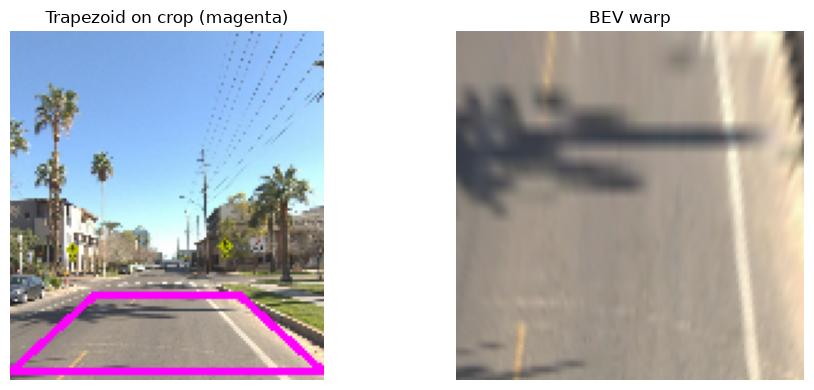

In [127]:
# ── Quick trapezoid sanity check ─────────────────────────────────────────────
sample_sid = seq_ids_3c[0]
sample_img = load_frame(manifest[sample_sid]['context_fnames'][-1])
x0, x1 = CENTER_SEG
sample_crop = sample_img[:, x0:x1, :].copy()

result = compute_ipm_homography(K_CROP_DEFAULT)
if result is not None:
    _, src_pts = result
    print('Source trapezoid corners (u, v) in crop image:')
    labels_trap = ['near-left', 'near-right', 'far-right', 'far-left']
    for pt, lbl in zip(src_pts, labels_trap):
        print(f'  {lbl:12s}  u={pt[0]:.1f}  v={pt[1]:.1f}')

    # draw trapezoid on the crop
    vis = sample_crop.copy()
    pts_int = src_pts.astype(np.int32).reshape((-1, 1, 2))
    cv2.polylines(vis, [pts_int], isClosed=True, color=(255, 0, 255), thickness=2)

    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    axes[0].imshow(vis)
    axes[0].set_title('Trapezoid on crop (magenta)')
    axes[0].axis('off')
    _, bev_img, _ = extract_ipm_features(sample_img, sample_sid)
    axes[1].imshow(bev_img)
    axes[1].set_title('BEV warp')
    axes[1].axis('off')
    plt.tight_layout()
    plt.show()

Generating IPM visual QA panel...


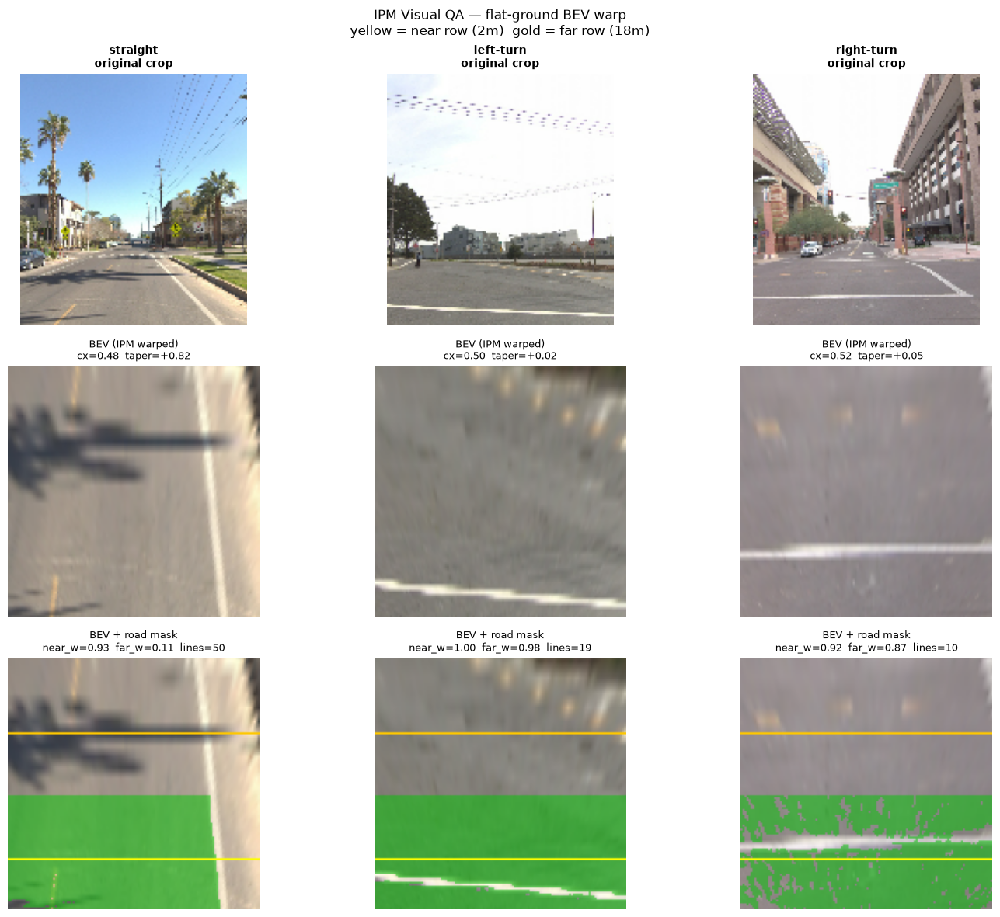

Saved outputs/qa_ipm_visual_panel_3class.png

Key things to check:
  1. Lane lines should be more vertical/parallel in BEV than in the original crop
  2. Road surface should be identifiable in the lower half of the BEV
  3. Straight scenes should have wider bev_road_width_far than turn scenes


In [128]:
# ── Visual QA — BEV warps ────────────────────────────────────────────────────
print('Generating IPM visual QA panel...')

# get one seq_id per class for calibration lookup
qa_seq_ids = {}
for sid, entry in manifest.items():
    if entry['label'] in CLASSES and entry['label'] not in qa_seq_ids:
        qa_seq_ids[entry['label']] = sid
    if len(qa_seq_ids) == len(CLASSES):
        break

fig, axes = plt.subplots(3, len(CLASSES), figsize=(5 * len(CLASSES), 12))

for i, cls in enumerate(CLASSES):
    img  = qa_examples[cls]
    sid  = qa_seq_ids[cls]
    x0, x1 = CENTER_SEG
    crop = img[:, x0:x1, :]

    feat, bev_img, src_pts = extract_ipm_features(img, sid, center_seg=CENTER_SEG)

    axes[0, i].imshow(crop)
    axes[0, i].set_title(f'{cls}\noriginal crop', fontsize=10, fontweight='bold')
    axes[0, i].axis('off')

    axes[1, i].imshow(bev_img)
    axes[1, i].set_title(
        f'BEV (IPM warped)\n'
        f'cx={feat[0]:.2f}  taper={feat[3]:+.2f}',
        fontsize=9)
    axes[1, i].axis('off')

    # BEV with road mask overlay and Hough lines
    bev_road_mask_vis, _ = segment_road(bev_img)
    BH, BW = bev_img.shape[:2]
    overlay = bev_img.copy()
    overlay[bev_road_mask_vis > 0] = (
        overlay[bev_road_mask_vis > 0] * 0.5 +
        np.array([0, 200, 0]) * 0.5
    ).astype(np.uint8)

    # draw near/far reference lines
    cv2.line(overlay, (0, int(BH * 0.80)), (BW, int(BH * 0.80)),
             (255, 255, 0), 1)
    cv2.line(overlay, (0, int(BH * 0.30)), (BW, int(BH * 0.30)),
             (255, 200, 0), 1)

    axes[2, i].imshow(overlay)
    axes[2, i].set_title(
        f'BEV + road mask\n'
        f'near_w={feat[1]:.2f}  far_w={feat[2]:.2f}  lines={int(feat[7])}',
        fontsize=9)
    axes[2, i].axis('off')

plt.suptitle('IPM Visual QA — flat-ground BEV warp\n'
             'yellow = near row (2m)  gold = far row (18m)', fontsize=12)
plt.tight_layout()
plt.savefig('outputs/qa_ipm_visual_panel_3class.png', dpi=140, bbox_inches='tight')
plt.show()
print('Saved outputs/qa_ipm_visual_panel_3class.png')
print('\nKey things to check:')
print('  1. Lane lines should be more vertical/parallel in BEV than in the original crop')
print('  2. Road surface should be identifiable in the lower half of the BEV')
print('  3. Straight scenes should have wider bev_road_width_far than turn scenes')

In [130]:
# ── Extraction loop ──────────────────────────────────────────────────────────
IPM_PATH        = os.path.join(FEATURES_DIR, 'ipm_3class.npy')
IPM_SEQIDS_PATH = os.path.join(FEATURES_DIR, 'ipm_3class_seq_ids.npy')
RECOMPUTE_IPM   = not os.path.exists(IPM_PATH)  # set True to force recompute

if RECOMPUTE_IPM:
    print(f'Extracting IPM features for {len(seq_ids_3c)} sequences...')
    t0 = time.time()
    ipm_list = []

    for i, sid in enumerate(seq_ids_3c):
        target_fname = manifest[sid]['context_fnames'][-1]
        img = load_frame(target_fname)
        feat, _, _ = extract_ipm_features(img, sid, center_seg=CENTER_SEG)
        ipm_list.append(feat)

        if (i + 1) % 200 == 0:
            elapsed = time.time() - t0
            eta = elapsed / (i + 1) * (len(seq_ids_3c) - (i + 1))
            print(f'  {i+1}/{len(seq_ids_3c)}  '
                  f'({elapsed:.0f}s elapsed, ~{eta:.0f}s remaining)')

    ipm_3c = np.array(ipm_list, dtype=np.float32)
    np.save(IPM_PATH,        ipm_3c)
    np.save(IPM_SEQIDS_PATH, seq_ids_3c)
    print(f'Done in {time.time()-t0:.0f}s.  Shape: {ipm_3c.shape}')
    print(f'Saved {IPM_PATH}')

else:
    ipm_3c    = np.load(IPM_PATH)
    _saved    = np.load(IPM_SEQIDS_PATH, allow_pickle=True).astype(str)
    assert np.array_equal(_saved, seq_ids_3c), (
        'ipm_3class_seq_ids.npy does not match seq_ids_3c — '
        'set RECOMPUTE_IPM=True to regenerate.')
    print(f'Loaded cached ipm_3class.npy: {ipm_3c.shape}')

Extracting IPM features for 1604 sequences...
  200/1604  (1s elapsed, ~4s remaining)
  400/1604  (1s elapsed, ~3s remaining)
  600/1604  (2s elapsed, ~3s remaining)
  800/1604  (2s elapsed, ~2s remaining)
  1000/1604  (2s elapsed, ~1s remaining)
  1200/1604  (3s elapsed, ~1s remaining)
  1400/1604  (3s elapsed, ~0s remaining)
  1600/1604  (4s elapsed, ~0s remaining)
Done in 4s.  Shape: (1604, 8)
Saved ../data/processed/waymo_e2e/features/ipm_3class.npy


In [131]:
# ── Semantic / directional checks ────────────────────────────────────────────
print('=== IPM Features — Semantic / Directional Checks ===\n')

print('bev_centroid_x  (expect: left-turn < 0.5 < right-turn):')
_dir_check('bev_centroid_x', ipm_3c[:, IPM_FEATURE_NAMES.index('bev_centroid_x')])

print('bev_road_taper  (expect: straight > turns — open forward corridor vs intersection):')
_dir_check('bev_road_taper', ipm_3c[:, IPM_FEATURE_NAMES.index('bev_road_taper')])

print('bev_road_width_far  (expect: straight > turns — far-field road visible straight):')
_dir_check('bev_road_width_far',
           ipm_3c[:, IPM_FEATURE_NAMES.index('bev_road_width_far')])

print('bev_angle_asymmetry  (expect: left-turn ≠ right-turn — lane line angles differ):')
_dir_check('bev_angle_asymmetry',
           ipm_3c[:, IPM_FEATURE_NAMES.index('bev_angle_asymmetry')])

=== IPM Features — Semantic / Directional Checks ===

bev_centroid_x  (expect: left-turn < 0.5 < right-turn):
  bev_centroid_x
    straight      mean=0.4947  std=0.0589
    left-turn     mean=0.4936  std=0.0487
    right-turn    mean=0.4962  std=0.0450
    ANOVA: F=0.28  p=0.7571  (not significant)

bev_road_taper  (expect: straight > turns — open forward corridor vs intersection):
  bev_road_taper
    straight      mean=0.0869  std=0.2238
    left-turn     mean=0.1037  std=0.2439
    right-turn    mean=0.0720  std=0.2298
    ANOVA: F=2.01  p=0.1343  (not significant)

bev_road_width_far  (expect: straight > turns — far-field road visible straight):
  bev_road_width_far
    straight      mean=0.7559  std=0.2873
    left-turn     mean=0.7672  std=0.2829
    right-turn    mean=0.7987  std=0.2627
    ANOVA: F=3.42  p=0.0331  ** significant **

bev_angle_asymmetry  (expect: left-turn ≠ right-turn — lane line angles differ):
  bev_angle_asymmetry
    straight      mean=-15.4554  std=58.3734

({'straight': -15.455432, 'left-turn': -1.0726998, 'right-turn': -1.3131908},
 1.55850115459819e-07)

In [132]:
# ── Benchmark ────────────────────────────────────────────────────────────────
print('=== Benchmark: IPM features ===\n')
print(f'Majority-class baseline: {majority_baseline_3c:.3f}\n')

ipm_sets = {
    'IPM':                  ipm_3c,
    'Road_v2+IPM':          np.concatenate([road_v2_3c,  ipm_3c], axis=1),
    'YOLO+IPM':             np.concatenate([yolo_3c,     ipm_3c], axis=1),
    'Road_v2+YOLO+IPM':     np.concatenate([road_v2_3c, yolo_3c, ipm_3c], axis=1),
    'All_v2Road+IPM':       np.concatenate([hog_3c, hsv_3c, yolo_3c,
                                            road_v2_3c, ipm_3c], axis=1),
}

bench_ipm_rows = []
preds_ipm      = {}

for name, feats in ipm_sets.items():
    X_tr, X_te, y_tr, y_te = train_test_split(
        feats, labels_3c, test_size=0.25,
        random_state=RANDOM_STATE, stratify=labels_3c)
    sc = StandardScaler()
    X_tr_s, X_te_s = sc.fit_transform(X_tr), sc.transform(X_te)

    svm = SVC(kernel='rbf', class_weight='balanced', random_state=RANDOM_STATE)
    svm.fit(X_tr_s, y_tr); svm_pred = svm.predict(X_te_s)

    rf = RandomForestClassifier(n_estimators=300, class_weight='balanced',
                                 random_state=RANDOM_STATE, n_jobs=-1)
    rf.fit(X_tr, y_tr); rf_pred = rf.predict(X_te)

    for mname, pred in [('SVM', svm_pred), ('RF', rf_pred)]:
        acc = accuracy_score(y_te, pred)
        mf1 = f1_score(y_te, pred, labels=CLASSES, average='macro', zero_division=0)
        bench_ipm_rows.append({'feature_set': name, 'model': mname,
                                'accuracy': acc, 'macro_f1': mf1})
        preds_ipm[(name, mname)] = (y_te, pred)

    _svm_f1 = f1_score(y_te, svm_pred, labels=CLASSES, average='macro', zero_division=0)
    _rf_f1  = f1_score(y_te, rf_pred,  labels=CLASSES, average='macro', zero_division=0)
    print(f'{name:30s}  '
          f'SVM acc={accuracy_score(y_te, svm_pred):.3f} f1={_svm_f1:.3f}  |  '
          f'RF  acc={accuracy_score(y_te, rf_pred):.3f} f1={_rf_f1:.3f}')

bench_ipm_df = pd.DataFrame(bench_ipm_rows)
bench_ipm_df.to_csv(
    os.path.join(FEATURES_DIR, 'benchmark_ipm_3class.csv'), index=False)

best_ipm = bench_ipm_df.loc[bench_ipm_df['macro_f1'].idxmax()]
prior_best = bench_df['macro_f1'].max()
print(f'\nBest (IPM sets): {best_ipm["feature_set"]} / {best_ipm["model"]}  '
      f'macro_f1={best_ipm["macro_f1"]:.3f}')
print(f'Prior best: {prior_best:.3f}  '
      f'({"improved" if best_ipm["macro_f1"] > prior_best else "no improvement"})')
print('Saved benchmark_ipm_3class.csv')

=== Benchmark: IPM features ===

Majority-class baseline: 0.464

IPM                             SVM acc=0.354 f1=0.347  |  RF  acc=0.424 f1=0.395
Road_v2+IPM                     SVM acc=0.429 f1=0.419  |  RF  acc=0.474 f1=0.433
YOLO+IPM                        SVM acc=0.474 f1=0.437  |  RF  acc=0.519 f1=0.470
Road_v2+YOLO+IPM                SVM acc=0.474 f1=0.445  |  RF  acc=0.521 f1=0.474
All_v2Road+IPM                  SVM acc=0.603 f1=0.553  |  RF  acc=0.608 f1=0.539

Best (IPM sets): All_v2Road+IPM / SVM  macro_f1=0.553
Prior best: 0.549  (improved)
Saved benchmark_ipm_3class.csv


In [133]:
# ── Ablation: HOG+IPM only ───────────────────────────────────────────────────
hog_ipm = np.concatenate([hog_3c, ipm_3c], axis=1)

X_tr, X_te, y_tr, y_te = train_test_split(
    hog_ipm, labels_3c, test_size=0.25,
    random_state=RANDOM_STATE, stratify=labels_3c)
sc = StandardScaler()
X_tr_s, X_te_s = sc.fit_transform(X_tr), sc.transform(X_te)

svm = SVC(kernel='rbf', class_weight='balanced', random_state=RANDOM_STATE)
svm.fit(X_tr_s, y_tr); svm_pred = svm.predict(X_te_s)

rf = RandomForestClassifier(n_estimators=300, class_weight='balanced',
                             random_state=RANDOM_STATE, n_jobs=-1)
rf.fit(X_tr, y_tr); rf_pred = rf.predict(X_te)

svm_f1 = f1_score(y_te, svm_pred, labels=CLASSES, average='macro', zero_division=0)
rf_f1  = f1_score(y_te, rf_pred,  labels=CLASSES, average='macro', zero_division=0)

print(f'HOG alone  / SVM  macro_f1=0.547   RF  macro_f1={bench_df[bench_df["feature_set"]=="HOG"]["macro_f1"].max():.3f}')
print(f'HOG+IPM    / SVM  macro_f1={svm_f1:.3f}  delta={svm_f1-0.547:+.3f}')
print(f'HOG+IPM    / RF   macro_f1={rf_f1:.3f}  delta={rf_f1-bench_df[bench_df["feature_set"]=="HOG"]["macro_f1"].max():+.3f}')

HOG alone  / SVM  macro_f1=0.547   RF  macro_f1=0.547
HOG+IPM    / SVM  macro_f1=0.551  delta=+0.004
HOG+IPM    / RF   macro_f1=0.519  delta=-0.028


BEV corridor masks recomputed (BEV-native trapezoids):
  straight  : 7296 pixels  (44.5% of BEV)
  left      : 6528 pixels  (39.8% of BEV)
  right     : 6400 pixels  (39.1% of BEV)
BEV corridor masks computed.
  straight  : 1860480 pixels in corridor
  left      : 1664640 pixels in corridor
  right     : 1632000 pixels in corridor


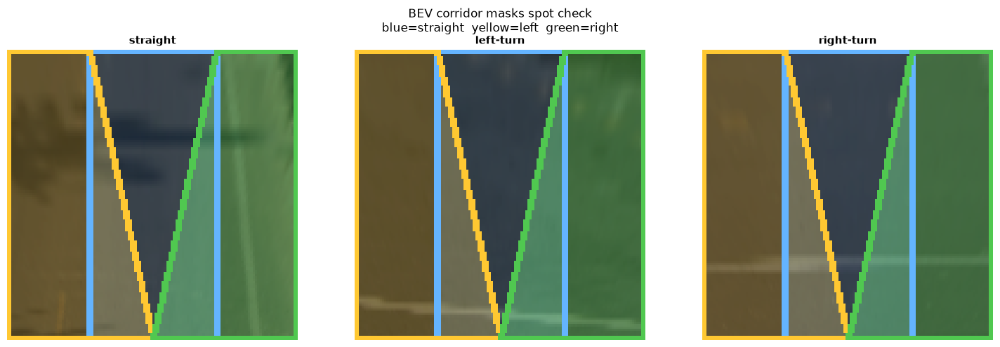

Saved outputs/bev_corridor_spotcheck.png


In [135]:
# ── BEV corridor masks — pie-slice sectors from virtual ego position ──────────

BEV_CORRIDOR_WEIGHTS = {'road': 1.0, 'background': -0.1}

BEV_CORRIDOR_FEATURE_NAMES = [
    'bev_score_straight',   # raw road score in straight corridor
    'bev_score_left',       # raw road score in left corridor
    'bev_score_right',      # raw road score in right corridor
    'bev_norm_straight',    # softmax-normalized score
    'bev_norm_left',
    'bev_norm_right',
    'bev_lr_dominance',     # score_left - score_right (>0 = more road on left)
]

BEV_CORRIDOR_COLORS = {
    'straight': (100, 180, 255),   # blue
    'left':     (255, 200,  50),   # yellow
    'right':    ( 80, 200,  80),   # green
}

def make_bev_corridor_masks(bev_size=(128, 128),
                             lane_frac=0.22):
    """
    BEV-native corridor masks defined as trapezoids in pixel space.
    No angular sector geometry — corridors are grounded in BEV lane width.

    lane_frac: fraction of BEV width representing one lane (~3.5m / 8m total = 0.44,
               half-lane = 0.22)

    Straight : central rectangle — the ego lane forward
    Left     : parallelogram sweeping bottom-center to upper-left — left turn arc
    Right    : mirror parallelogram — right turn arc
    """
    BW, BH    = bev_size
    half_lane = int(BW * lane_frac)   # ~28px out of 128
    cx        = BW // 2               # 64

    polys = {
        # central forward strip
        'straight': np.array([
            [cx - half_lane, BH - 1],
            [cx + half_lane, BH - 1],
            [cx + half_lane, 0],
            [cx - half_lane, 0],
        ], dtype=np.int32),

        # sweeps from bottom-center to upper-left
        'left': np.array([
            [0,              BH - 1],
            [cx,             BH - 1],
            [cx - half_lane, 0],
            [0,              0],
        ], dtype=np.int32),

        # mirror of left
        'right': np.array([
            [cx,             BH - 1],
            [BW - 1,         BH - 1],
            [BW - 1,         0],
            [cx + half_lane, 0],
        ], dtype=np.int32),
    }

    masks = {}
    for name, poly in polys.items():
        m = np.zeros((BH, BW), dtype=np.uint8)
        cv2.fillPoly(m, [poly.reshape(-1, 1, 2)], 255)
        masks[name] = m

    return masks, (cx, BH - 1), polys

# recompute
BEV_CORRIDOR_MASKS, BEV_EGO_PX, BEV_CORRIDOR_POLYS = make_bev_corridor_masks()

print('BEV corridor masks recomputed (BEV-native trapezoids):')
for name, mask in BEV_CORRIDOR_MASKS.items():
    px = int((mask > 0).sum())
    print(f'  {name:10s}: {px} pixels  ({px/128/128:.1%} of BEV)')


# precompute once — same geometry for all sequences
BEV_CORRIDOR_MASKS, BEV_EGO_PX, BEV_CORRIDOR_POLYS = make_bev_corridor_masks()

print('BEV corridor masks computed.')
for name, mask in BEV_CORRIDOR_MASKS.items():
    print(f'  {name:10s}: {mask.sum()} pixels in corridor')

# ── spot check: overlay corridors on qa_examples ─────────────────────────────
fig, axes = plt.subplots(1, len(CLASSES), figsize=(5 * len(CLASSES), 5))
for i, cls in enumerate(CLASSES):
    img = qa_examples[cls]; sid = qa_seq_ids[cls]
    _, bev_img, _ = extract_ipm_features(img, sid)

    overlay = bev_img.copy()
    for name, mask in BEV_CORRIDOR_MASKS.items():
        colored = np.zeros_like(overlay)
        colored[mask > 0] = BEV_CORRIDOR_COLORS[name]
        overlay = (0.35 * colored + 0.65 * overlay).astype(np.uint8)
    for name, poly in BEV_CORRIDOR_POLYS.items():
        cv2.polylines(overlay, [poly.reshape(-1, 1, 2)],
                      isClosed=True, color=BEV_CORRIDOR_COLORS[name], thickness=2)

    axes[i].imshow(overlay)
    axes[i].set_title(f'{cls}', fontsize=11, fontweight='bold')
    axes[i].axis('off')

plt.suptitle('BEV corridor masks spot check\n'
             'blue=straight  yellow=left  green=right', fontsize=12)
plt.tight_layout()
plt.savefig('outputs/bev_corridor_spotcheck.png', dpi=140)
plt.show()
print('Saved outputs/bev_corridor_spotcheck.png')

In [136]:
# ── BEV road mask helper + corridor scoring ───────────────────────────────────

def get_bev_road_mask(bev_img):
    """
    Segment road surface in BEV image via HSV color thresholding.
    Seeds road color from the bottom strip (near-field, most reliable in BEV).
    Returns (BH, BW) uint8 mask.
    """
    BH, BW = bev_img.shape[:2]
    bev_hsv = cv2.cvtColor(bev_img, cv2.COLOR_RGB2HSV)
    seed_row = int(BH * 0.92)
    road_color = np.median(
        bev_hsv[seed_row:, :].reshape(-1, 3), axis=0).astype(np.uint8)
    tol   = np.array([20, 60, 60])
    lower = np.clip(road_color.astype(int) - tol, 0, 255).astype(np.uint8)
    upper = np.clip(road_color.astype(int) + tol, 0, 255).astype(np.uint8)
    return cv2.inRange(bev_hsv, lower, upper)


def score_bev_corridor(bev_road_mask, corridor_mask,
                        weights=BEV_CORRIDOR_WEIGHTS):
    """
    Weighted road coverage score for one corridor.
    Returns float in [-0.1, 1.0].
    """
    corridor_px = corridor_mask > 0
    n = int(corridor_px.sum())
    if n == 0:
        return 0.0
    road_in = int(((bev_road_mask > 0) & corridor_px).sum())
    bg_in   = int(((bev_road_mask == 0) & corridor_px).sum())
    return float((road_in * weights['road'] +
                  bg_in  * weights['background']) / n)


def extract_bev_corridor_features(img_rgb, seq_id,
                                   center_seg=CENTER_SEG,
                                   bev_size=(128, 128)):
    """
    Extract 7 BEV corridor scoring features.

    Returns
    -------
    features      : np.ndarray (7,) float32
    bev_img       : (BH, BW, 3) BEV image
    bev_road_mask : (BH, BW) uint8
    """
    if seq_id in CALIBRATION:
        K_crop = _make_K_crop(np.array(CALIBRATION[seq_id]['FRONT']['K']))
    else:
        K_crop = K_CROP_DEFAULT

    result = compute_ipm_homography(K_crop, bev_size=bev_size)
    if result is None:
        return (np.zeros(len(BEV_CORRIDOR_FEATURE_NAMES), dtype=np.float32),
                np.zeros((*bev_size[::-1], 3), dtype=np.uint8),
                np.zeros(bev_size[::-1],       dtype=np.uint8))

    H_mat, _ = result
    x0, x1   = center_seg
    bev_img   = warp_to_bev(img_rgb[:, x0:x1, :], H_mat, bev_size=bev_size)
    bev_road_mask = get_bev_road_mask(bev_img)

    scores = {name: score_bev_corridor(bev_road_mask, BEV_CORRIDOR_MASKS[name])
              for name in ['straight', 'left', 'right']}

    sv      = np.array([scores['straight'], scores['left'], scores['right']])
    sv_exp  = np.exp(sv - sv.max())
    sv_norm = sv_exp / sv_exp.sum()

    features = np.array([
        scores['straight'], scores['left'], scores['right'],
        sv_norm[0], sv_norm[1], sv_norm[2],
        scores['left'] - scores['right'],
    ], dtype=np.float32)

    return features, bev_img, bev_road_mask


print(f'BEV corridor scoring functions defined.')
print(f'Feature dims: {len(BEV_CORRIDOR_FEATURE_NAMES)}')
print(f'  {BEV_CORRIDOR_FEATURE_NAMES}')

BEV corridor scoring functions defined.
Feature dims: 7
  ['bev_score_straight', 'bev_score_left', 'bev_score_right', 'bev_norm_straight', 'bev_norm_left', 'bev_norm_right', 'bev_lr_dominance']


In [137]:
# ── Extraction loop ───────────────────────────────────────────────────────────
BEV_CORR_PATH        = os.path.join(FEATURES_DIR, 'bev_corridor_3class.npy')
BEV_CORR_SEQIDS_PATH = os.path.join(FEATURES_DIR, 'bev_corridor_3class_seq_ids.npy')
RECOMPUTE_BEV_CORR   = not os.path.exists(BEV_CORR_PATH)

if RECOMPUTE_BEV_CORR:
    print(f'Extracting BEV corridor features for {len(seq_ids_3c)} sequences...')
    t0 = time.time()
    bev_corr_list = []

    for i, sid in enumerate(seq_ids_3c):
        target_fname = manifest[sid]['context_fnames'][-1]
        img  = load_frame(target_fname)
        feat, _, _ = extract_bev_corridor_features(img, sid)
        bev_corr_list.append(feat)

        if (i + 1) % 200 == 0:
            elapsed = time.time() - t0
            eta = elapsed / (i + 1) * (len(seq_ids_3c) - (i + 1))
            print(f'  {i+1}/{len(seq_ids_3c)}  '
                  f'({elapsed:.0f}s elapsed, ~{eta:.0f}s remaining)')

    bev_corridor_3c = np.array(bev_corr_list, dtype=np.float32)
    np.save(BEV_CORR_PATH,        bev_corridor_3c)
    np.save(BEV_CORR_SEQIDS_PATH, seq_ids_3c)
    print(f'Done in {time.time()-t0:.0f}s.  Shape: {bev_corridor_3c.shape}')
    print(f'Saved {BEV_CORR_PATH}')

else:
    bev_corridor_3c = np.load(BEV_CORR_PATH)
    _saved = np.load(BEV_CORR_SEQIDS_PATH, allow_pickle=True).astype(str)
    assert np.array_equal(_saved, seq_ids_3c), \
        'bev_corridor seq_ids mismatch — set RECOMPUTE_BEV_CORR=True'
    print(f'Loaded cached bev_corridor_3class.npy: {bev_corridor_3c.shape}')

Extracting BEV corridor features for 1604 sequences...
  200/1604  (1s elapsed, ~5s remaining)
  400/1604  (1s elapsed, ~3s remaining)
  600/1604  (1s elapsed, ~2s remaining)
  800/1604  (2s elapsed, ~2s remaining)
  1000/1604  (2s elapsed, ~1s remaining)
  1200/1604  (3s elapsed, ~1s remaining)
  1400/1604  (3s elapsed, ~0s remaining)
  1600/1604  (3s elapsed, ~0s remaining)
Done in 3s.  Shape: (1604, 7)
Saved ../data/processed/waymo_e2e/features/bev_corridor_3class.npy


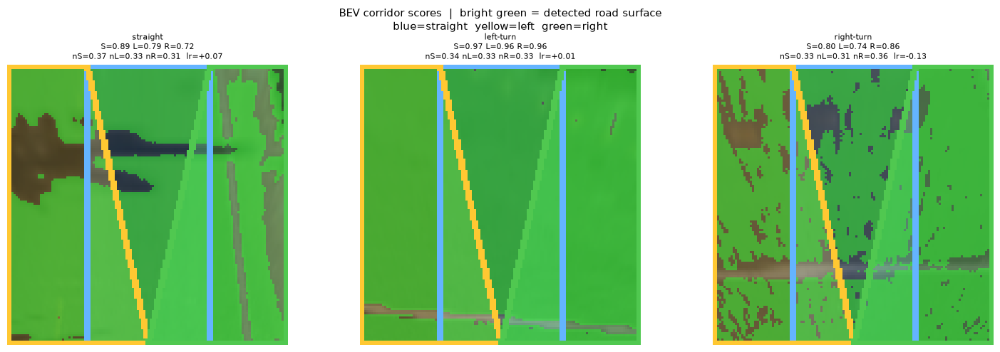

Saved outputs/bev_corridor_scoring_qa.png

=== BEV Corridor — Semantic Checks ===

bev_score_straight  (expect: straight > turns):
  bev_score_straight
    straight      mean=0.7989  std=0.2722
    left-turn     mean=0.8066  std=0.2368
    right-turn    mean=0.8235  std=0.2215
    ANOVA: F=1.39  p=0.2489  (not significant)

bev_score_left  (expect: left-turn > others):
  bev_score_left
    straight      mean=0.7911  std=0.2575
    left-turn     mean=0.8135  std=0.2345
    right-turn    mean=0.8259  std=0.2211
    ANOVA: F=3.16  p=0.0428  ** significant **

bev_score_right  (expect: right-turn > others):
  bev_score_right
    straight      mean=0.7803  std=0.2545
    left-turn     mean=0.7967  std=0.2413
    right-turn    mean=0.8193  std=0.2150
    ANOVA: F=3.76  p=0.0235  ** significant **

bev_lr_dominance  (expect: left-turn > 0 > right-turn):
  bev_lr_dominance
    straight      mean=0.0108  std=0.2397
    left-turn     mean=0.0168  std=0.2201
    right-turn    mean=0.0066  std=0.1

In [138]:
# ── Visual QA with scores ─────────────────────────────────────────────────────
fig, axes = plt.subplots(1, len(CLASSES), figsize=(5 * len(CLASSES), 5))
for i, cls in enumerate(CLASSES):
    img = qa_examples[cls]; sid = qa_seq_ids[cls]
    feat, bev_img, bev_road_mask = extract_bev_corridor_features(img, sid)

    overlay = bev_img.copy()
    for name, mask in BEV_CORRIDOR_MASKS.items():
        colored = np.zeros_like(overlay)
        colored[mask > 0] = BEV_CORRIDOR_COLORS[name]
        overlay = (0.3 * colored + 0.7 * overlay).astype(np.uint8)
    # highlight detected road surface
    overlay[bev_road_mask > 0] = (
        overlay[bev_road_mask > 0] * 0.5 +
        np.array([50, 255, 50]) * 0.5
    ).astype(np.uint8)
    for name, poly in BEV_CORRIDOR_POLYS.items():
        cv2.polylines(overlay, [poly.reshape(-1, 1, 2)],
                      isClosed=True, color=BEV_CORRIDOR_COLORS[name], thickness=2)

    axes[i].imshow(overlay)
    axes[i].set_title(
        f'{cls}\n'
        f'S={feat[0]:.2f} L={feat[1]:.2f} R={feat[2]:.2f}\n'
        f'nS={feat[3]:.2f} nL={feat[4]:.2f} nR={feat[5]:.2f}  lr={feat[6]:+.2f}',
        fontsize=8)
    axes[i].axis('off')

plt.suptitle('BEV corridor scores  |  bright green = detected road surface\n'
             'blue=straight  yellow=left  green=right', fontsize=11)
plt.tight_layout()
plt.savefig('outputs/bev_corridor_scoring_qa.png', dpi=140)
plt.show()
print('Saved outputs/bev_corridor_scoring_qa.png')

# ── Semantic checks ───────────────────────────────────────────────────────────
print('\n=== BEV Corridor — Semantic Checks ===\n')

print('bev_score_straight  (expect: straight > turns):')
_dir_check('bev_score_straight',
           bev_corridor_3c[:, BEV_CORRIDOR_FEATURE_NAMES.index('bev_score_straight')])

print('bev_score_left  (expect: left-turn > others):')
_dir_check('bev_score_left',
           bev_corridor_3c[:, BEV_CORRIDOR_FEATURE_NAMES.index('bev_score_left')])

print('bev_score_right  (expect: right-turn > others):')
_dir_check('bev_score_right',
           bev_corridor_3c[:, BEV_CORRIDOR_FEATURE_NAMES.index('bev_score_right')])

print('bev_lr_dominance  (expect: left-turn > 0 > right-turn):')
_dir_check('bev_lr_dominance',
           bev_corridor_3c[:, BEV_CORRIDOR_FEATURE_NAMES.index('bev_lr_dominance')])

# ── Benchmark ─────────────────────────────────────────────────────────────────
print('\n=== Benchmark: BEV corridor features ===\n')
print(f'Majority-class baseline: {majority_baseline_3c:.3f}\n')

bev_corr_sets = {
    'BEV_Corridor':            bev_corridor_3c,
    'IPM+BEV_Corridor':        np.concatenate([ipm_3c,      bev_corridor_3c], axis=1),
    'Road_v2+BEV_Corridor':    np.concatenate([road_v2_3c,  bev_corridor_3c], axis=1),
    'YOLO+BEV_Corridor':       np.concatenate([yolo_3c,     bev_corridor_3c], axis=1),
    'All_v2Road+BEV_Corridor': np.concatenate([hog_3c, hsv_3c, yolo_3c,
                                                road_v2_3c, bev_corridor_3c], axis=1),
    'All_v2Road+IPM+BEV_Corr': np.concatenate([hog_3c, hsv_3c, yolo_3c,
                                                road_v2_3c, ipm_3c,
                                                bev_corridor_3c], axis=1),
}

bench_bev_rows = []; preds_bev = {}
for name, feats in bev_corr_sets.items():
    X_tr, X_te, y_tr, y_te = train_test_split(
        feats, labels_3c, test_size=0.25,
        random_state=RANDOM_STATE, stratify=labels_3c)
    sc = StandardScaler()
    X_tr_s, X_te_s = sc.fit_transform(X_tr), sc.transform(X_te)

    svm = SVC(kernel='rbf', class_weight='balanced', random_state=RANDOM_STATE)
    svm.fit(X_tr_s, y_tr); svm_pred = svm.predict(X_te_s)

    rf = RandomForestClassifier(n_estimators=300, class_weight='balanced',
                                 random_state=RANDOM_STATE, n_jobs=-1)
    rf.fit(X_tr, y_tr); rf_pred = rf.predict(X_te)

    for mname, pred in [('SVM', svm_pred), ('RF', rf_pred)]:
        bench_bev_rows.append({
            'feature_set': name, 'model': mname,
            'accuracy':  accuracy_score(y_te, pred),
            'macro_f1':  f1_score(y_te, pred, labels=CLASSES,
                                   average='macro', zero_division=0)})
        preds_bev[(name, mname)] = (y_te, pred)

    _svm_f1 = f1_score(y_te, svm_pred, labels=CLASSES, average='macro', zero_division=0)
    _rf_f1  = f1_score(y_te, rf_pred,  labels=CLASSES, average='macro', zero_division=0)
    print(f'{name:30s}  SVM f1={_svm_f1:.3f}  |  RF f1={_rf_f1:.3f}')

bench_bev_df = pd.DataFrame(bench_bev_rows)
bench_bev_df.to_csv(
    os.path.join(FEATURES_DIR, 'benchmark_bev_corridor_3class.csv'), index=False)

best_bev = bench_bev_df.loc[bench_bev_df['macro_f1'].idxmax()]
print(f'\nBest: {best_bev["feature_set"]} / {best_bev["model"]}  '
      f'macro_f1={best_bev["macro_f1"]:.3f}')
print(f'Prior best (All_v2Road+IPM / SVM): 0.553')

In [143]:
from transformers import AutoFeatureExtractor, AutoModel
model = AutoModel.from_pretrained('facebook/dinov2-small')

Loading weights:   0%|          | 0/223 [00:00<?, ?it/s]

In [145]:
import torch
from transformers import AutoImageProcessor, AutoModel
from PIL import Image

# model already loaded — just need the processor
processor = AutoImageProcessor.from_pretrained('facebook/dinov2-small')
model.eval()

DINO_PATH        = os.path.join(FEATURES_DIR, 'dino_v2_3class.npy')
DINO_SEQIDS_PATH = os.path.join(FEATURES_DIR, 'dino_v2_3class_seq_ids.npy')
RECOMPUTE_DINO   = not os.path.exists(DINO_PATH)

if RECOMPUTE_DINO:
    print(f'Extracting DINOv2 embeddings for {len(seq_ids_3c)} sequences...')
    t0 = time.time()
    dino_list = []

    with torch.no_grad():
        for i, sid in enumerate(seq_ids_3c):
            target_fname = manifest[sid]['context_fnames'][-1]
            img = load_frame(target_fname)

            # use CENTER_SEG crop — consistent with all other features
            x0, x1 = CENTER_SEG
            crop = img[:, x0:x1, :]   # (H, 128, 3)

            # DINOv2 expects PIL image
            pil_img = Image.fromarray(crop)
            inputs  = processor(images=pil_img, return_tensors='pt')
            outputs = model(**inputs)

            # penultimate layer = CLS token from last hidden state
            embedding = outputs.last_hidden_state[:, 0, :].squeeze().numpy()
            dino_list.append(embedding.astype(np.float32))

            if (i + 1) % 200 == 0:
                elapsed = time.time() - t0
                eta = elapsed / (i + 1) * (len(seq_ids_3c) - (i + 1))
                print(f'  {i+1}/{len(seq_ids_3c)}  '
                      f'({elapsed:.0f}s elapsed, ~{eta:.0f}s remaining)')

    dino_3c = np.array(dino_list, dtype=np.float32)
    np.save(DINO_PATH,        dino_3c)
    np.save(DINO_SEQIDS_PATH, seq_ids_3c)
    print(f'Done in {time.time()-t0:.0f}s.  Shape: {dino_3c.shape}')

else:
    dino_3c = np.load(DINO_PATH)
    print(f'Loaded cached dino_v2_3class.npy: {dino_3c.shape}')

print(f'DINOv2 embedding dim: {dino_3c.shape[1]}')

preprocessor_config.json:   0%|          | 0.00/436 [00:00<?, ?B/s]

Extracting DINOv2 embeddings for 1604 sequences...
  200/1604  (7s elapsed, ~50s remaining)
  400/1604  (14s elapsed, ~42s remaining)
  600/1604  (21s elapsed, ~35s remaining)
  800/1604  (27s elapsed, ~28s remaining)
  1000/1604  (34s elapsed, ~21s remaining)
  1200/1604  (41s elapsed, ~14s remaining)
  1400/1604  (47s elapsed, ~7s remaining)
  1600/1604  (54s elapsed, ~0s remaining)
Done in 54s.  Shape: (1604, 384)
DINOv2 embedding dim: 384


In [147]:
# ── DINOv2 benchmark ──────────────────────────────────────────────────────────
dino_3c = np.load(os.path.join(FEATURES_DIR, 'dino_v2_3class.npy'))
print(f'dino_3c: {dino_3c.shape}')

dino_sets = {
    'DINO':       dino_3c,
    'DINO+HOG':   np.concatenate([dino_3c, hog_3c],       axis=1),
    'DINO+YOLO':  np.concatenate([dino_3c, yolo_3c],      axis=1),
    'DINO+Road':  np.concatenate([dino_3c, road_v2_3c],   axis=1),
    'DINO+IPM':   np.concatenate([dino_3c, ipm_3c],       axis=1),
    'All+DINO':   np.concatenate([hog_3c, hsv_3c, yolo_3c,
                                   road_v2_3c, dino_3c],  axis=1),
}

print(f'\nMajority-class baseline: {majority_baseline_3c:.3f}')
print(f'Current best (All_v2Road+BEV_Corridor / SVM): 0.555\n')

dino_rows = []
for name, feats in dino_sets.items():
    X_tr, X_te, y_tr, y_te = train_test_split(
        feats, labels_3c, test_size=0.25,
        random_state=RANDOM_STATE, stratify=labels_3c)
    sc = StandardScaler()
    X_tr_s, X_te_s = sc.fit_transform(X_tr), sc.transform(X_te)

    svm = SVC(kernel='rbf', class_weight='balanced', random_state=RANDOM_STATE)
    svm.fit(X_tr_s, y_tr); svm_pred = svm.predict(X_te_s)

    rf = RandomForestClassifier(n_estimators=300, class_weight='balanced',
                                 random_state=RANDOM_STATE, n_jobs=-1)
    rf.fit(X_tr, y_tr); rf_pred = rf.predict(X_te)

    for mname, pred in [('SVM', svm_pred), ('RF', rf_pred)]:
        dino_rows.append({
            'feature_set': name, 'model': mname,
            'accuracy':  accuracy_score(y_te, pred),
            'macro_f1':  f1_score(y_te, pred, labels=CLASSES,
                                   average='macro', zero_division=0)})

    _svm_f1 = f1_score(y_te, svm_pred, labels=CLASSES, average='macro', zero_division=0)
    _rf_f1  = f1_score(y_te, rf_pred,  labels=CLASSES, average='macro', zero_division=0)
    print(f'{name:25s}  SVM f1={_svm_f1:.3f}  |  RF f1={_rf_f1:.3f}')

dino_df   = pd.DataFrame(dino_rows)
best_dino = dino_df.loc[dino_df['macro_f1'].idxmax()]
print(f'\nBest DINO: {best_dino["feature_set"]} / {best_dino["model"]}  '
      f'macro_f1={best_dino["macro_f1"]:.3f}')
print(f'Delta vs single-frame best (0.555): {best_dino["macro_f1"] - 0.555:+.3f}')
dino_df.to_csv(os.path.join(FEATURES_DIR, 'benchmark_dino_3class.csv'), index=False)
print('Saved benchmark_dino_3class.csv')

dino_3c: (1604, 384)

Majority-class baseline: 0.464
Current best (All_v2Road+BEV_Corridor / SVM): 0.555

DINO                       SVM f1=0.522  |  RF f1=0.515
DINO+HOG                   SVM f1=0.558  |  RF f1=0.500
DINO+YOLO                  SVM f1=0.527  |  RF f1=0.507
DINO+Road                  SVM f1=0.534  |  RF f1=0.490
DINO+IPM                   SVM f1=0.535  |  RF f1=0.484
All+DINO                   SVM f1=0.565  |  RF f1=0.547

Best DINO: All+DINO / SVM  macro_f1=0.565
Delta vs single-frame best (0.555): +0.010
Saved benchmark_dino_3class.csv
